# Exploratory Data Analysis (EDA) 
### For Hierachical Multivariate Time Series User Arousal Level Classification
##### Using pupil diameter data and baseline

### Dependencies and Methods

In [1]:
!pip install --quiet pytorch-lightning
!pip install --quiet seaborn
!pip install pyyaml==5.4.1

# import os
# os.kill(os.getpid(), 9)
# That will kill the current Python run

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.8/825.8 KB 37.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 517.2/517.2 KB 40.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 662.4/662.4 KB 32.8 MB/s eta 0:00:00
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0


In [2]:
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import json
import plotly.graph_objects as go
import pandas as pd
import torch
import pytorch_lightning as pl
import seaborn as sns
import logging

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from tqdm import tqdm
from IPython.display import HTML
from sklearn.preprocessing import LabelEncoder
from os import cpu_count, environ

import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.modules import dropout

from multiprocessing import cpu_count
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torchmetrics.functional import accuracy
from sklearn.metrics import classification_report, confusion_matrix


pl.seed_everything(42)

float_formatter = "{:.8f}".format
np.set_printoptions(formatter={'float_kind':float_formatter})

INFO:lightning_fabric.utilities.seed:Global seed set to 42


In [3]:
def print_yellow(text): print("\033[93m {}\033[00m".format(text))


def print_bold(text): print(f"\033[1m {text} \033[0m")


def read_json(path):
  with open(path, 'r') as file_in:
     return json.load(file_in)


def normalize_single_lenght(l, max_lenght=0):
  """l is a list"""
  if max_lenght==0:
    max_lenght = max([len(i) for i in l])
  print("max_lenght: ", max_lenght)
  new_l = np.interp(np.linspace(0, 1, max_lenght).astype('float'), np.linspace(0, 1, len(l)).astype('float'), l)
  return new_l


def add_pattern_name_to_ts(distance_ts, pupil_ts):
  new_pupil_ts = []
  for distance, pupil in zip(distance_ts, pupil_ts):
    pattern_name, _ = distance
    new_pupil_ts.append([pattern_name, pupil])
  return new_pupil_ts


def get_distance_in_dataframe(df, user_name):
  is_user = df['participant_name'] == user_name
  df = df[is_user]
  distance_collection = []
  
  for ix, sample in df.iterrows():
    # print(sample)
    try:
      distance_collection.append([sample['pattern_name'], sample['ts_distance'].tolist()])
    except AttributeError:
      distance_collection.append([sample['pattern_name'], sample['ts_distance']])
  return distance_collection


def get_pupil_in_dataframe(df, user_name):
  is_user = df['participant_name'] == user_name
  df = df[is_user]
  pupil_collection = []

  for ix, sample in df.iterrows():
    try:
      pupil_collection.append([sample['pattern_name'], sample['ts_pupil'].tolist()])
    except AttributeError:
      pupil_collection.append([sample['pattern_name'], sample['ts_pupil']])
  return pupil_collection 
  

def get_xy_in_dataframe(df, user_name):
  is_user = df['participant_name'] == user_name
  df = df[is_user]
  collection_x = []
  collection_y = []

  for ix, sample in df.iterrows():
    try:
      collection_x.append([sample['pattern_name'], sample['x_coord'].tolist()])
      collection_y.append([sample['pattern_name'], sample['y_coord'].tolist()])

    except AttributeError:  # when the dataframe is read from .csv
      collection_x.append([sample['pattern_name'], sample['x_coord']])
      collection_y.append([sample['pattern_name'], sample['y_coord']])

  return collection_x, collection_y


def remove_zeros_from_list(l):
    clean_indices = [ix for ix, v in enumerate(l) if v == 0]
    clean_series = [v for ix, v in enumerate(l) if v != 0]
    return clean_series, clean_indices


def build_dataframe(data_generator, verbose=False):
  # Method to build dataframe for Eye-D use-case; generalization is possible"
  print("number of collections (participants): ", len(data_generator[0]), end="\n\n")

  df_concat = pd.DataFrame()

  for ix, (participant_data_distance, participant_name, participant_data_pupil, participant_xcoord, participant_ycoord, participant_speed) \
   in enumerate(zip(data_generator[0], data_generator[1], data_generator[2], data_generator[3], data_generator[4], data_generator[5])):

    df_distance = pd.DataFrame(participant_data_distance, columns=["pattern_name", "ts_distance"])
    df_pupil = pd.DataFrame(participant_data_pupil, columns=["pattern_name", "ts_pupil"])
    df_x = pd.DataFrame(participant_xcoord, columns=["pattern_name", "x_coord"])
    df_y = pd.DataFrame(participant_ycoord, columns=["pattern_name", "y_coord"])
    df_speed = pd.DataFrame(participant_speed, columns=["pattern_name", "speed"])

    if ix == 0 and verbose:
      print("cofirming pattern...")
      print(df_distance['pattern_name'].head())
      print(df_pupil['pattern_name'].head())
      print(df_x['pattern_name'].head())
      print(df_y['pattern_name'].head())
      print(df_speed['pattern_name'].head())
      print()

    # put everything in one dataframe: df_distance then concat
    df_distance["ts_pupil"] = df_pupil["ts_pupil"]
    df_distance["participant_name"] = participant_name
    df_distance["x_coord"] = df_x["x_coord"]
    df_distance["y_coord"] = df_y["y_coord"]
    df_distance["speed"] = df_speed["speed"]

    print(f"{len(participant_data_distance)} rows are being been added for {participant_name}...")
    df_concat = pd.concat([df_concat, df_distance], ignore_index=True) if ix>0 else df_distance

  print(f"\nDataFrame has now {len(df_concat.ts_distance)} samples...")
  return df_concat


def check_lenghts_of_feature_values(df_concat):
  print_bold("checking sequence lenghts matching between features...\n")
  max_diff = 0
  max_diff_ix = 0

  for ix, (d, p, x, y) in enumerate(zip(df_concat['ts_distance'], df_concat['ts_pupil'], df_concat['x_coord'], df_concat['y_coord'])):
    diff = np.abs(len(d)-len(p))
    if ix < 10:
      print(f"[{ix}] len(sequence) in ts_distance: {len(d)}, len(sequence) in ts_pupil: {len(p)}, len(sequence) in x_coord: {len(x)}, len(sequence) in y_coord: {len(y)}", end=", ")
      print(f"diff(d|p): {diff}", end=" ")
      print_bold(len(d)==len(p))

    if max_diff < diff:
      max_diff = diff
      max_diff_ix = ix
    

  print("\nmin lenght in ts_distance = ", min_listoflists_lenght(df_concat['ts_distance'].tolist()))
  print("min lenght in ts_pupil = ", min_listoflists_lenght(df_concat['ts_pupil'].tolist()))
  print("max lenght in ts_distance = ", max_listoflists_lenght(df_concat['ts_distance'].tolist()))
  print("max lenght in ts_pupil = ", max_listoflists_lenght(df_concat['ts_pupil'].tolist()))
  print("max diff in between ts_distance and ts_pupil= ", max_diff, ", index: ", max_diff_ix)


def add_lenghts_features(df_concat):
  lenght_ts_distance = [len(d) for d in df_concat['ts_distance']]
  lenght_ts_pupil = [len(p) for p in df_concat['ts_pupil']]
  lenght_x = [len(x) for x in df_concat['x_coord']]
  lenght_y = [len(y) for y in df_concat['y_coord']]
  df_concat['len(ts_distance)'] = lenght_ts_distance
  df_concat['len(ts_pupil)'] = lenght_ts_pupil
  df_concat['len(x_coords)'] = lenght_x
  df_concat['len(y_coords)'] =lenght_y
  return df_concat


def get_zeros_indices(df_concat, column:str):
  max_blinks, dirty_length = 0, 1
  cleanest_ix, dirtiest_ix = 0, 0
  for ix, series in enumerate(df_concat[column]):
    if series.count(0) == 0:
      cleanest_ix = ix
    if series.count(0) > max_blinks:
      max_blinks = series.count(0)
      dirtiest_ix = ix
      dirty_length = len(series)

  dirty_ratio = int((max_blinks/dirty_length)*100)

  # plot cleanest and dirtiest
  print(f"displaying latest perfectly clean sample and the dirtiest of the dataset for feaure: {column}")
  if df_concat.iloc[[cleanest_ix]].index == df_concat.loc[[cleanest_ix]].index:
    print("good sample index: ", cleanest_ix)
  else:
    print("ERROR: iloc loc dont match ix")

  if df_concat.iloc[[dirtiest_ix]].index == df_concat.loc[[dirtiest_ix]].index:
    print("bad sample index: ", dirtiest_ix, ", number of blinks: ", max_blinks, f"({dirty_ratio})%", "\n")
  else:
    print("ERROR: iloc loc dont match ix")
  
  return cleanest_ix, dirtiest_ix, dirty_ratio, max_blinks


def remove_zero_values_from_column(column:str, df_concat):
  df_concat_dirty = df_concat.copy(deep=True)
  total_zeros = 0
  for ix, series in enumerate(df_concat[column]):
    if series.count(0) > 0:
      total_zeros+=series.count(0)
      clean_series, indices = remove_zeros_from_list(series)
      df_concat.at[ix, column] = clean_series
  return df_concat, df_concat_dirty, total_zeros




def get_xy_pattern_data(df_concat, pattern):
  pattern_ = 'pattern' + str(pattern)
  print('pattern', pattern)
  df_concat_p = df_concat[df_concat.pattern_name == pattern_].copy(deep=True)
  data_get_x = [(name, get_xy_in_dataframe(df_concat_p, name)[0]) for name in PARTICIPANTS]
  print("data_get_x: ", data_get_x)
  display(df_concat)
  data_get_y = [(name, get_xy_in_dataframe(df_concat_p, name)[1]) for name in PARTICIPANTS]
  return data_get_x, data_get_y, df_concat_p

In [4]:
def plot_pattern(plot_only_this:str, x, y,
                    number_of_desired_plots=0):

      # todo: there is a lot of redundancy, you could clear a lot of lines

  fig = go.Figure()
  plots_count = 0
  print("total number of graphs: ", len(x))

  for (pattern_name, x_coord), (pattern_name_y, y_coord) in zip(x, y):
    if pattern_name == plot_only_this:
      if plots_count ==0:
        fig.add_trace(go.Line(x= x_coord, y=y_coord))
        fig.update_layout(title=plot_only_this)
      else:
        fig.add_trace(go.Line(x= x_coord, y=y_coord))
      plots_count += 1
      fig.update_layout(width=1200, height=800)
      if number_of_desired_plots:
        if plots_count == number_of_desired_plots:
          break

  print("plots: ", plots_count)
  return fig


def plot_experiment(name:str, l, normal=False, normal_only=False, stretched=False, max_lenght=0, verbose=False):
  if verbose:
    print("raw: ")
    print("max: ", max(l))
    print("mean: ", np.mean(l))
    print("std: ", np.std(l), end="\n\n")
    
  fig = go.Figure()
  fig.update_layout(title=name)
  fig.update_layout(width=1200, height=800)
  if not normal_only:
    fig.add_trace(go.Line(name="raw", y=l))

  if normal:
    l_normal = normalize(l, verbose=verbose)
    fig.add_trace(go.Line(name="nomalized_value", y=l_normal))

  if stretched:
    if max_lenght!=0:
      l_normal = normalize_single_lenght(l, max_lenght=max_lenght)
    else:
      l_normal = normalize_single_lenght(l)
    fig.add_trace(go.Line(name="nomalized_lenght", y=l_normal))
      
  return fig


def plot_user_compare(plot_only_this:str, distances_collection, labels,
                    number_of_desired_plots=0):

  fig = go.Figure()
  plots_count = 0
  print("total number of graphs: ", len(distances_collection))

  for (pattern_name, d), name in zip(distances_collection, labels):
    if pattern_name == plot_only_this:
      if plots_count ==0:
        fig.add_trace(go.Line(y=d, name=name))
        fig.update_layout(title=plot_only_this)
      else:
        fig.add_trace(go.Line(y=d, name=name))
      plots_count += 1
      fig.update_layout(width=1200, height=800)
      if number_of_desired_plots:
        if plots_count == number_of_desired_plots:
          break

  print("plots: ", plots_count)
  return fig


def plot_pattern_user_compare(plot_only_this:str, x, y, labels,
                    number_of_desired_plots=0, width=1200, height=800):

      # todo: there is a lot of redundancy, you could clear a lot of lines

  fig = go.Figure()
  plots_count = 0
  print("total number of graphs: ", len(x))

  for (pattern_name, x_coord), (pattern_name_y, y_coord), name in zip(x, y, labels):
    if pattern_name == plot_only_this:
      if plots_count ==0:
        fig.add_trace(go.Line(x= x_coord, y=y_coord, name=name))
        fig.update_layout(title=plot_only_this)
        fig.update_layout(width=width, height=height)
      else:
        fig.add_trace(go.Line(x= x_coord, y=y_coord, name=name))
      plots_count += 1
      fig.update_layout(width=width, height=height)
      if number_of_desired_plots:
        if plots_count == number_of_desired_plots:
          break

  print("plots: ", plots_count)
  return fig


def plot_on_click(data_get_x, data_get_y, n, pattern, nicknames=True):
  print(f"\n{n} attempt for all users {pattern}")
  attempt_n = n
  try:
    data_x = [(participant_data[0], participant_data[1][attempt_n-1]) for participant_data in data_get_x]
  except IndexError:
    print("IndexError: data_get_x: ", data_get_x)
  data_y = [(participant_data[0], participant_data[1][attempt_n-1]) for participant_data in data_get_y]

  legends = []
  
  if nicknames:
    legends = [f"Participant {n}" for n in range(len(PARTICIPANTS))]

  else:
    legends = [name for (name, _) in data_x]

  data_x = [d for _, d in data_x]
  data_y = [d for _, d in data_y]

  return HTML(plot_pattern_user_compare(pattern, data_x, data_y, legends, 850, 750).to_html())


def plot_features_by_row_index(df_concat, index):
  display(df_concat.iloc[[index]])
  pattern_nm = df_concat.iat[index, 1]
  max_diff_data_pupil = df_concat.iloc[[index]].ts_pupil.values.tolist()[0]
  max_diff_data_distance = df_concat.iloc[[index]].ts_distance.values.tolist()[0]
  diff_collection = [[pattern_nm, max_diff_data_distance], [pattern_nm, max_diff_data_pupil]]
  HTML(plot_user_compare(pattern_nm, diff_collection, labels=["ts_distance", "ts_pupil"]).to_html())
  return pattern_nm, diff_collection
  

def show_confusion_matrix(confusion_matrix):
  hmap = sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues")
  hmap.yaxis.set_ticklabels(hmap.yaxis.get_ticklabels(), rotation=0, ha='right')
  hmap.xaxis.set_ticklabels(hmap.xaxis.get_ticklabels(), rotation=30, ha='right')
  plt.ylabel('True User')
  plt.xlabel('Predicted User')

### Load and Prepare the Dataset

For this use-case, each json contains several trials fo the same user looking several images (identified by `trial_id`) and readings for `pupil_dilation`, `baseline` and `rating`. Let's build a dataframe from path using the dataset method `json_data_to_dataframe`.

In [5]:
FLOAT_RESOLUTION = 4
logging.getLogger().setLevel(logging.INFO)

In [6]:
from preprocessing import json_data_to_dataframe

df = json_data_to_dataframe()
df.head()

INFO:root:number of files: 16
INFO:root:building base dataframe...



,trial_id,pupil_dilation,baseline,rating
0,./images/male/9.jpg,"[3.520431518554688, 3.523712158203125, 3.53025...","[3.186676025390625, 3.186676025390625, 3.18531...",0.0
1,./images/male/29.jpg,"[3.508941650390625, 3.516250610351562, 3.49847...","[3.236419677734375, 3.236419677734375, 3.23725...",2.0
2,./images/male/7.jpg,"[3.148483276367188, 3.149520874023438, 3.16592...","[3.209625244140625, 3.219696044921875, 3.22065...",3.0
3,./images/male/23.jpg,"[3.440841674804688, 3.440841674804688, 3.44296...","[3.3892822265625, 3.405227661132812, 3.4133453...",3.0
4,./images/male/16.jpg,"[3.4981689453125, 3.4981689453125, 3.476303100...","[0, 0, 0, 0, 0, 0, 0, 0, 2.198760986328125, 2....",3.0


In [7]:
# Custom preprocessing and base calculated fields
df["trial_id"] = df.trial_id.map(lambda s: "".join([c for c in s if c.isdigit()]))
df["len_pupil_dilation"] = df.pupil_dilation.map(lambda l: len(l))
df["len_baseline"] = df.baseline.map(lambda l: len(l))
df.head()

,trial_id,pupil_dilation,baseline,rating,len_pupil_dilation,len_baseline
0,9,"[3.520431518554688, 3.523712158203125, 3.53025...","[3.186676025390625, 3.186676025390625, 3.18531...",0.0,298,88
1,29,"[3.508941650390625, 3.516250610351562, 3.49847...","[3.236419677734375, 3.236419677734375, 3.23725...",2.0,299,87
2,7,"[3.148483276367188, 3.149520874023438, 3.16592...","[3.209625244140625, 3.219696044921875, 3.22065...",3.0,299,88
3,23,"[3.440841674804688, 3.440841674804688, 3.44296...","[3.3892822265625, 3.405227661132812, 3.4133453...",3.0,300,88
4,16,"[3.4981689453125, 3.4981689453125, 3.476303100...","[0, 0, 0, 0, 0, 0, 0, 0, 2.198760986328125, 2....",3.0,300,87


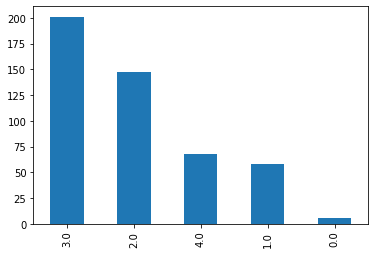

In [8]:
df.rating.value_counts().plot(kind="bar")

In [9]:
from purging import detect_and_remove_blinking_from

df = detect_and_remove_blinking_from(df, ['pupil_dilation', 'baseline'])
df.head()

INFO:root:blinking (0.0) values were found in the data!
INFO:root:blinking values have been removed!
INFO:root:consider running outlier detection to clean your data!
INFO:root:number of data points in pupil_dilation 143833
INFO:root:number of data points in baseline: 42350
INFO:root:number of blinks removed from pupil_dilation: 5222, 3.6305993756648336%
INFO:root:number of blinks removed from baseline: 4349, 10.269185360094452%


,trial_id,pupil_dilation,baseline,rating,len_pupil_dilation,len_baseline
0,9,"[3.520431518554688, 3.523712158203125, 3.53025...","[3.186676025390625, 3.186676025390625, 3.18531...",0.0,298,88
1,29,"[3.508941650390625, 3.516250610351562, 3.49847...","[3.236419677734375, 3.236419677734375, 3.23725...",2.0,299,87
2,7,"[3.148483276367188, 3.149520874023438, 3.16592...","[3.209625244140625, 3.219696044921875, 3.22065...",3.0,299,88
3,23,"[3.440841674804688, 3.440841674804688, 3.44296...","[3.3892822265625, 3.405227661132812, 3.4133453...",3.0,300,88
4,16,"[3.4981689453125, 3.4981689453125, 3.476303100...","[2.198760986328125, 2.9305419921875, 3.3592987...",3.0,300,87


### Plot the Original Data

In [10]:
# Build collections of tuples(label, time-series)
pupil_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.pupil_dilation)]
baseline_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.baseline)]

In [11]:
from visualizing import plot_collection

# Plot with zero values removed
HTML(plot_collection(4, pupil_collection).to_html())

INFO:root:total number of graphs: 480
/usr/local/lib/python3.8/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.


INFO:root:plots: 68


### Data Transformations and Purging

#### RELATIVE CALCULATED FIELD AND LENGTH NORM

In [12]:
from preprocessing import add_relative_to_baseline

df = add_relative_to_baseline('pupil_dilation', df)
df = df.loc[:, ["trial_id","pupil_dilation", "baseline", "relative_pupil_dilation","baseline_mean", "len_pupil_dilation", "len_baseline", "rating"]]
df.head()

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating
0,9,"[3.520431518554688, 3.523712158203125, 3.53025...","[3.186676025390625, 3.186676025390625, 3.18531...","[0.1497679623690522, 0.15304860201748927, 0.15...",3.370664,298,88,0.0
1,29,"[3.508941650390625, 3.516250610351562, 3.49847...","[3.236419677734375, 3.236419677734375, 3.23725...","[0.13551225333378225, 0.1428212132947193, 0.12...",3.373429,299,87,2.0
2,7,"[3.148483276367188, 3.149520874023438, 3.16592...","[3.209625244140625, 3.219696044921875, 3.22065...","[-0.08601094908633433, -0.08497335143008433, -...",3.234494,299,88,3.0
3,23,"[3.440841674804688, 3.440841674804688, 3.44296...","[3.3892822265625, 3.405227661132812, 3.4133453...","[-0.07551773734714651, -0.07551773734714651, -...",3.516359,300,88,3.0
4,16,"[3.4981689453125, 3.4981689453125, 3.476303100...","[2.198760986328125, 2.9305419921875, 3.3592987...","[0.16579437255859375, 0.16579437255859375, 0.1...",3.332375,300,87,3.0


To train our ML-models is common that we need the time-series with the same lenght. For that we normalize them using interpolation:

In [13]:
from preprocessing import normalize_lengths

df.pupil_dilation = normalize_lengths(df.pupil_dilation.tolist())
df['baseline'] = normalize_lengths(df.baseline.tolist())
df['relative_pupil_dilation'] = normalize_lengths(df.relative_pupil_dilation.tolist())

INFO:root:max_length: 300
INFO:root:max_length: 90
INFO:root:max_length: 300


#### OUTLIER DETECTION + REMOVAL USING IQR

##### By anomaly in single series

INFO:root:experiment index: 2


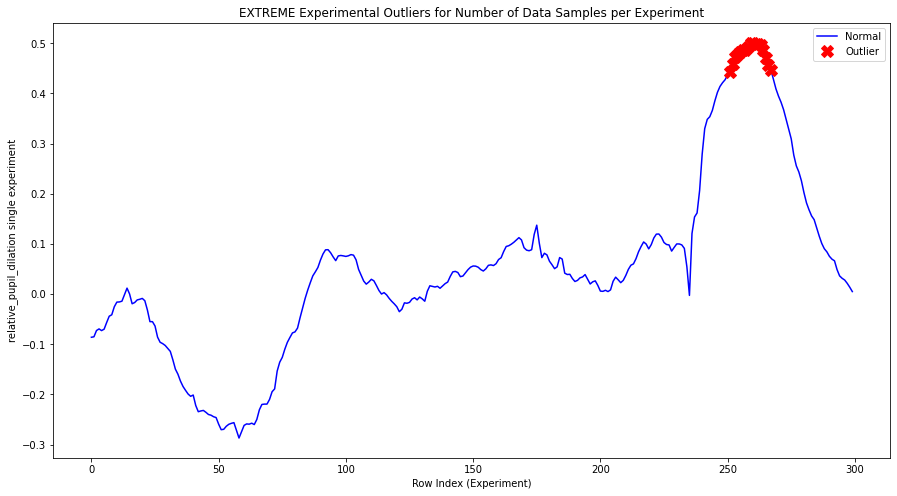

INFO:root:experiment index: 12


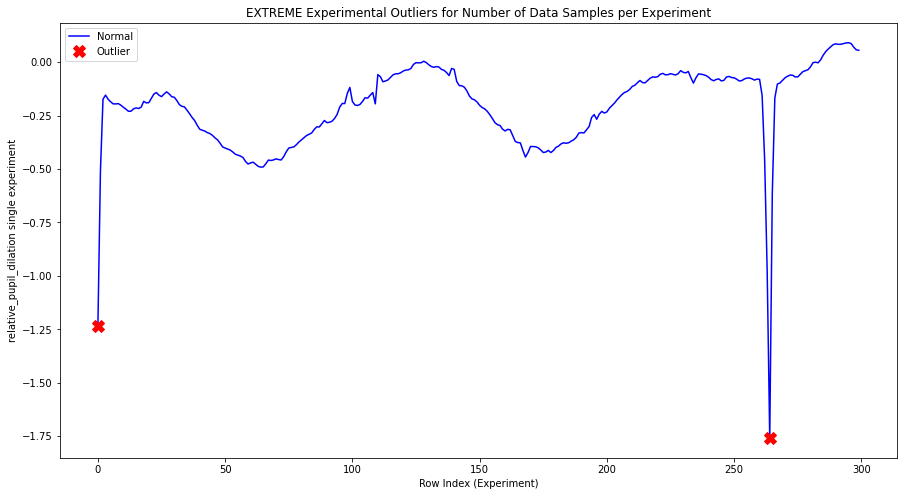

INFO:root:experiment index: 13


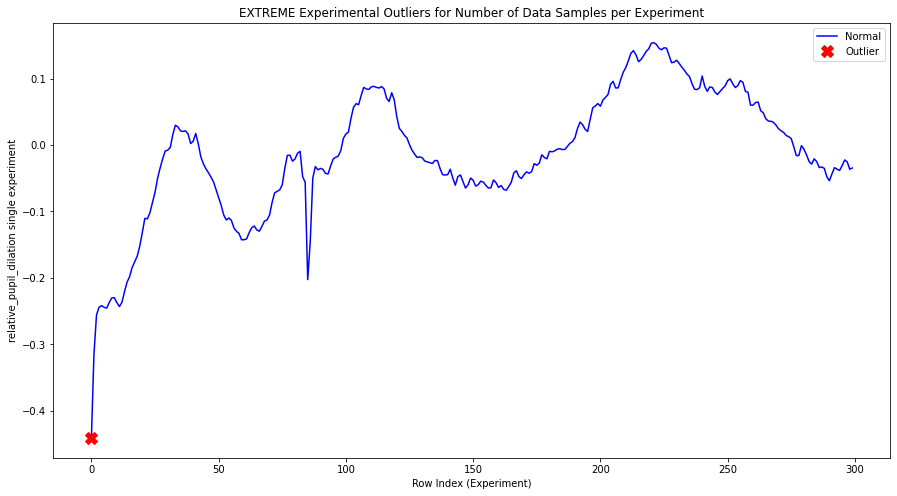

INFO:root:experiment index: 15


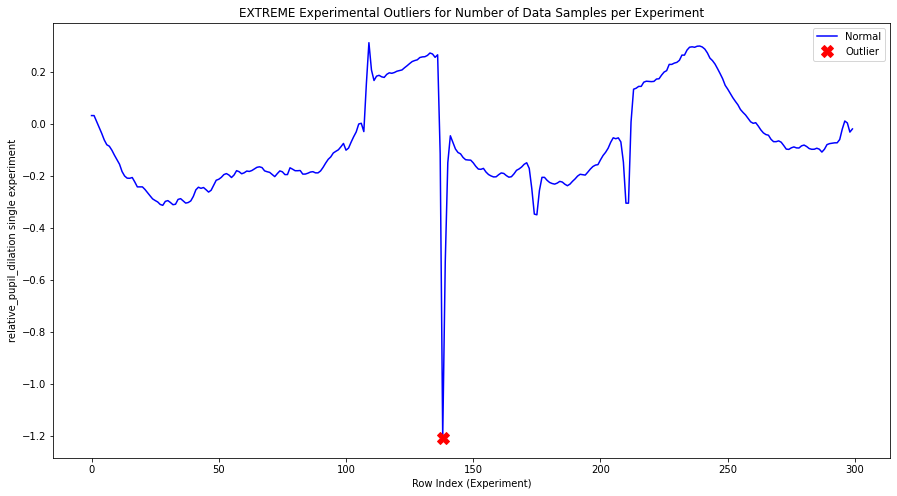

INFO:root:experiment index: 16


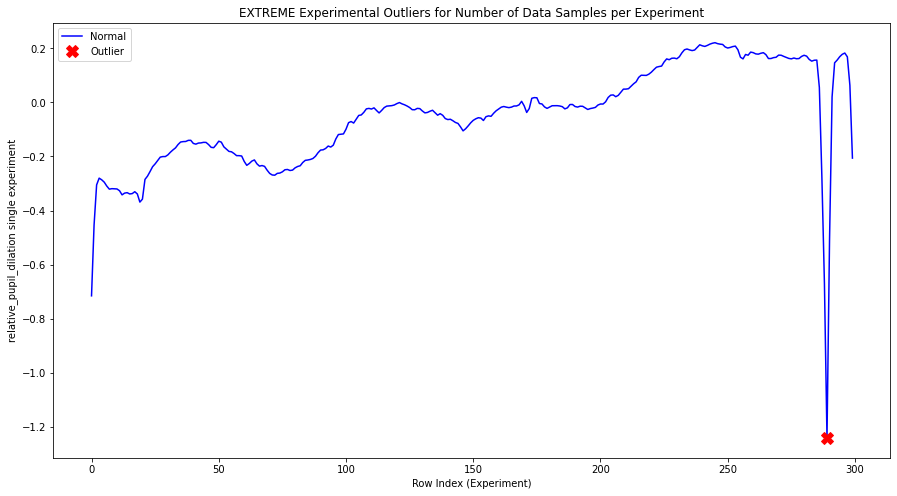

INFO:root:experiment index: 18


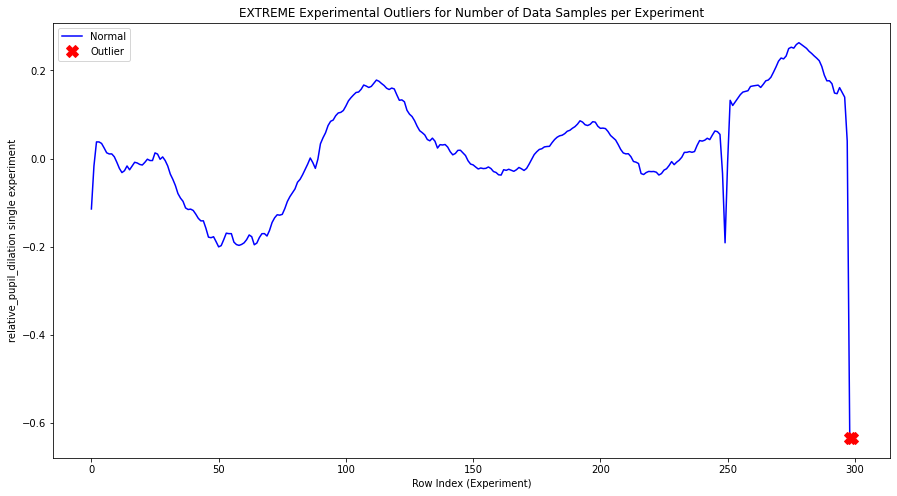

INFO:root:experiment index: 24


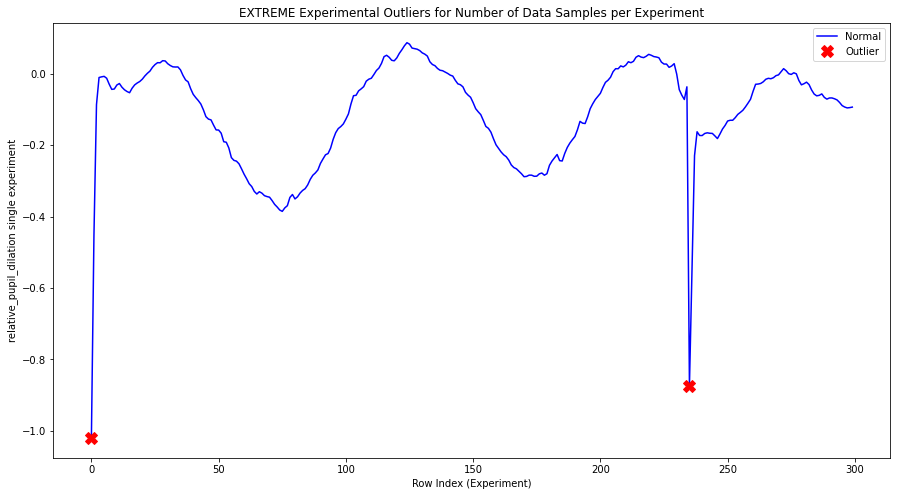

INFO:root:experiment index: 27


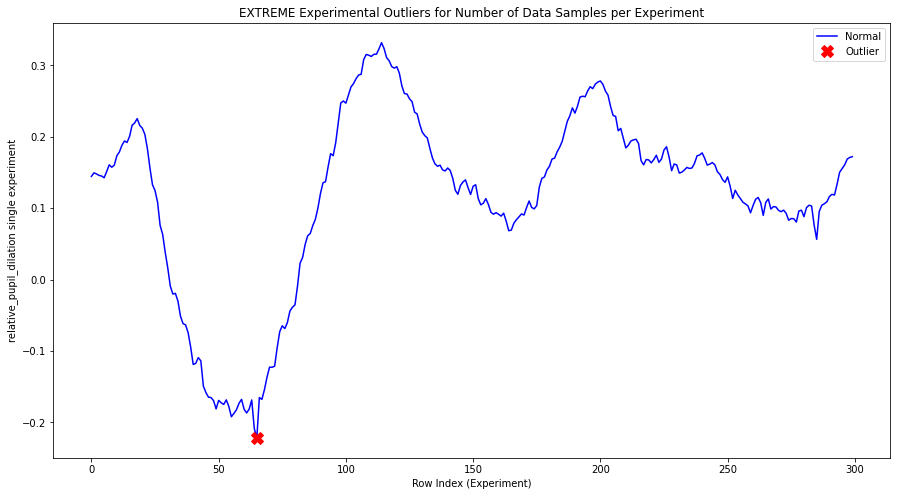

INFO:root:experiment index: 31


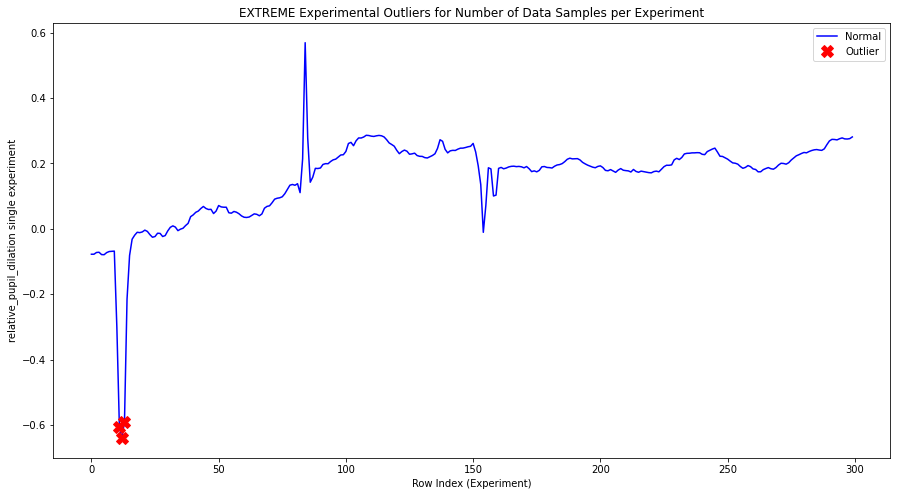

INFO:root:experiment index: 40


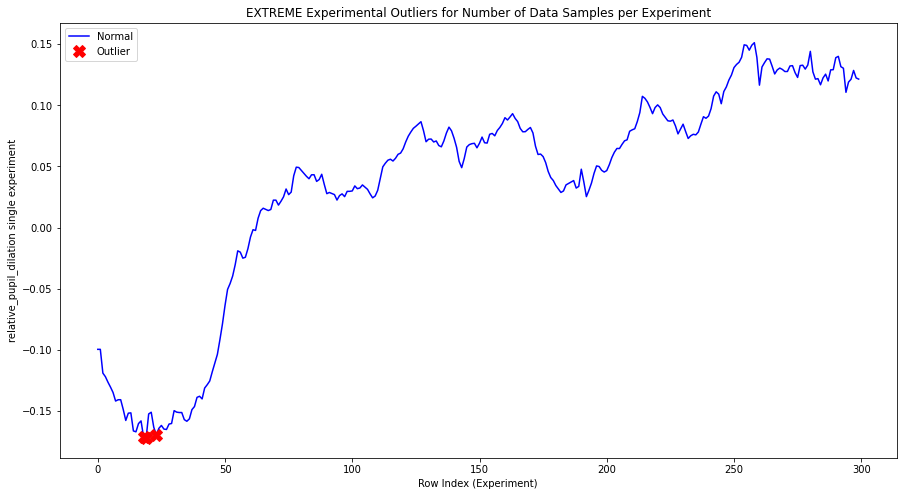

INFO:root:experiment index: 44


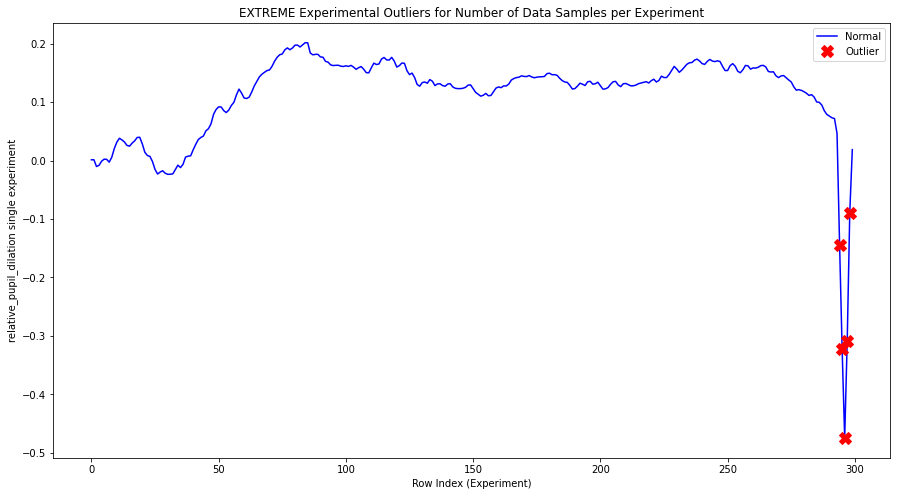

INFO:root:experiment index: 46


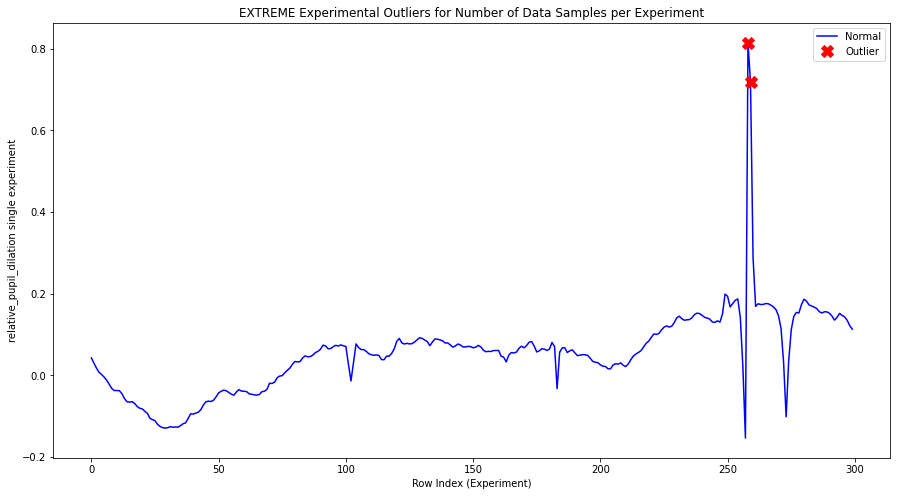

INFO:root:experiment index: 49


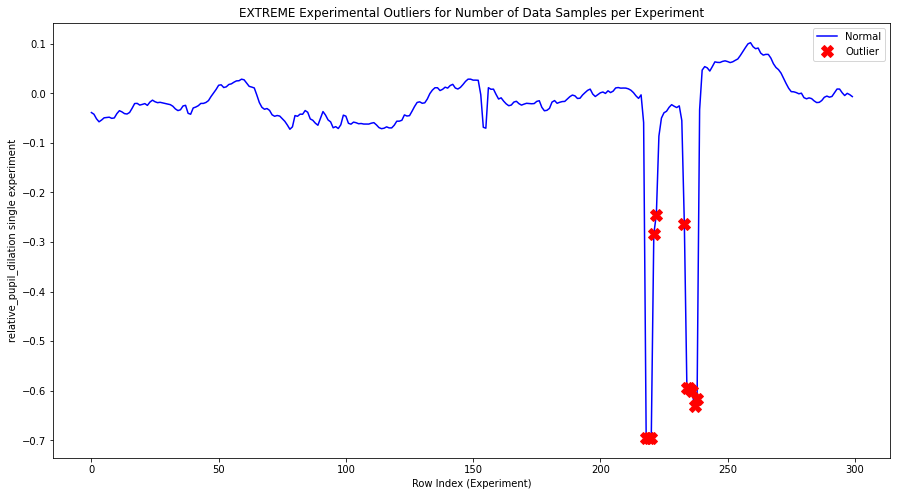

INFO:root:experiment index: 50


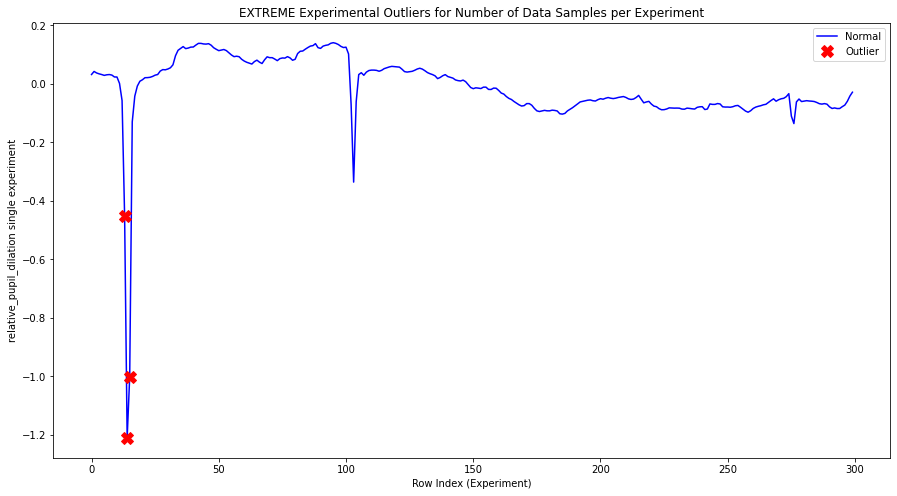

INFO:root:experiment index: 52


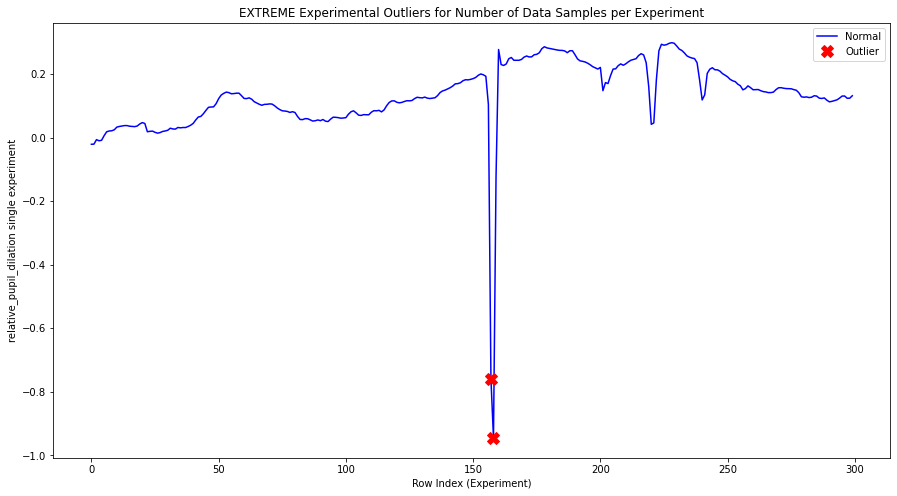

INFO:root:experiment index: 56


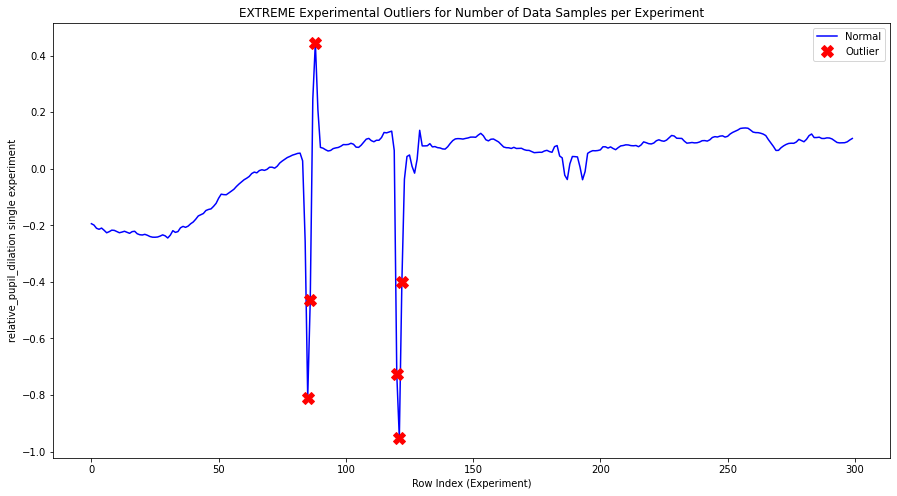

INFO:root:experiment index: 58


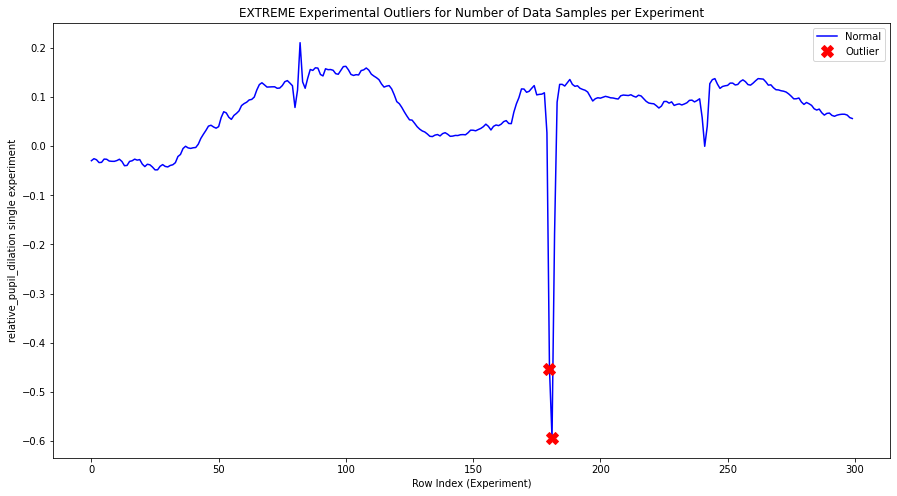

INFO:root:experiment index: 62


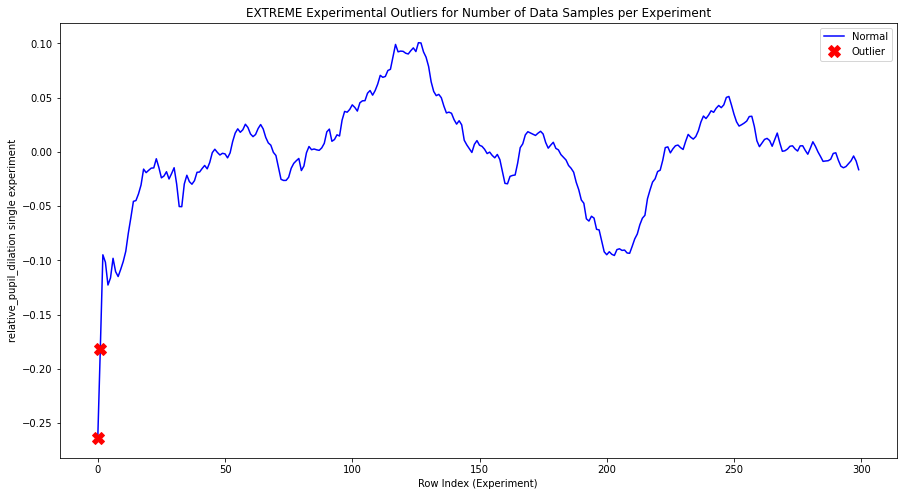

INFO:root:experiment index: 79


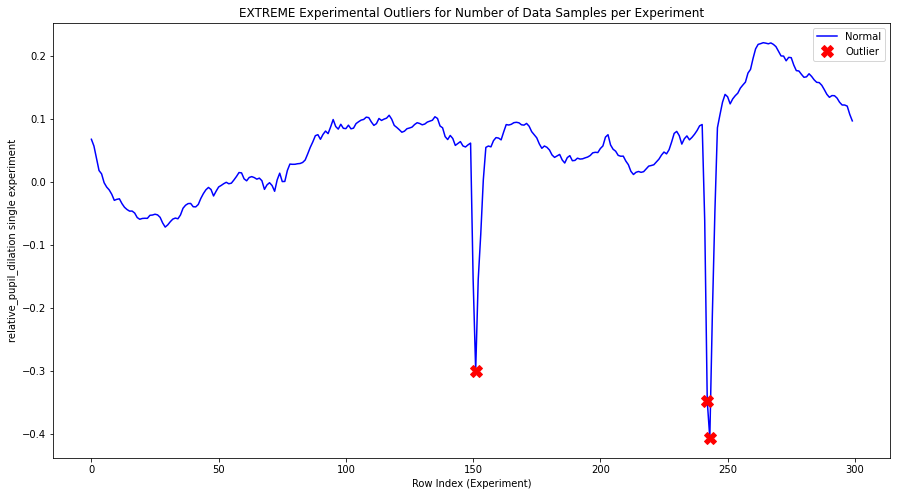

INFO:root:experiment index: 83


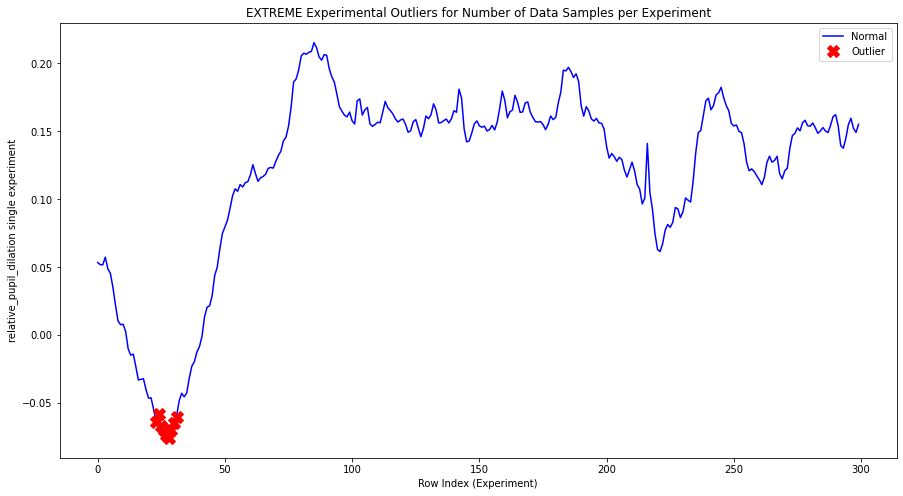

INFO:root:experiment index: 86


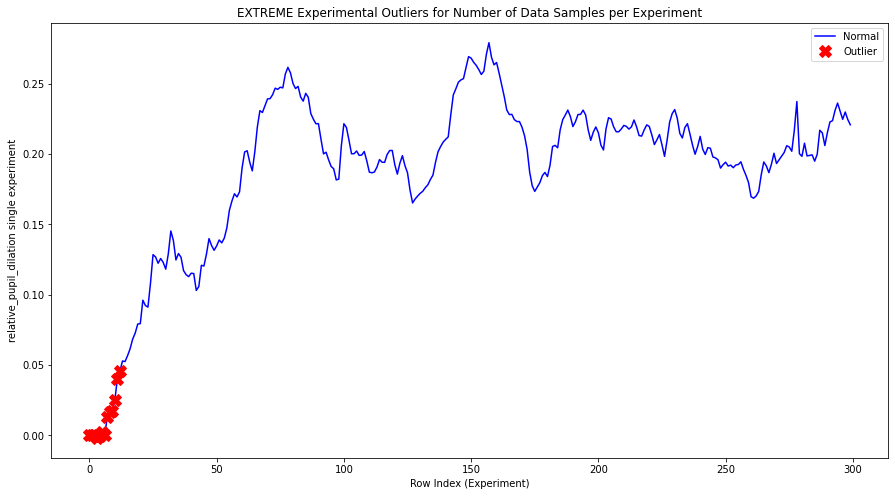

INFO:root:experiment index: 91


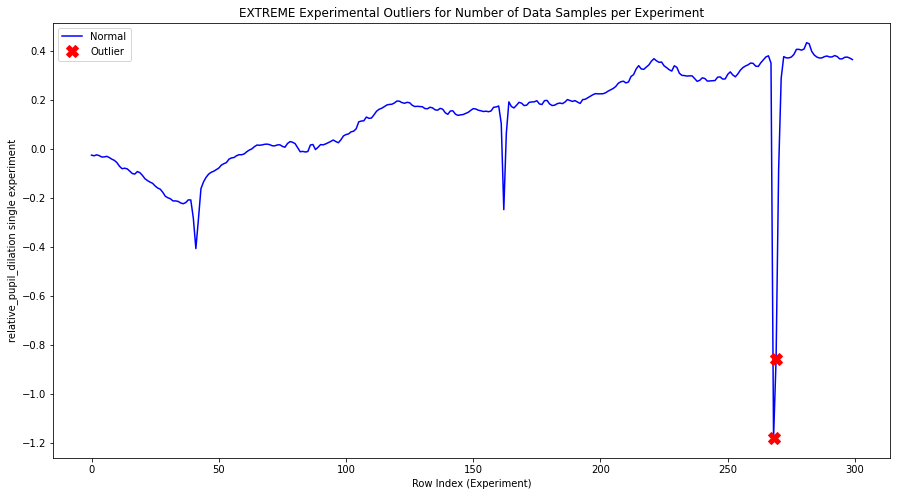

INFO:root:experiment index: 92


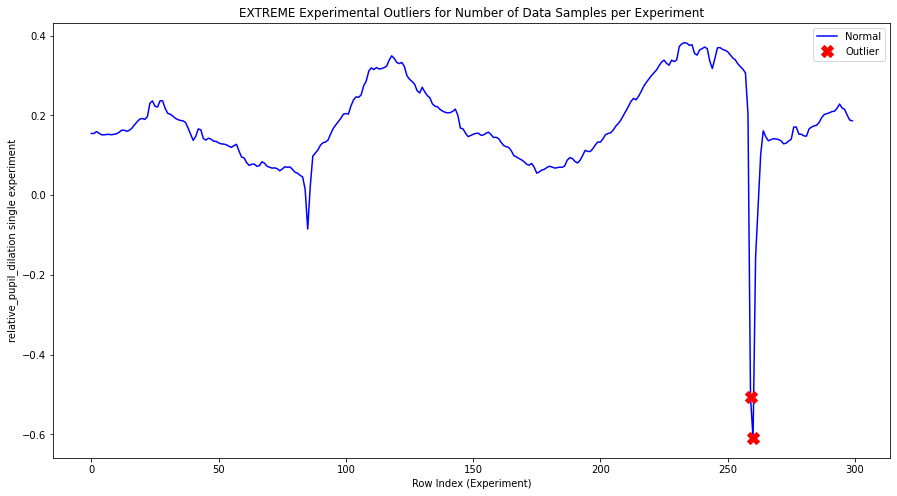

INFO:root:experiment index: 93


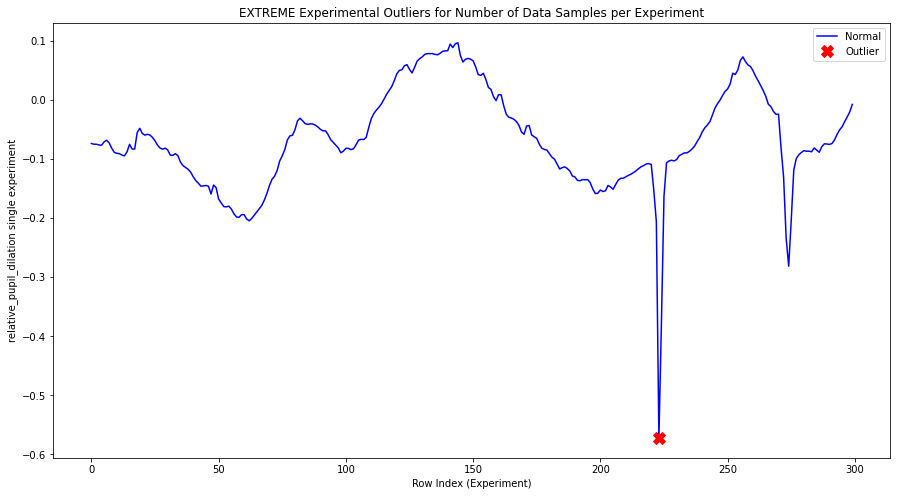

INFO:root:experiment index: 95


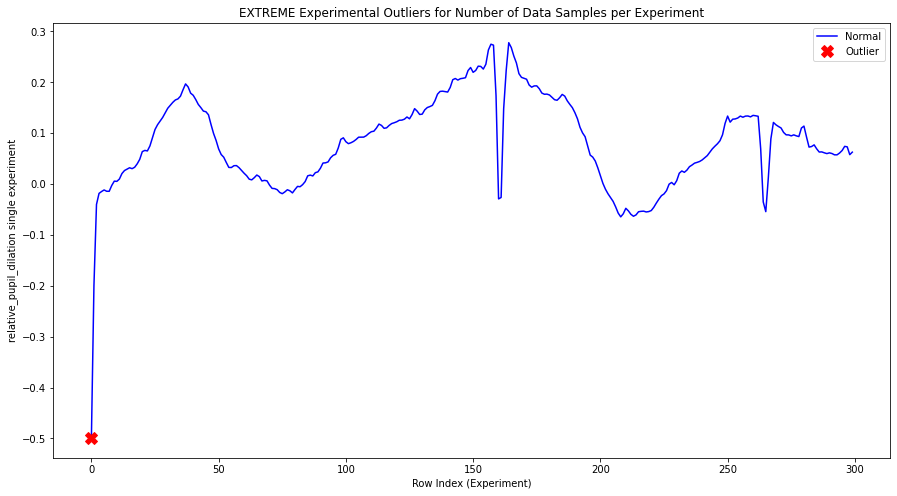

INFO:root:experiment index: 99


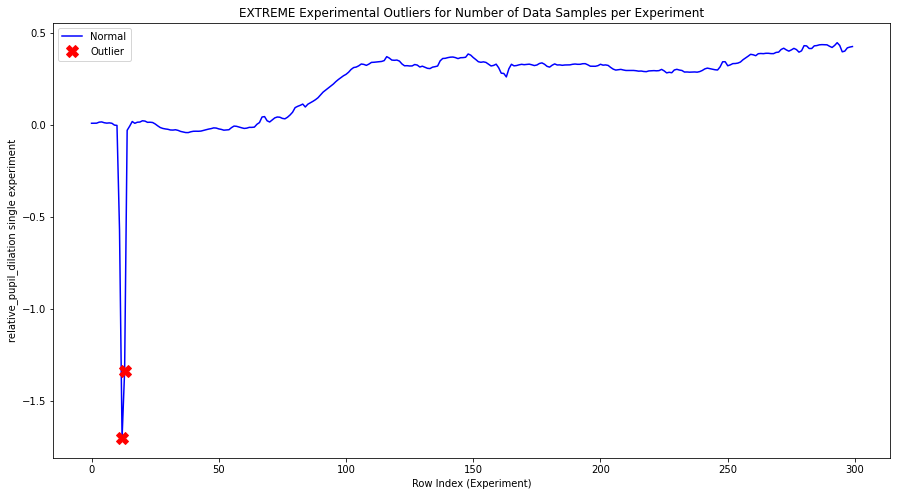

INFO:root:experiment index: 102


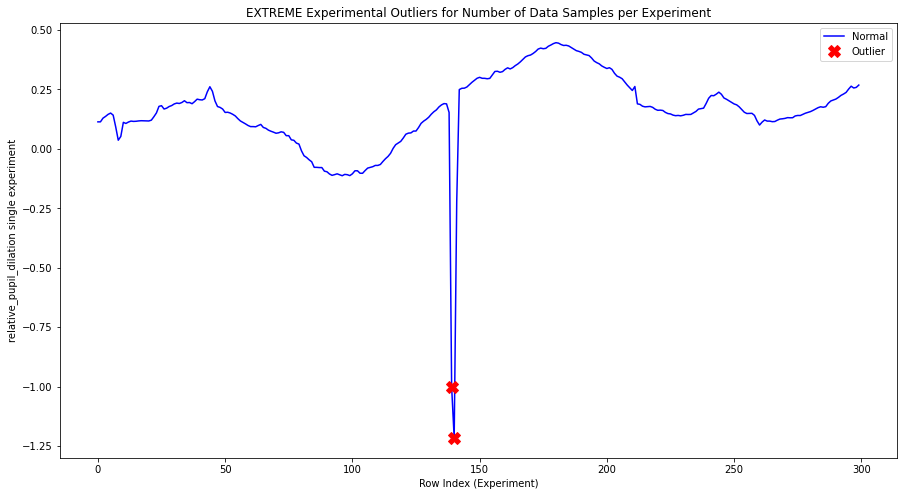

INFO:root:experiment index: 105


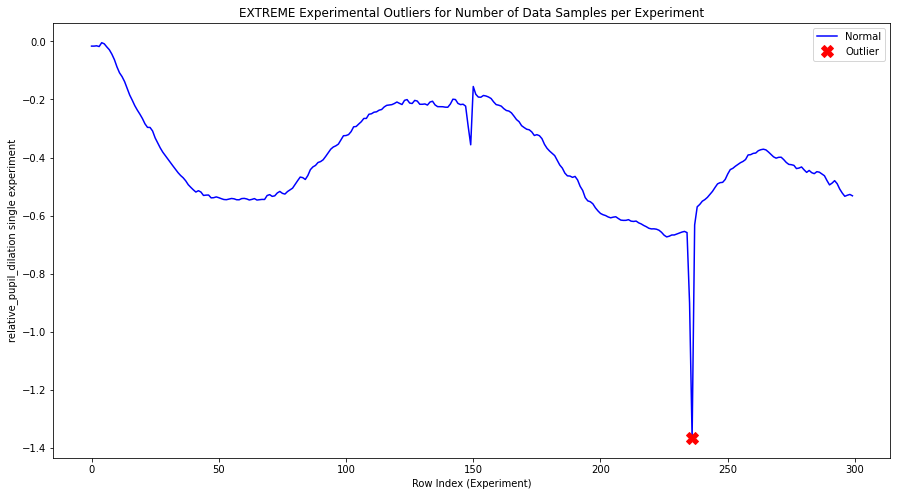

INFO:root:experiment index: 107


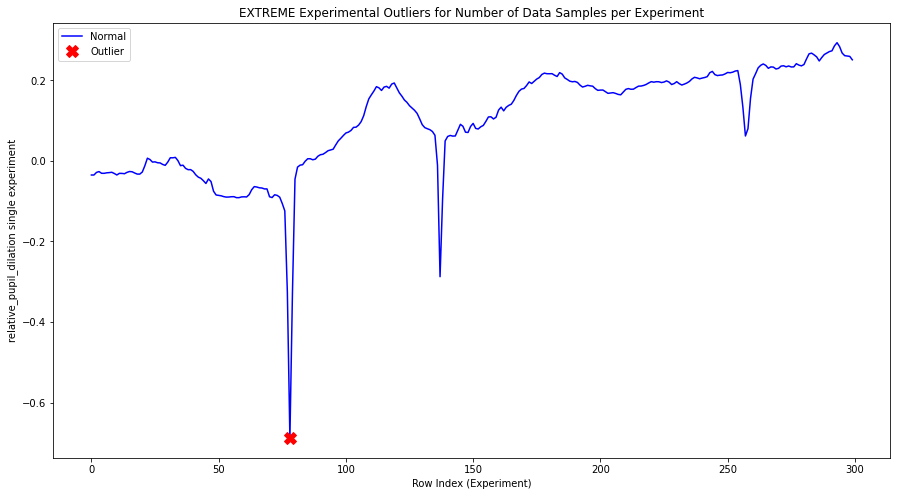

INFO:root:experiment index: 108


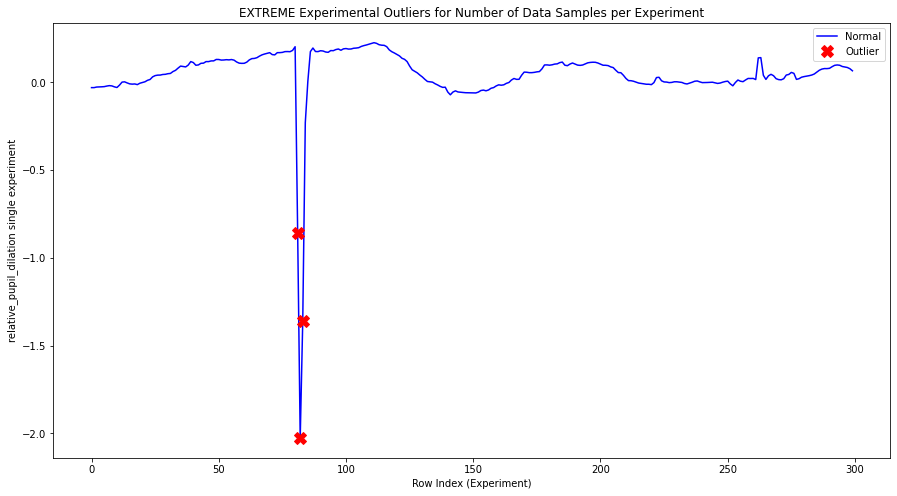

INFO:root:experiment index: 114


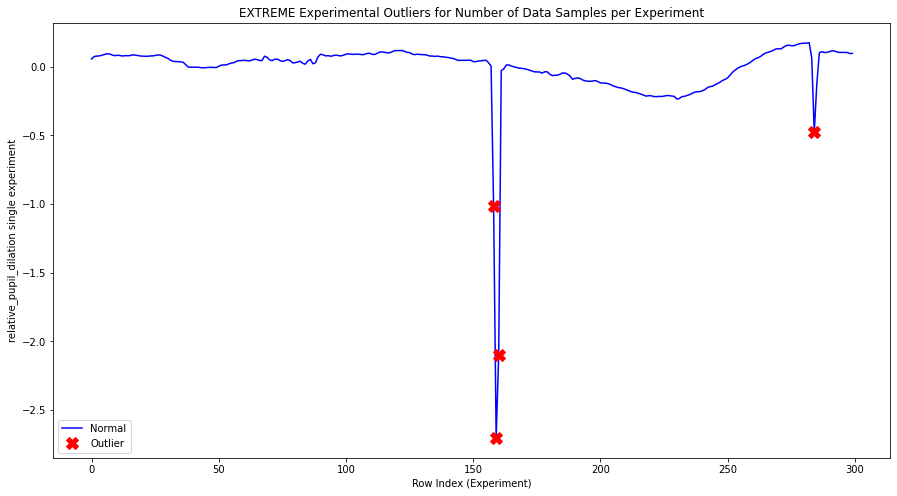

INFO:root:experiment index: 115


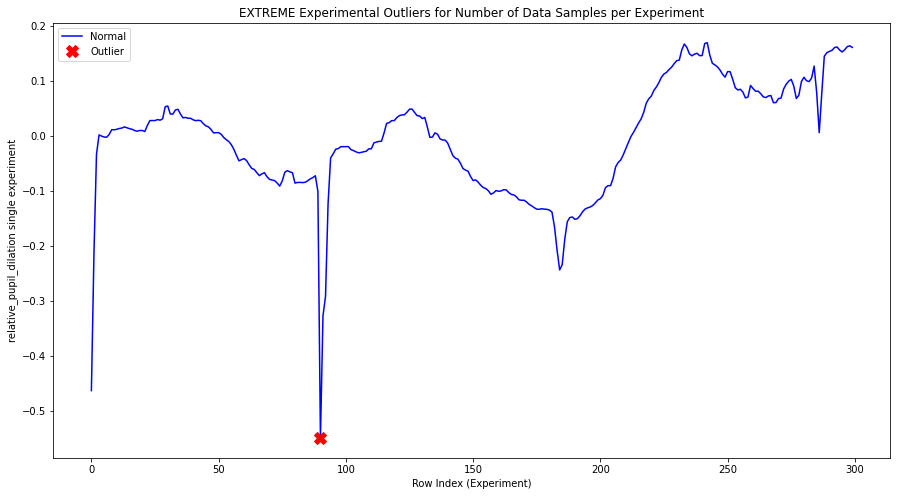

INFO:root:experiment index: 117


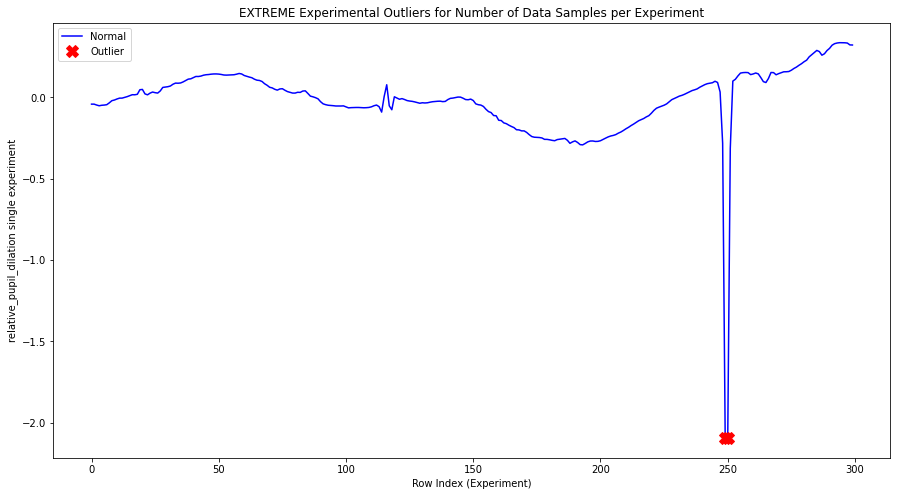

INFO:root:experiment index: 126


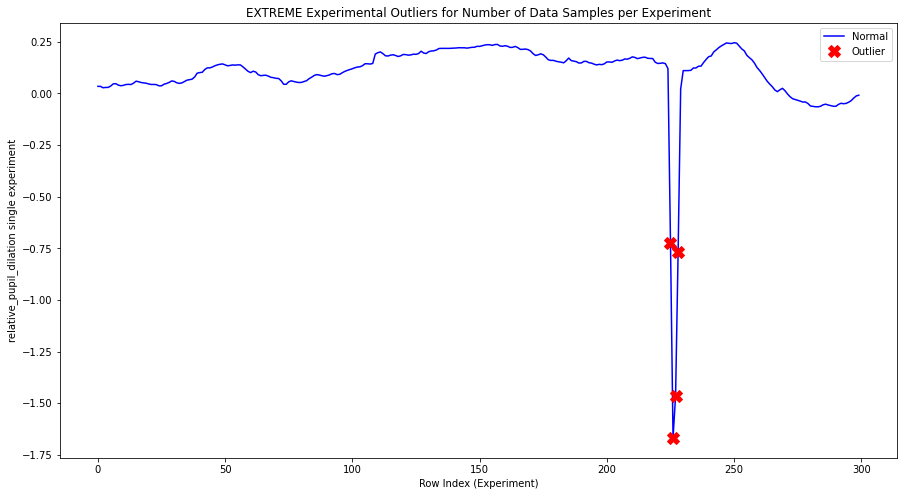

INFO:root:experiment index: 136


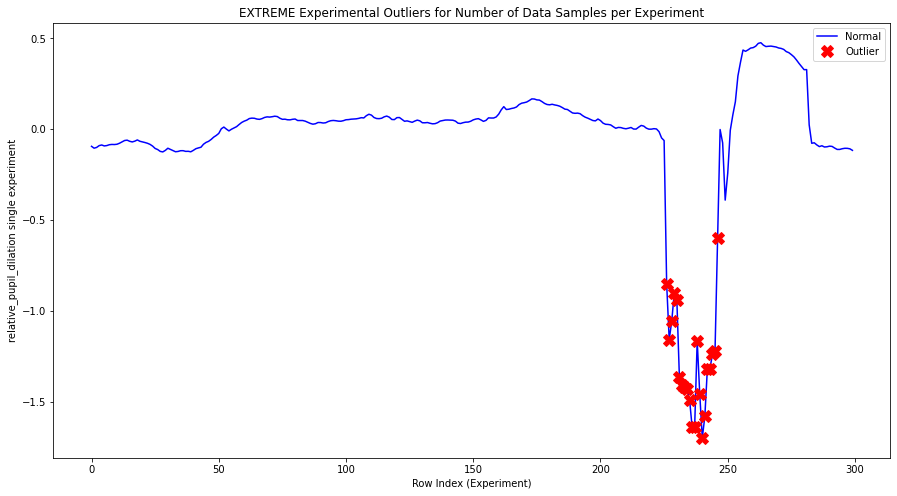

INFO:root:experiment index: 137


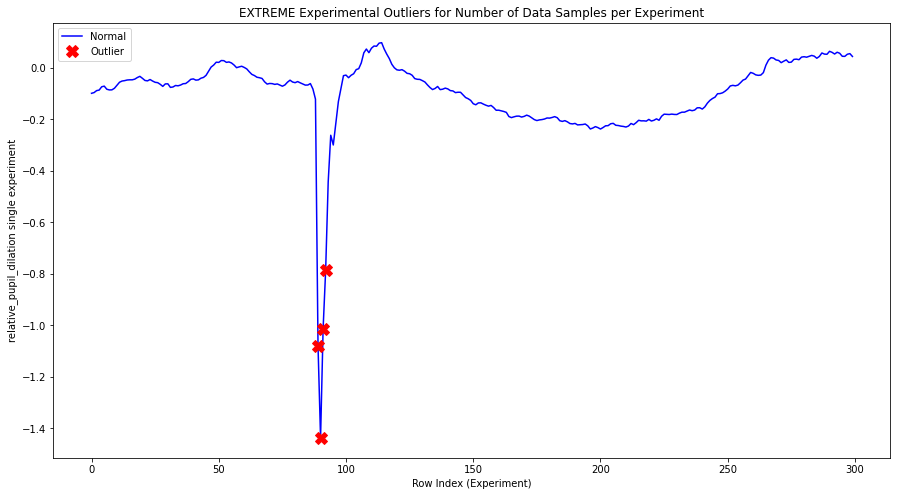

INFO:root:experiment index: 138


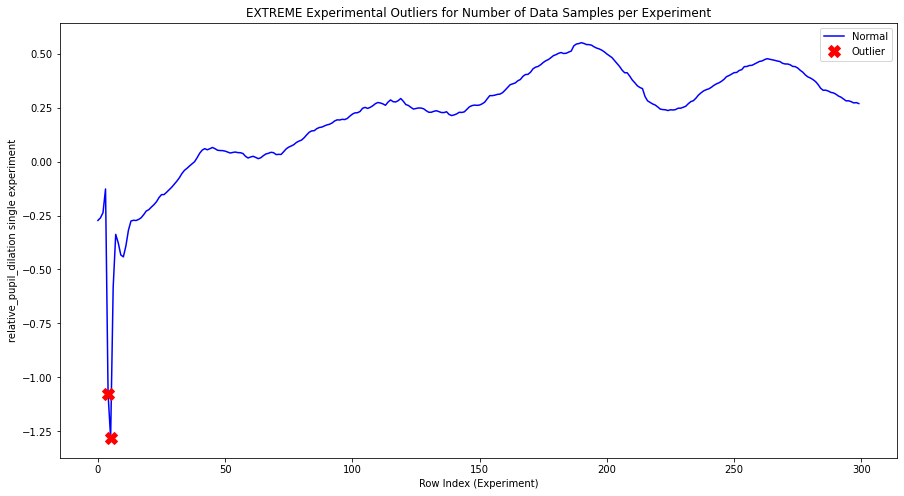

INFO:root:experiment index: 142


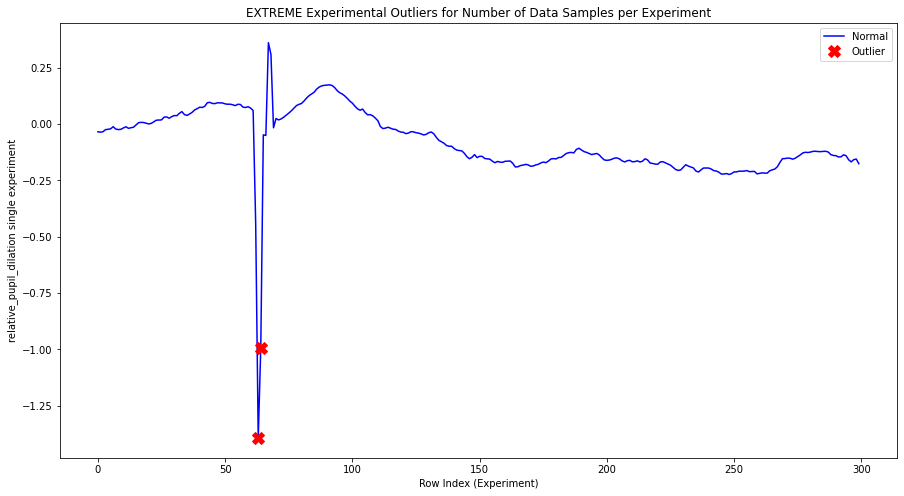

INFO:root:experiment index: 144


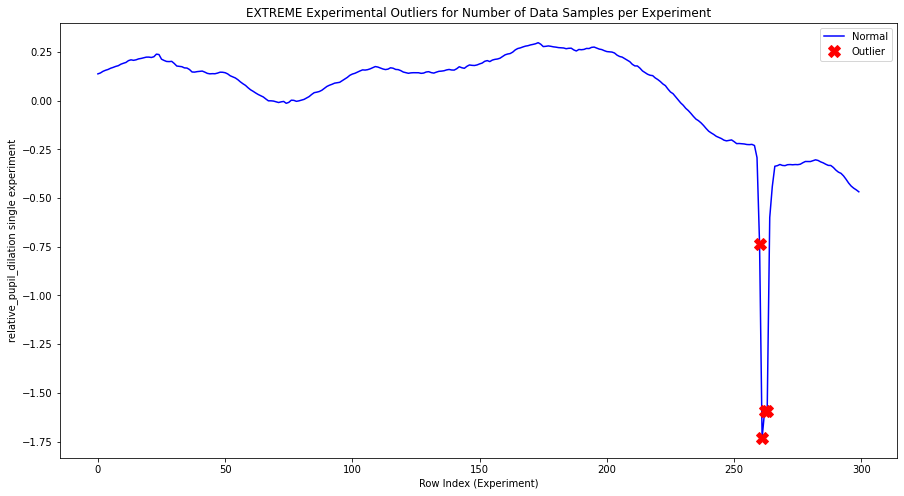

INFO:root:experiment index: 146


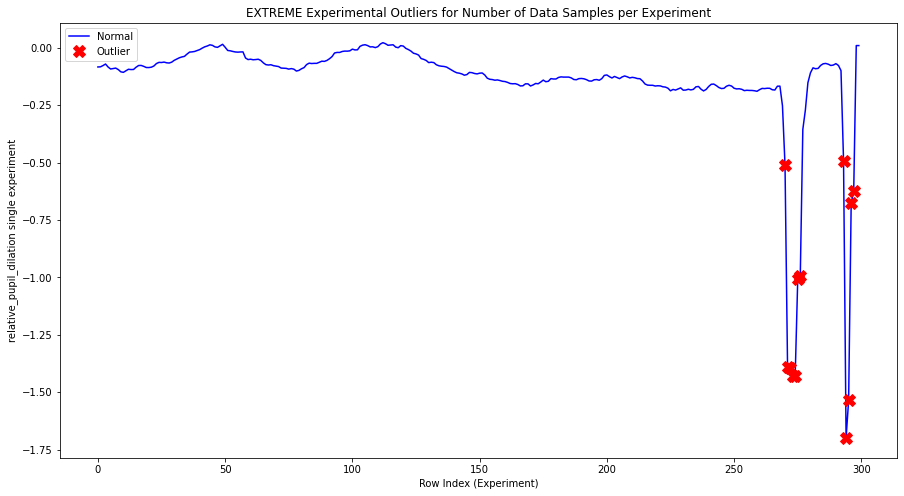

INFO:root:experiment index: 147


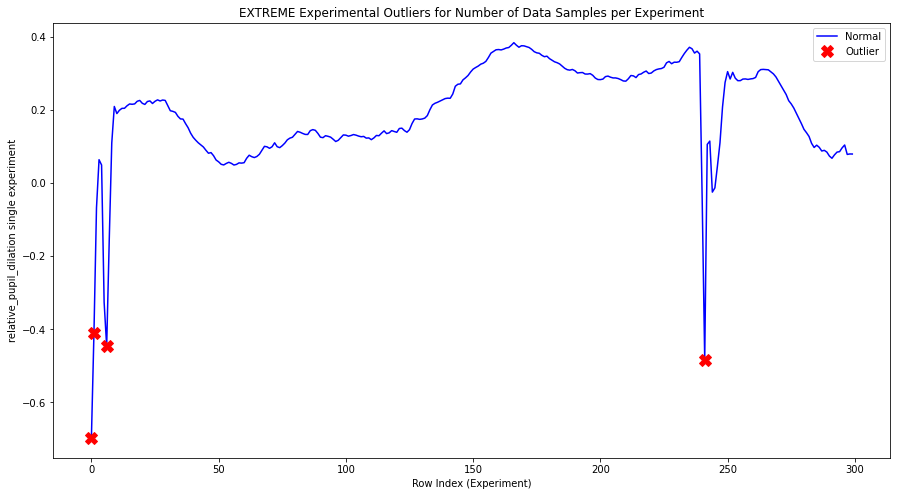

INFO:root:experiment index: 152


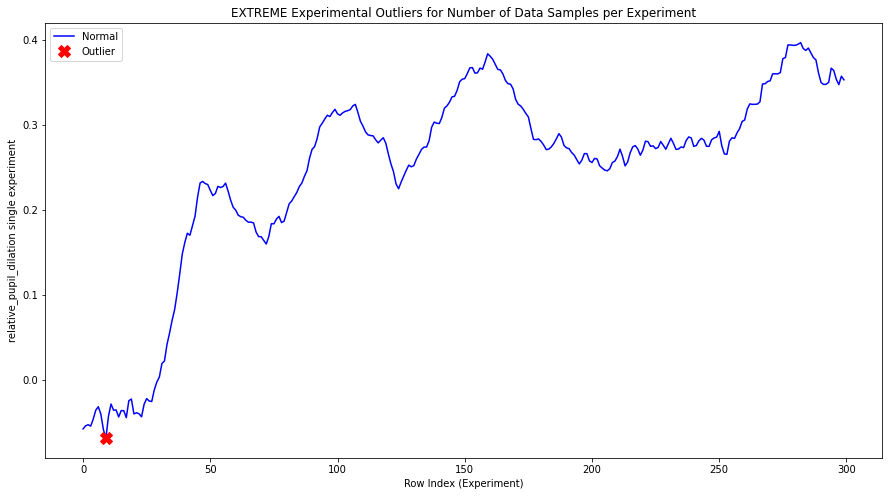

INFO:root:experiment index: 158


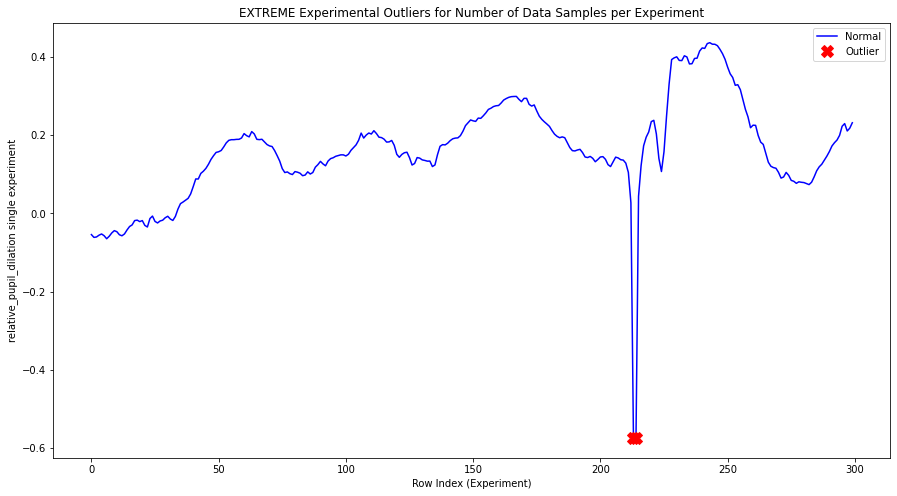

INFO:root:experiment index: 167


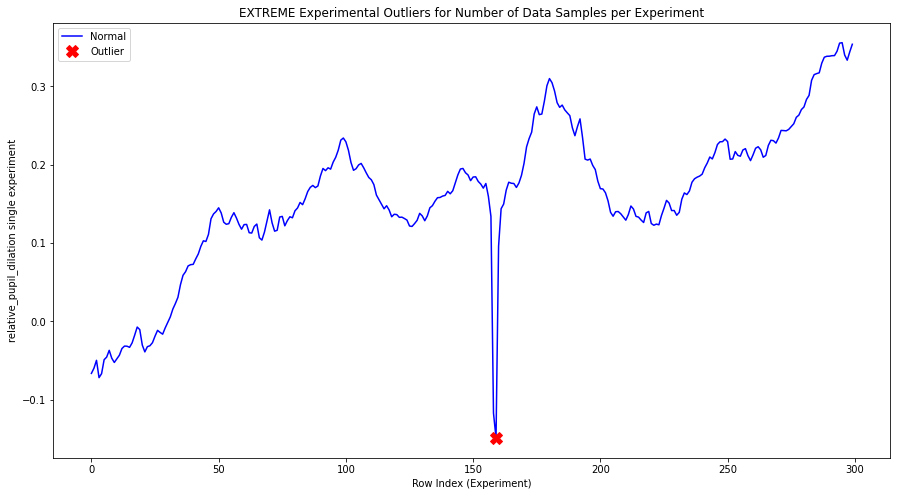

INFO:root:experiment index: 172


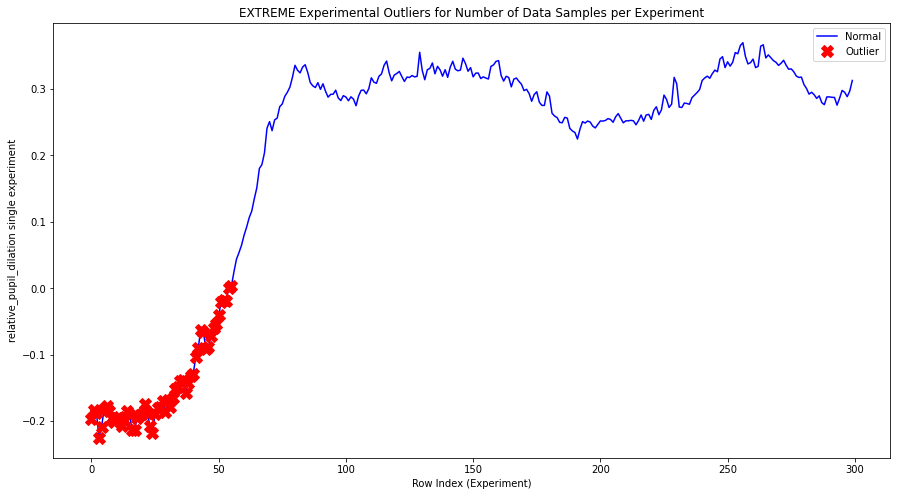

INFO:root:experiment index: 179


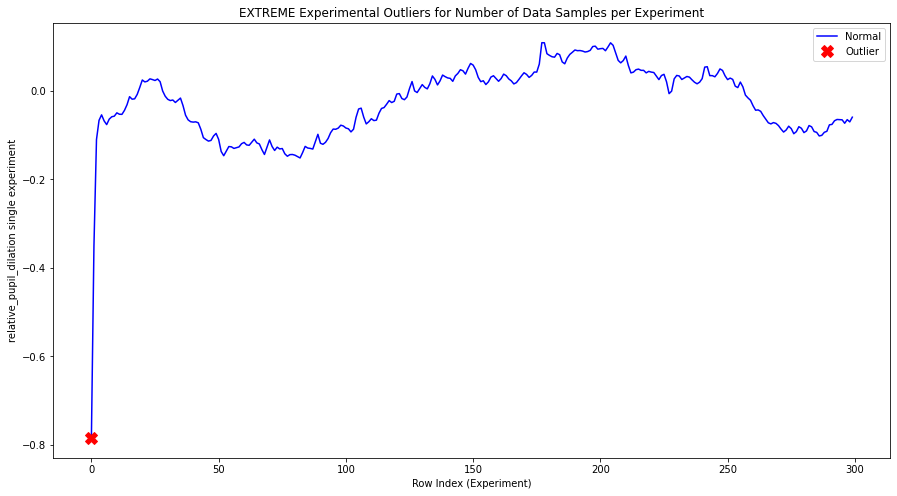

INFO:root:experiment index: 180


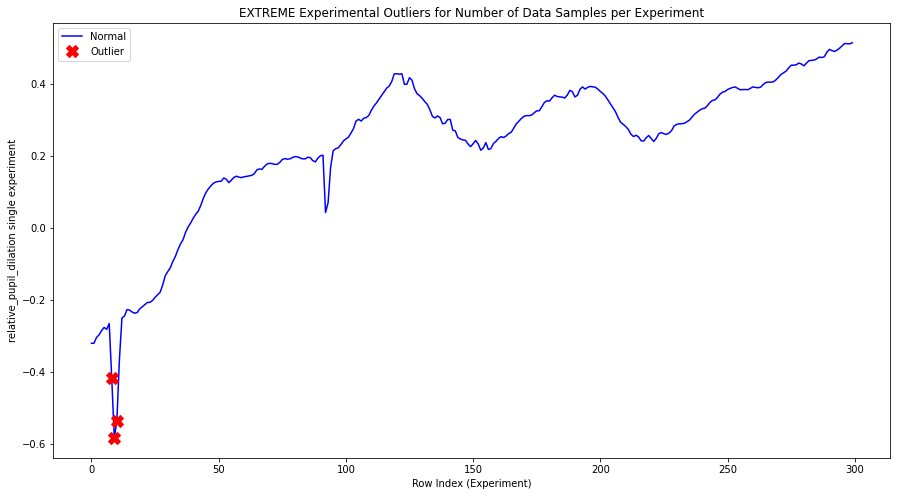

INFO:root:experiment index: 181


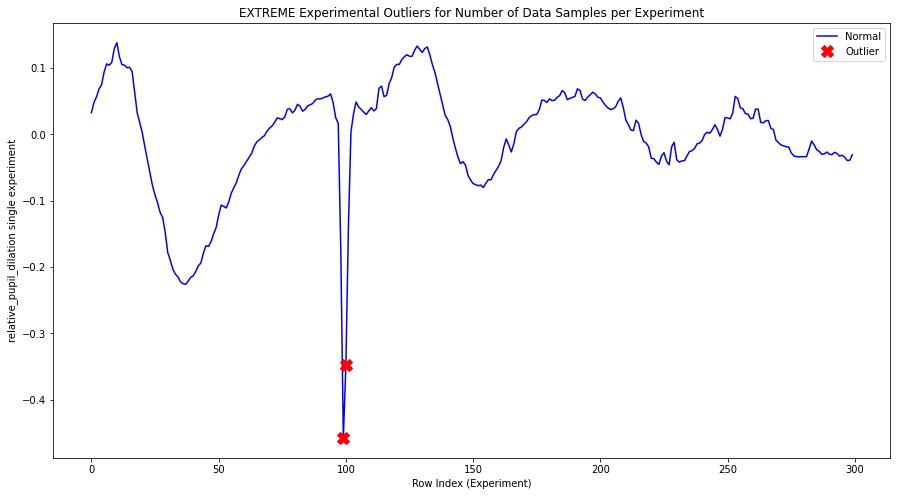

INFO:root:experiment index: 185


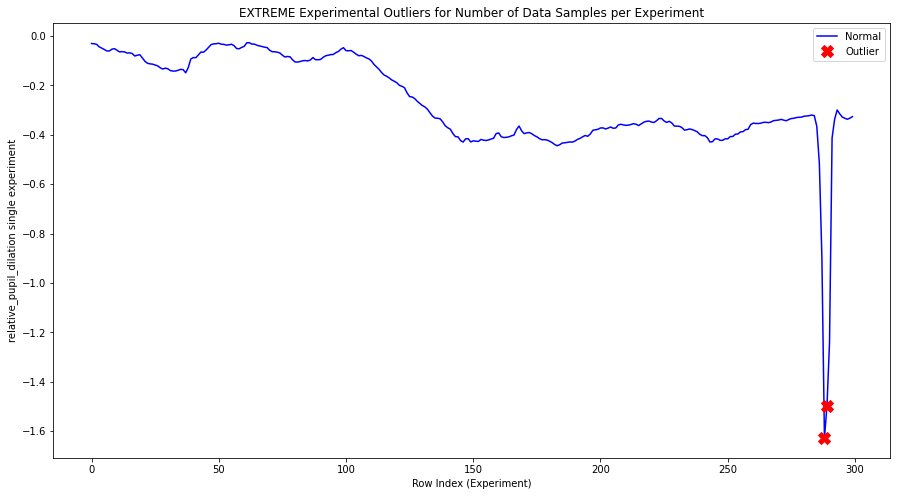

INFO:root:experiment index: 190


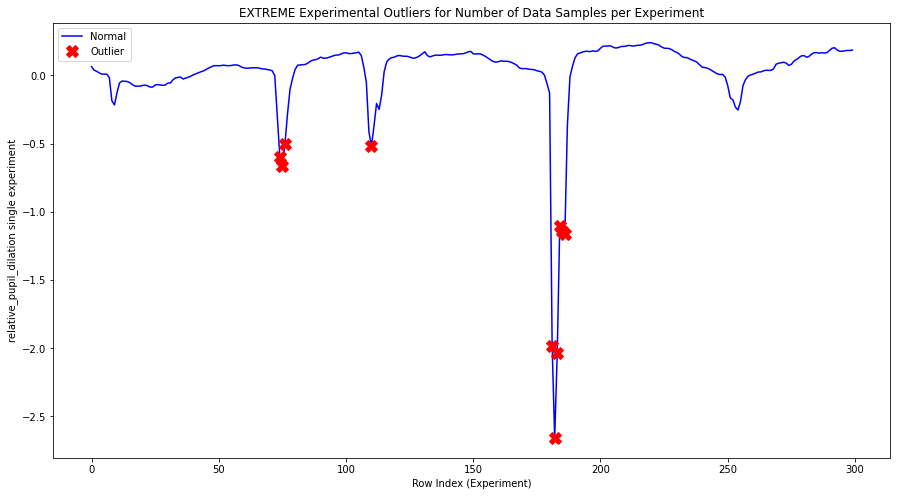

INFO:root:experiment index: 191


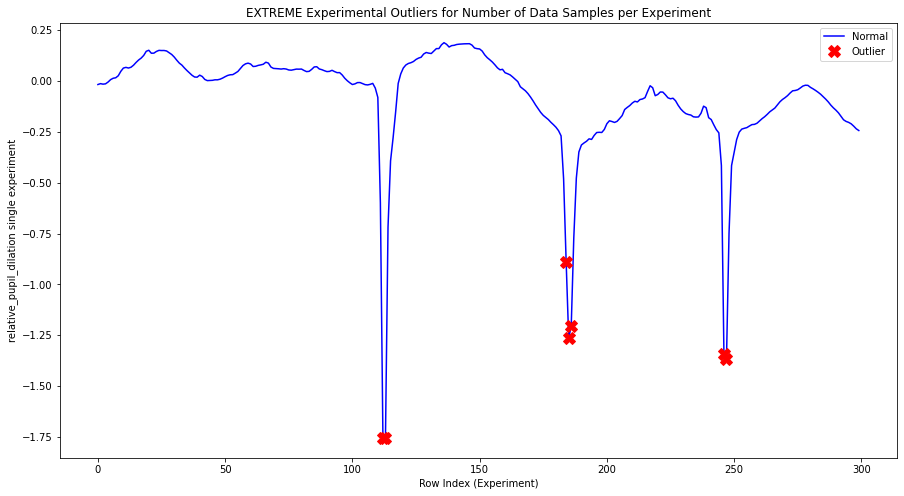

INFO:root:experiment index: 193


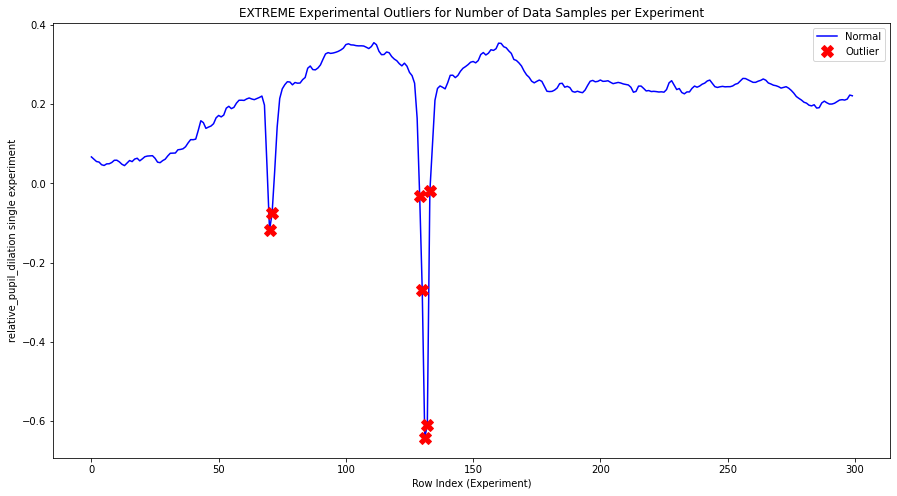

INFO:root:experiment index: 197


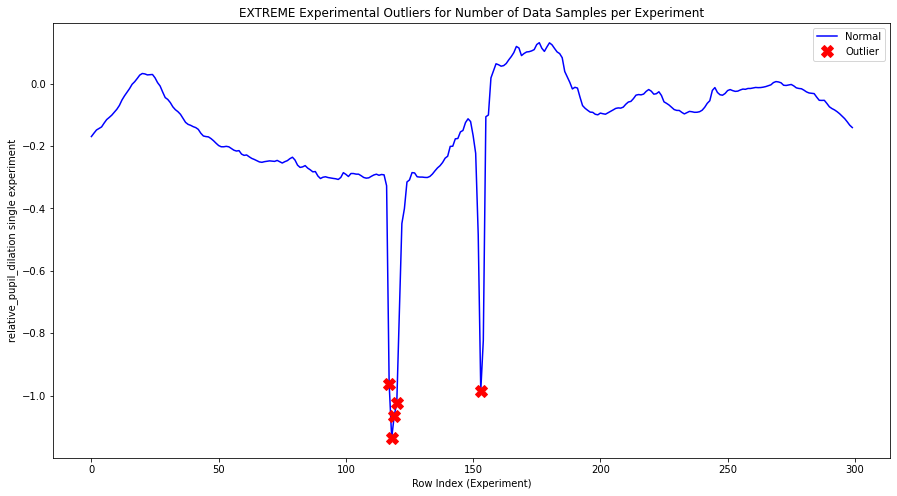

INFO:root:experiment index: 198


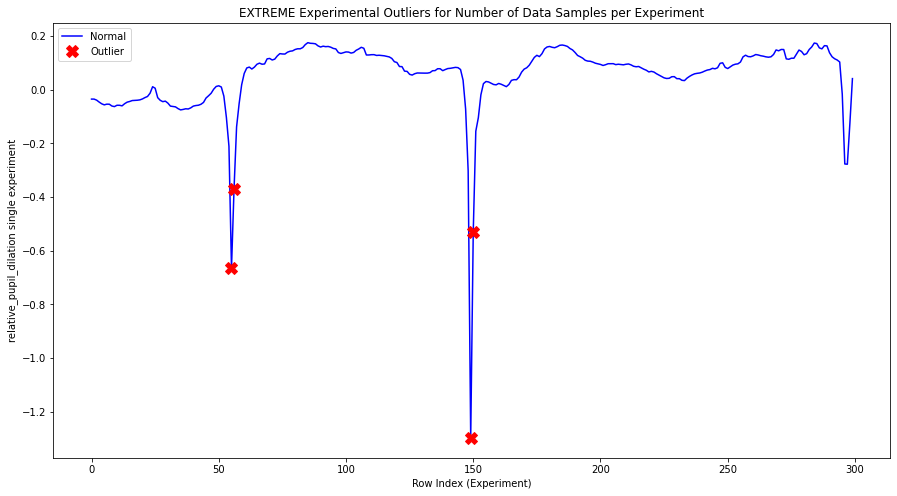

INFO:root:experiment index: 200


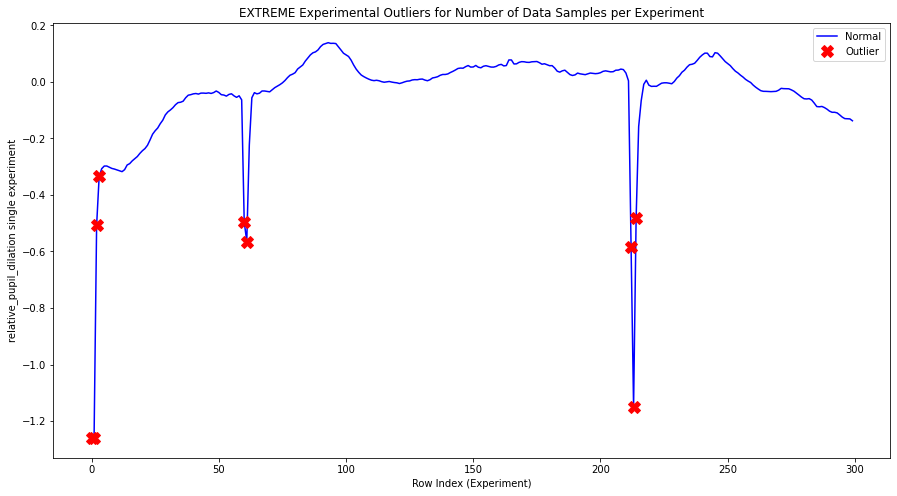

INFO:root:experiment index: 203


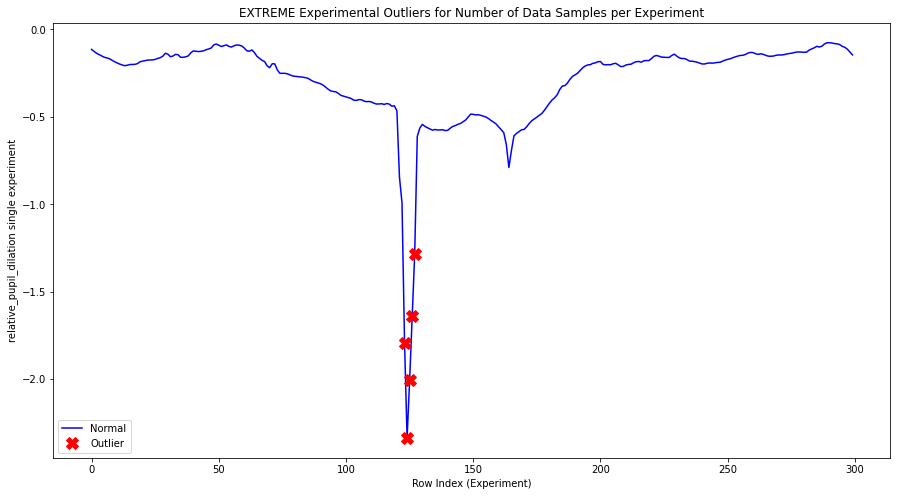

INFO:root:experiment index: 207


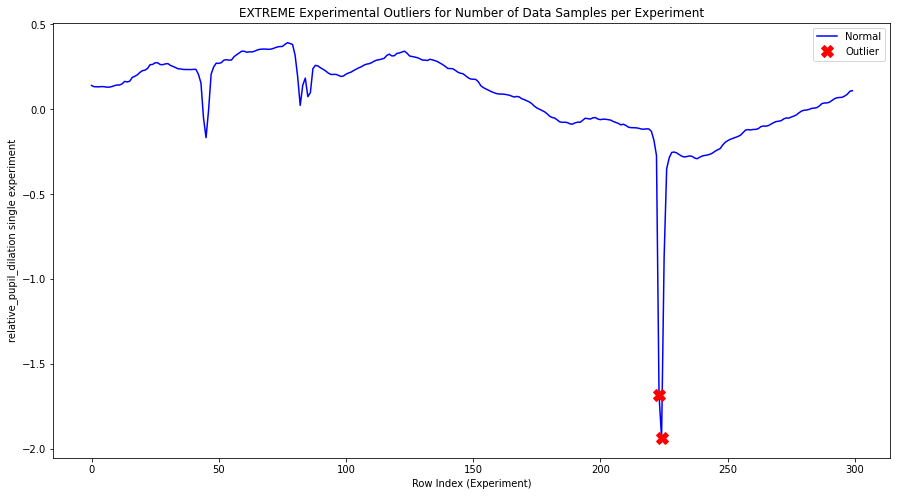

INFO:root:experiment index: 208


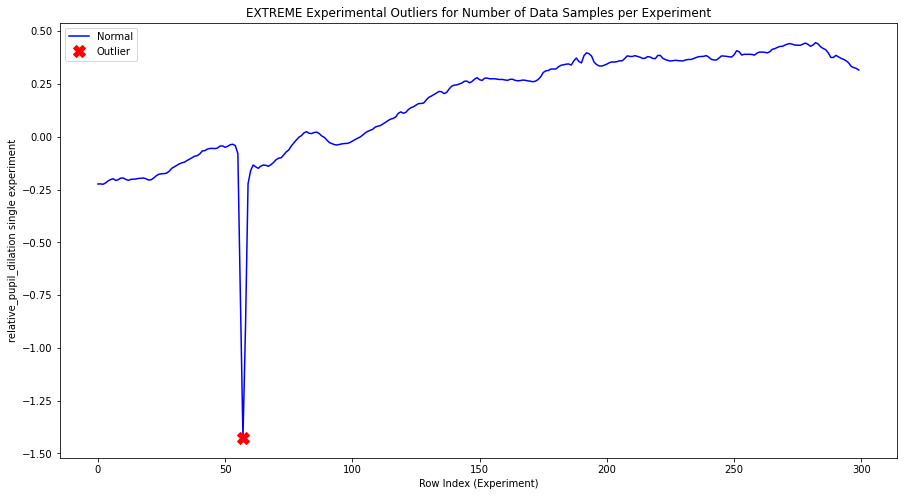

INFO:root:experiment index: 210


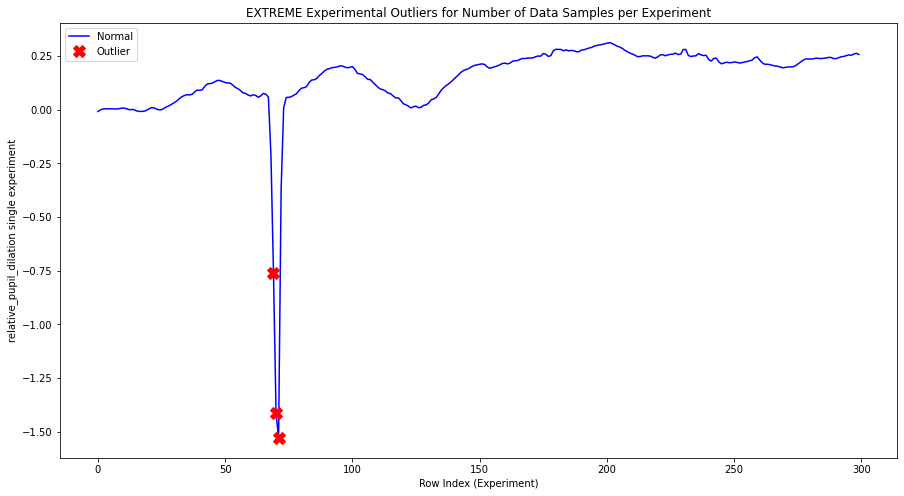

INFO:root:experiment index: 214


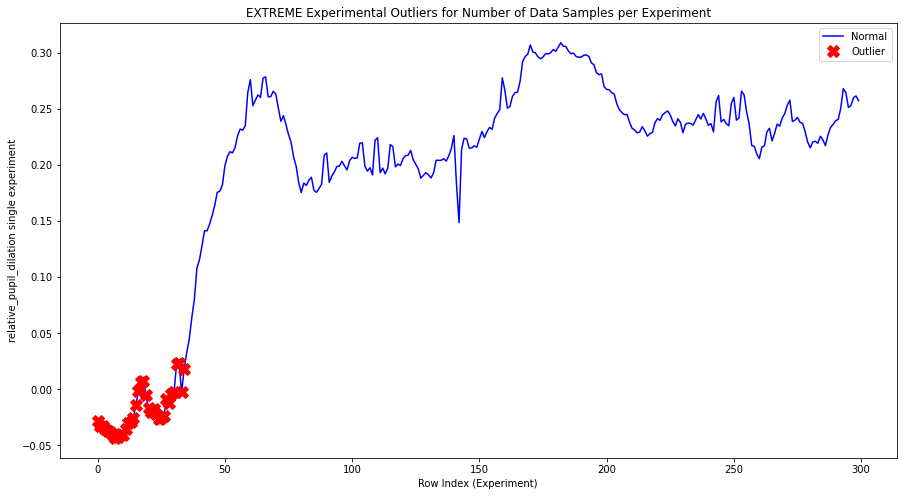

INFO:root:experiment index: 220


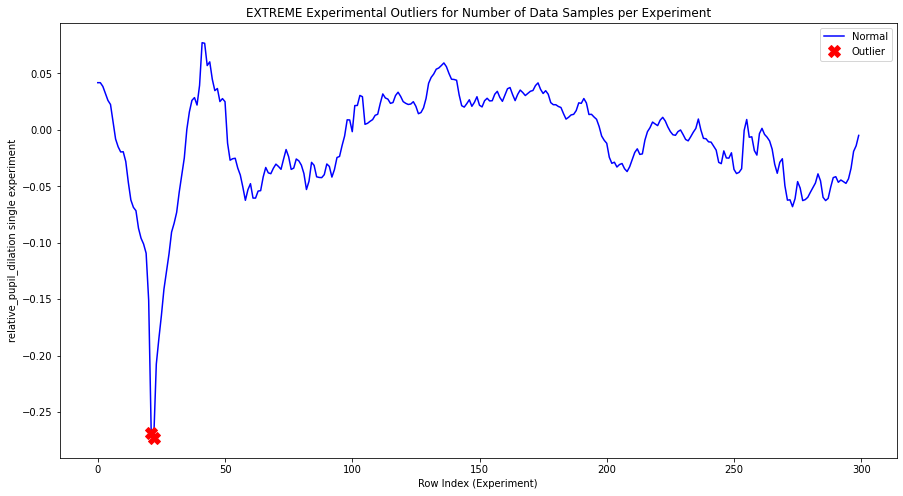

INFO:root:experiment index: 223


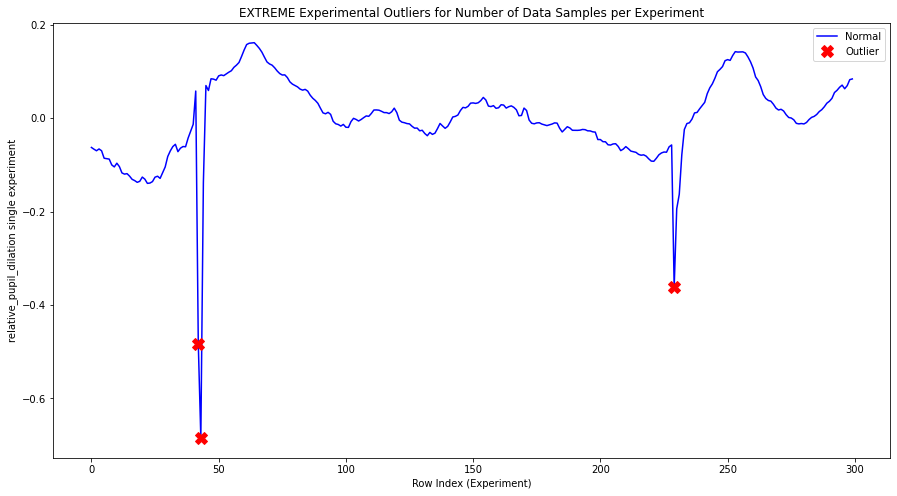

INFO:root:experiment index: 244


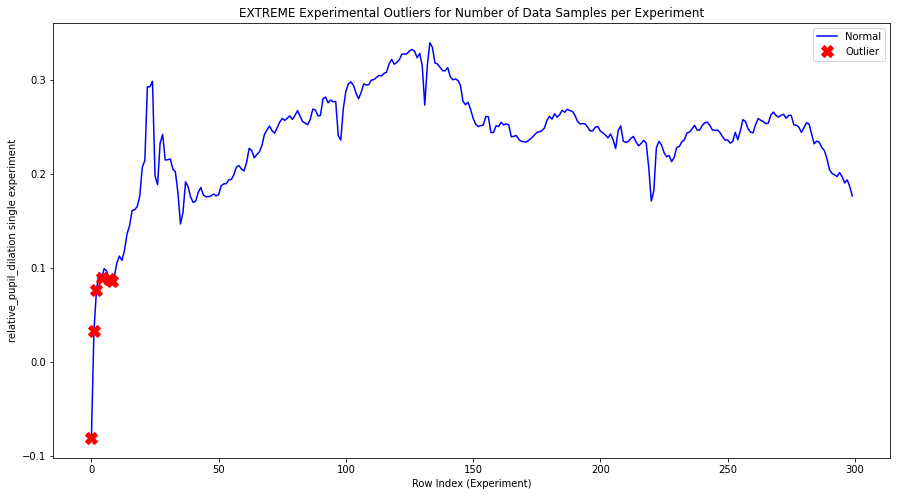

INFO:root:experiment index: 247


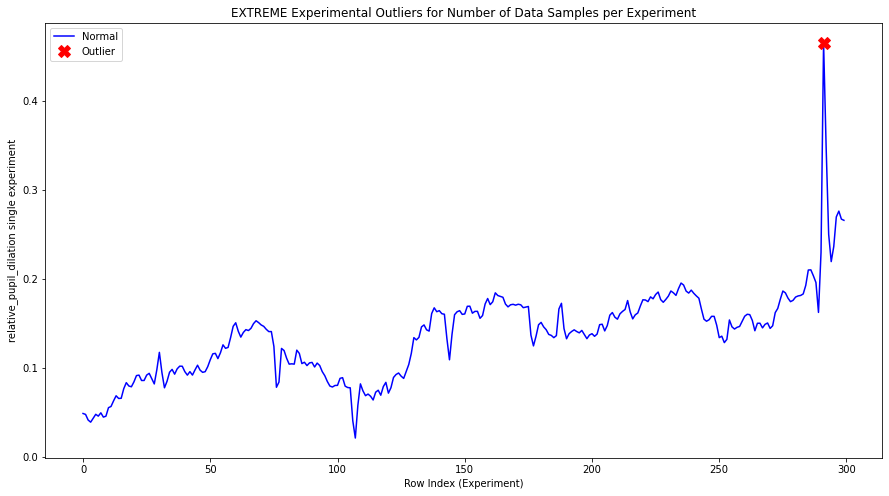

INFO:root:experiment index: 253


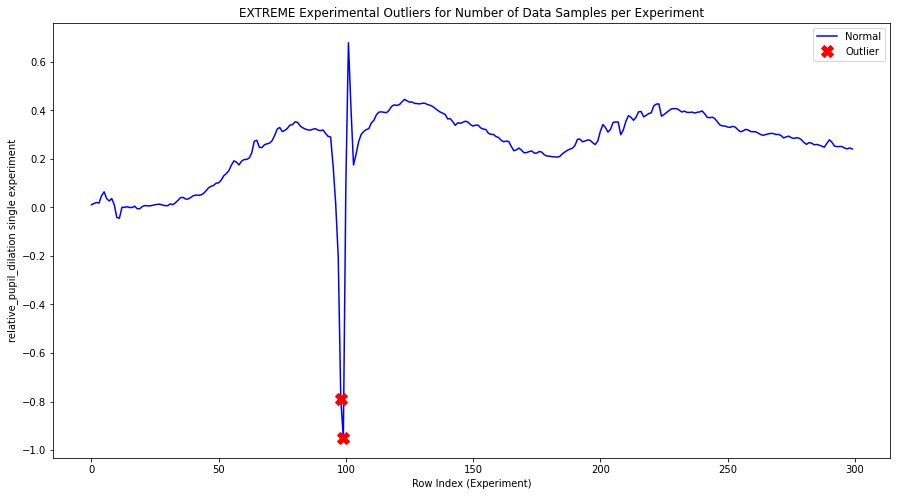

INFO:root:experiment index: 254


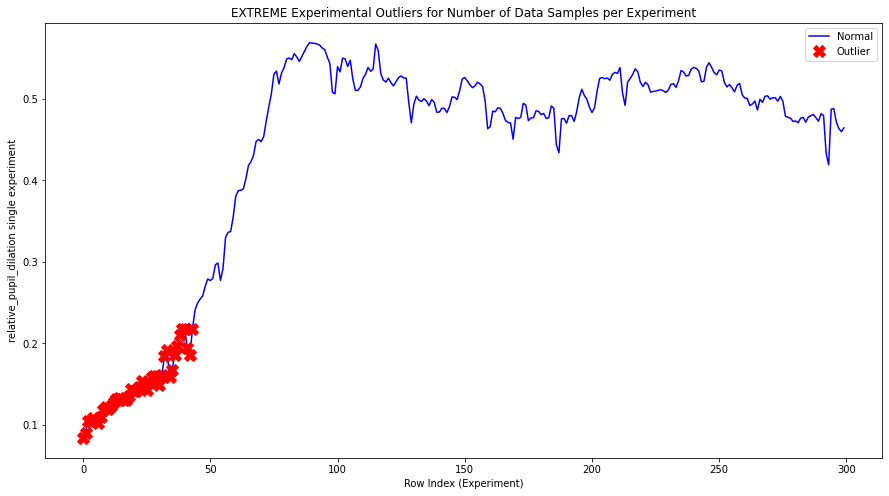

INFO:root:experiment index: 261


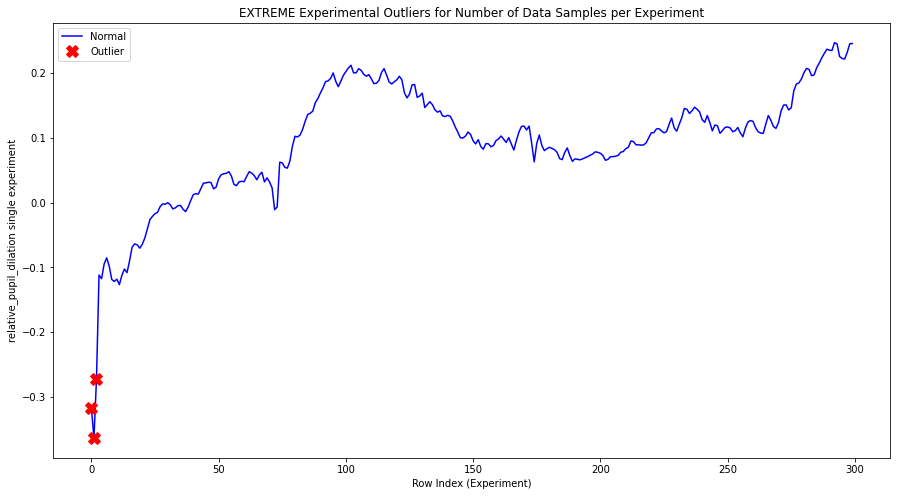

INFO:root:experiment index: 263


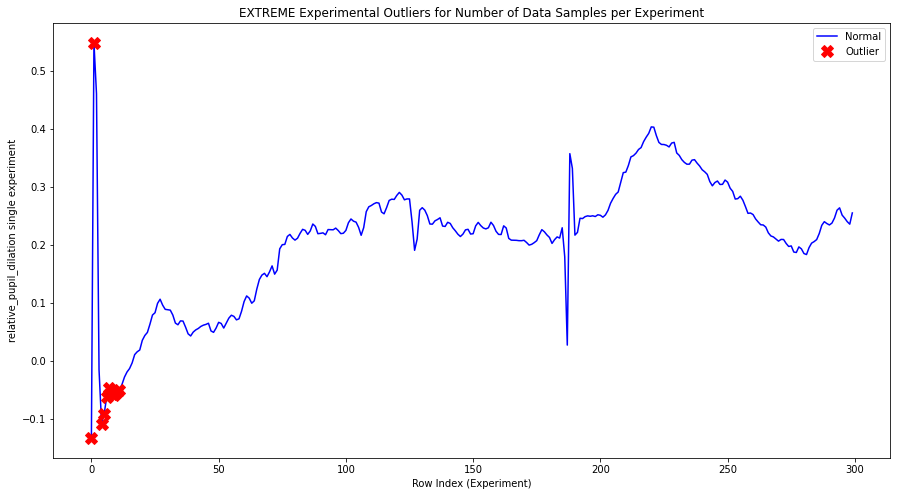

INFO:root:experiment index: 264


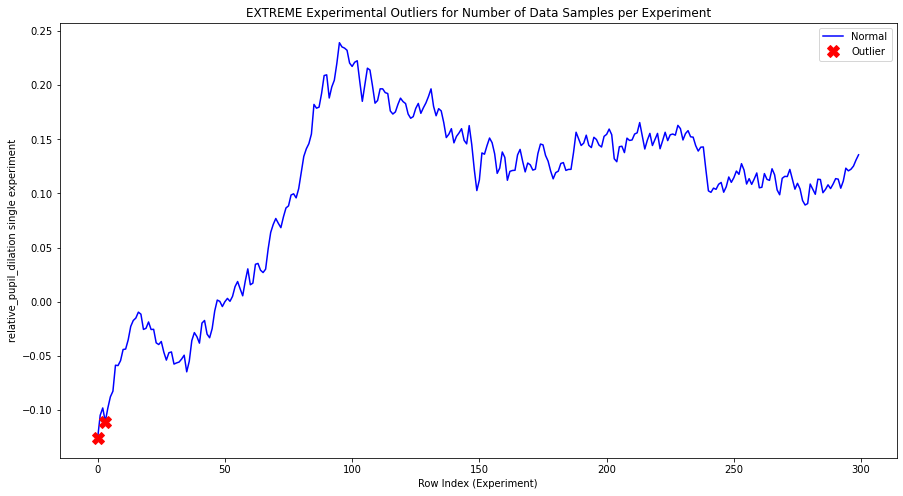

INFO:root:experiment index: 267


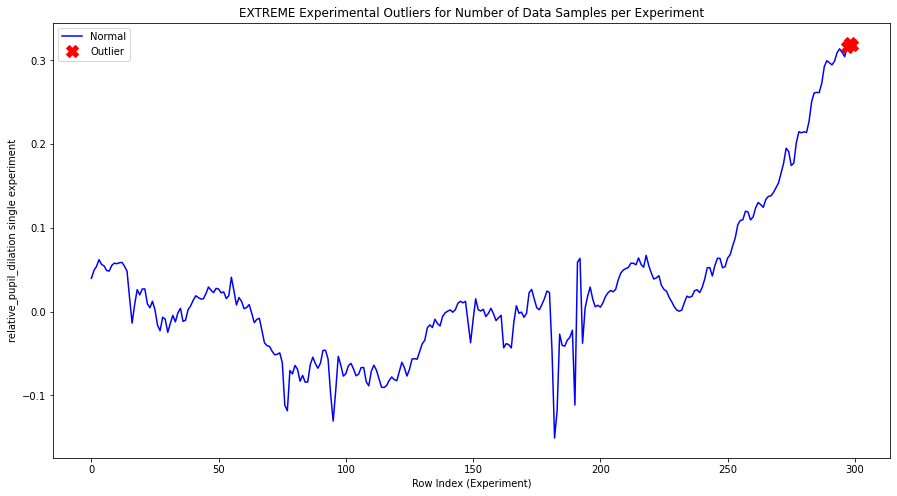

INFO:root:experiment index: 269


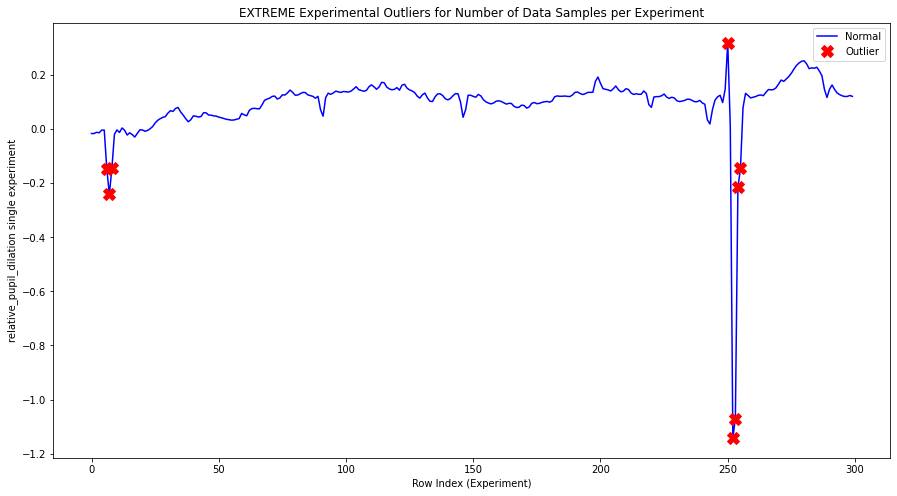

INFO:root:experiment index: 271


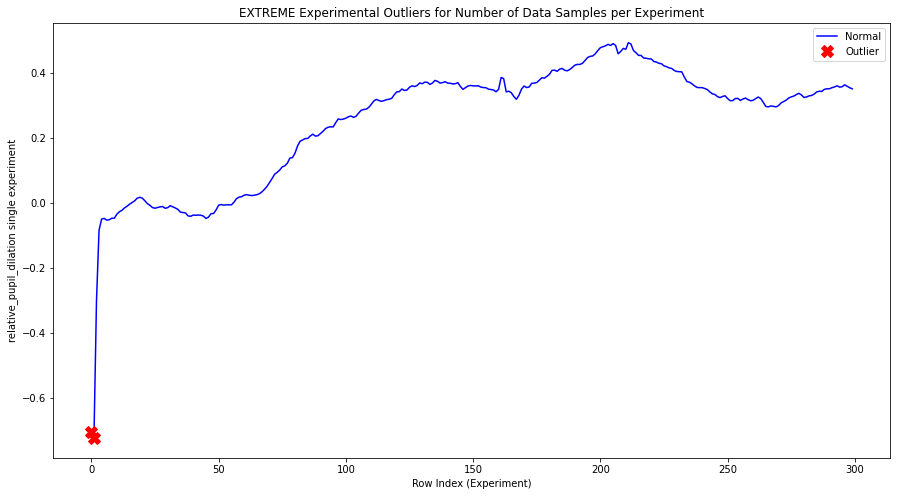

INFO:root:experiment index: 273


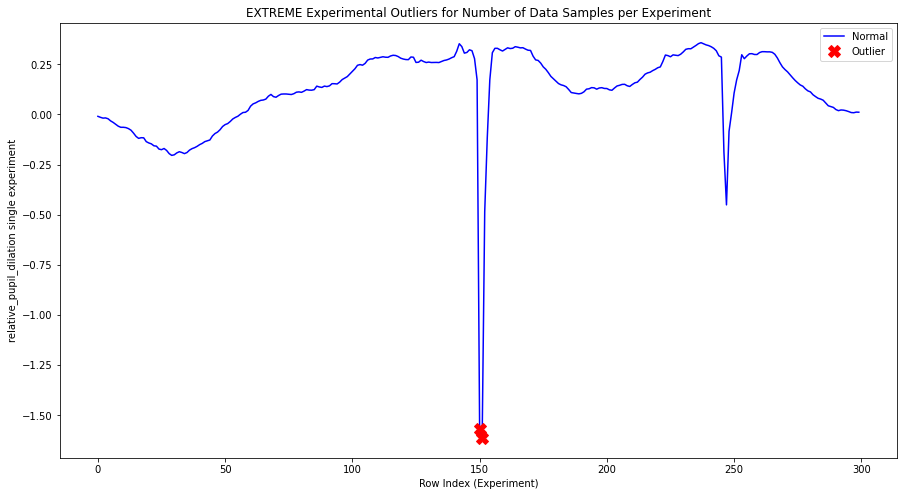

INFO:root:experiment index: 274


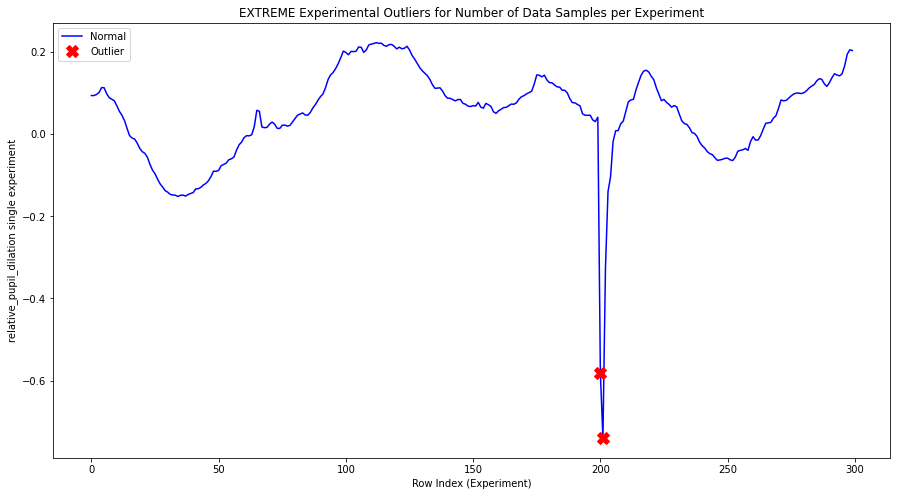

INFO:root:experiment index: 279


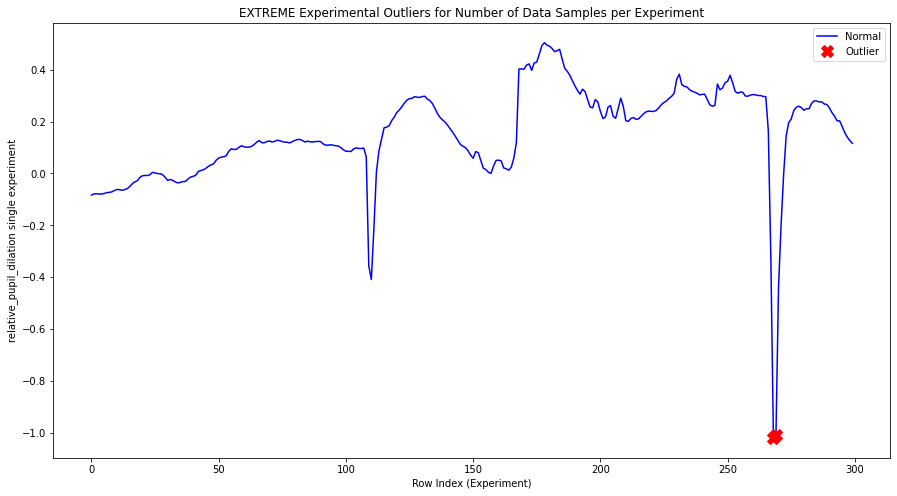

INFO:root:experiment index: 280


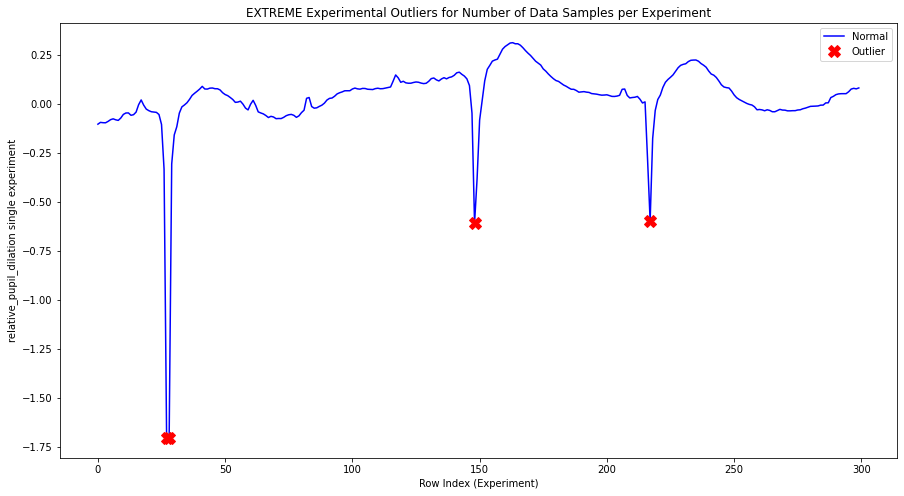

INFO:root:experiment index: 281


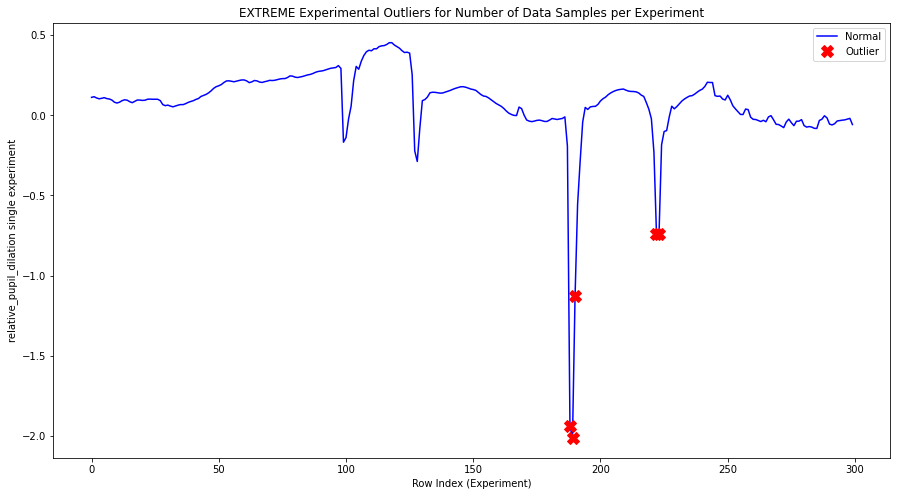

INFO:root:experiment index: 282


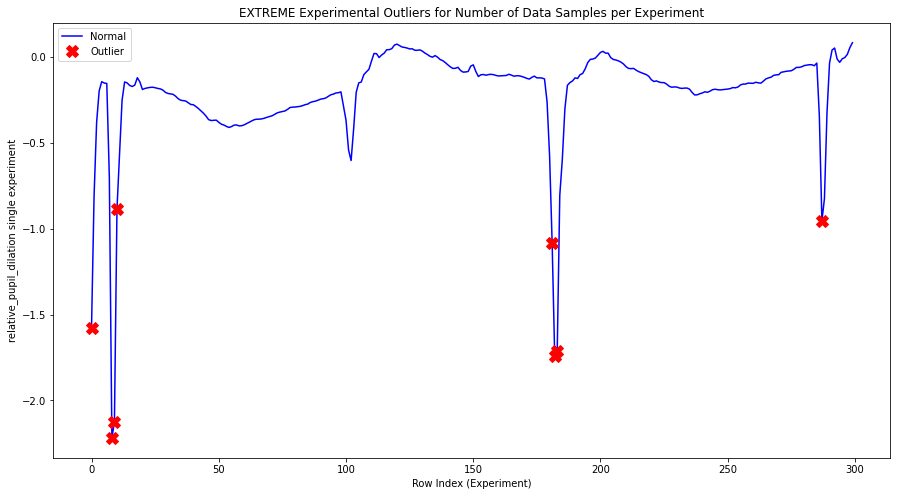

INFO:root:experiment index: 283


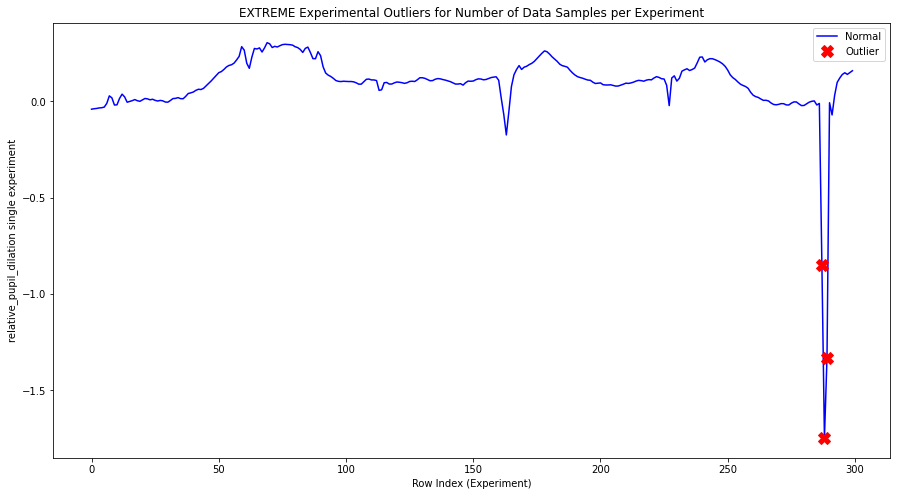

INFO:root:experiment index: 284


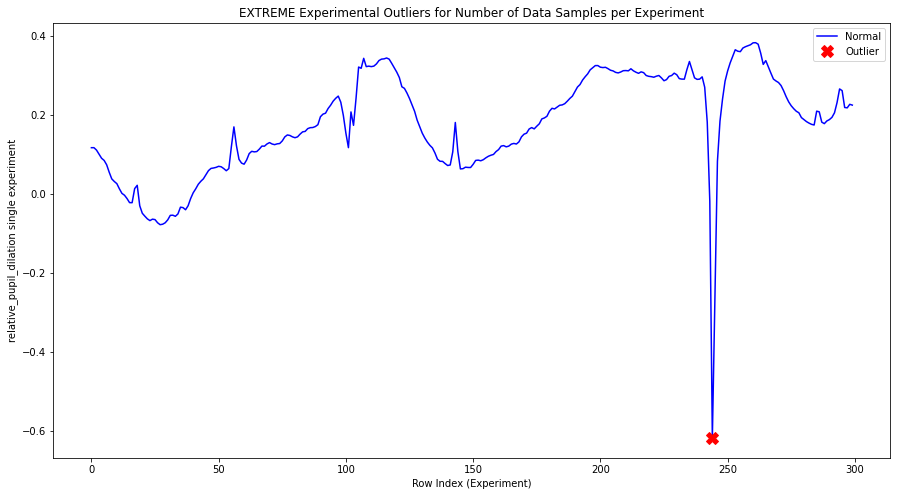

INFO:root:experiment index: 285


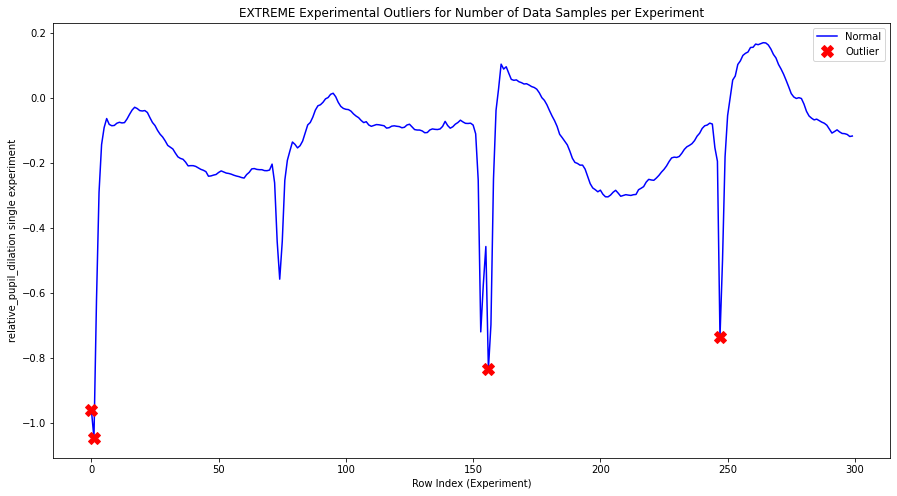

INFO:root:experiment index: 286


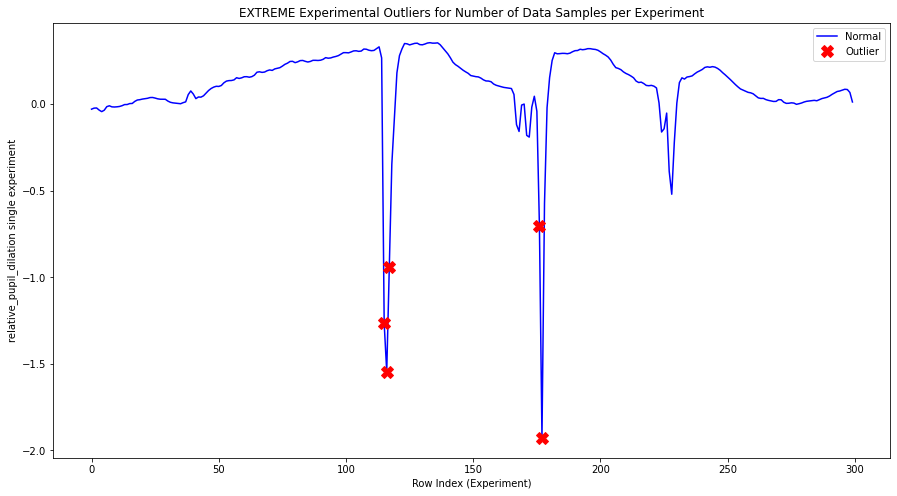

INFO:root:experiment index: 287


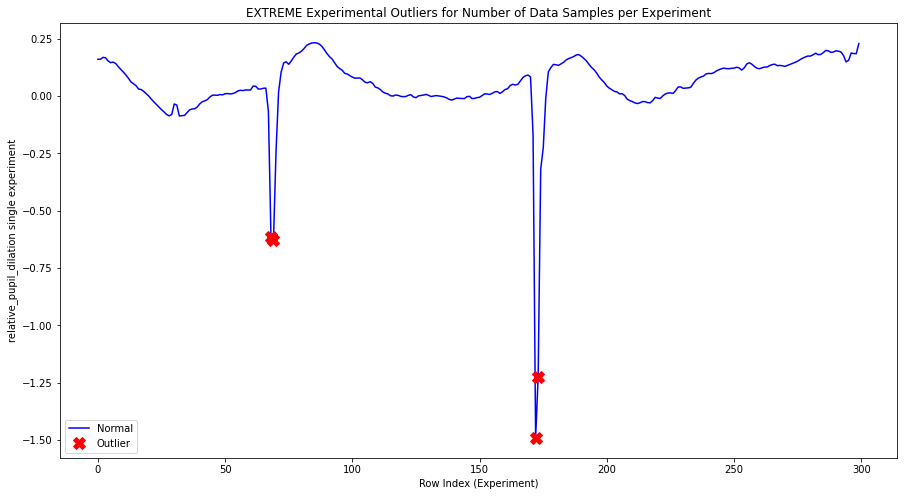

INFO:root:experiment index: 288


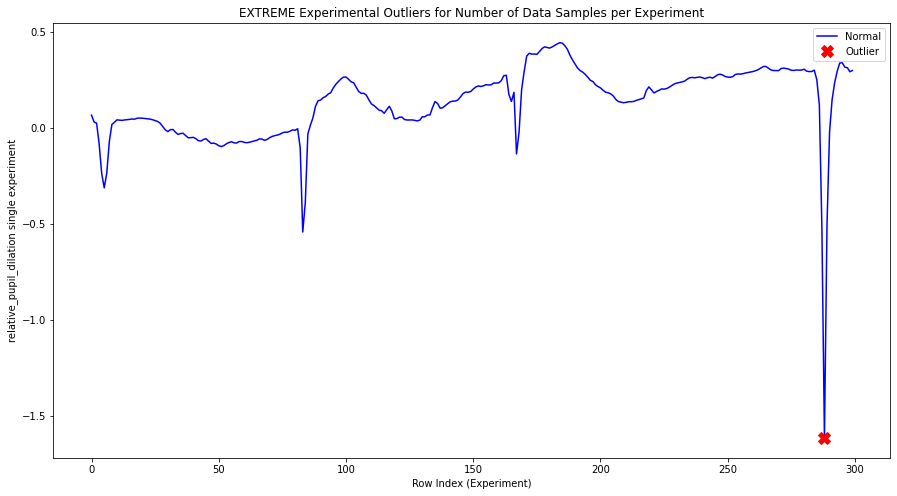

INFO:root:experiment index: 290


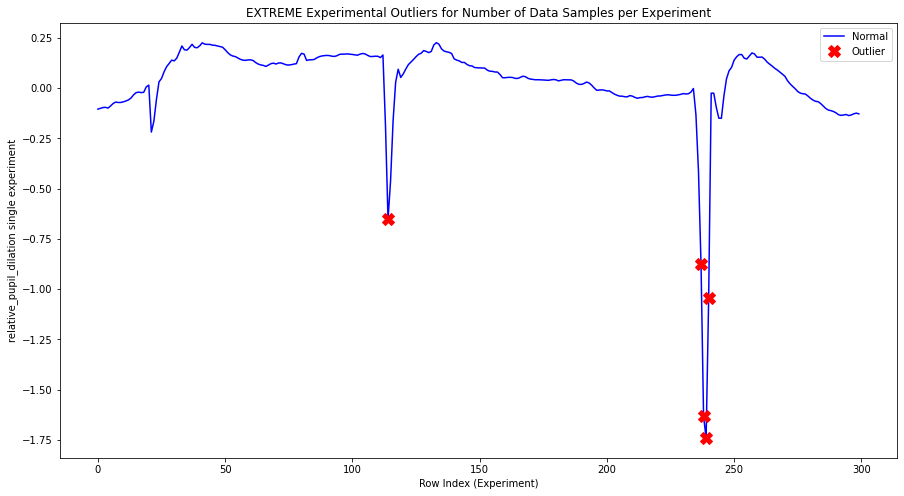

INFO:root:experiment index: 292


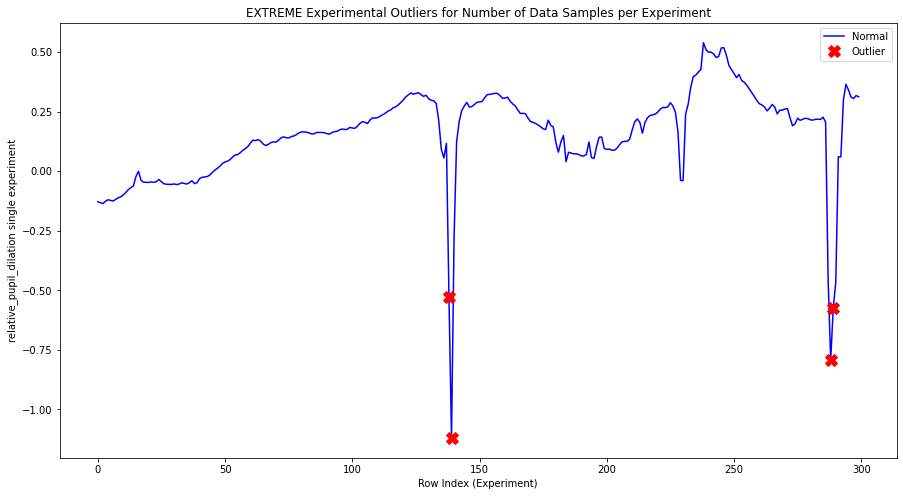

INFO:root:experiment index: 294


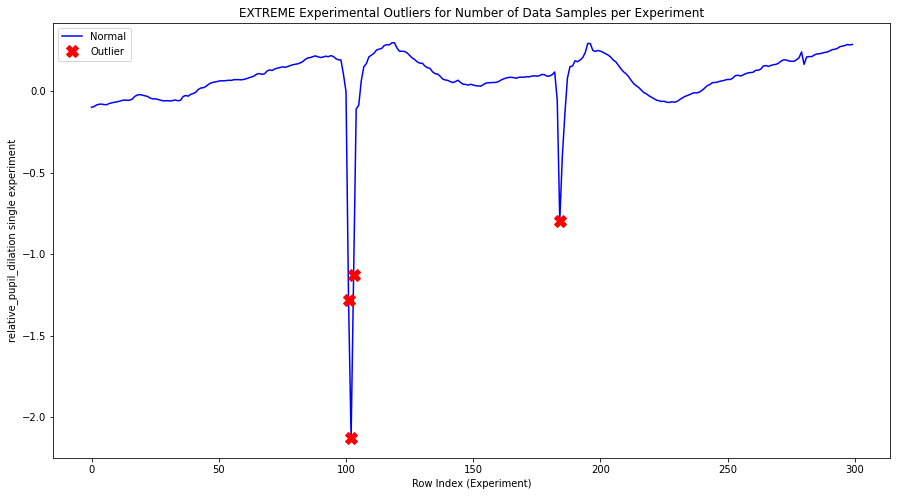

INFO:root:experiment index: 297


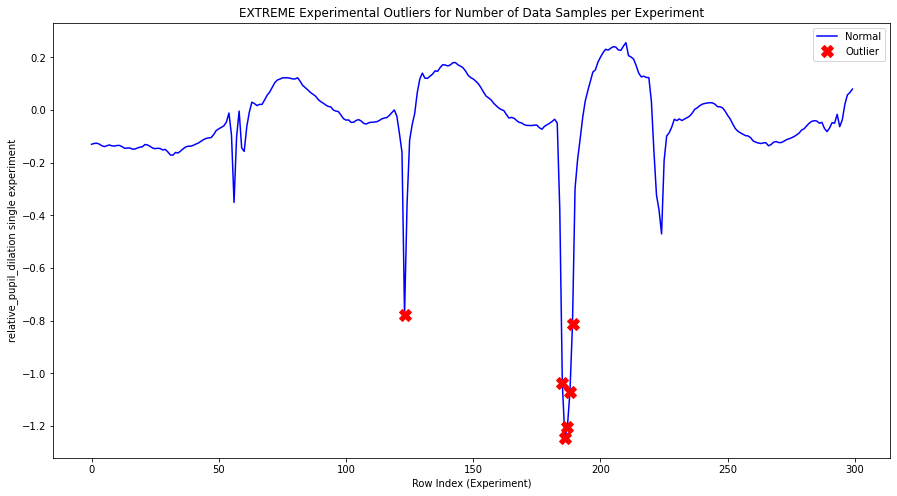

INFO:root:experiment index: 303


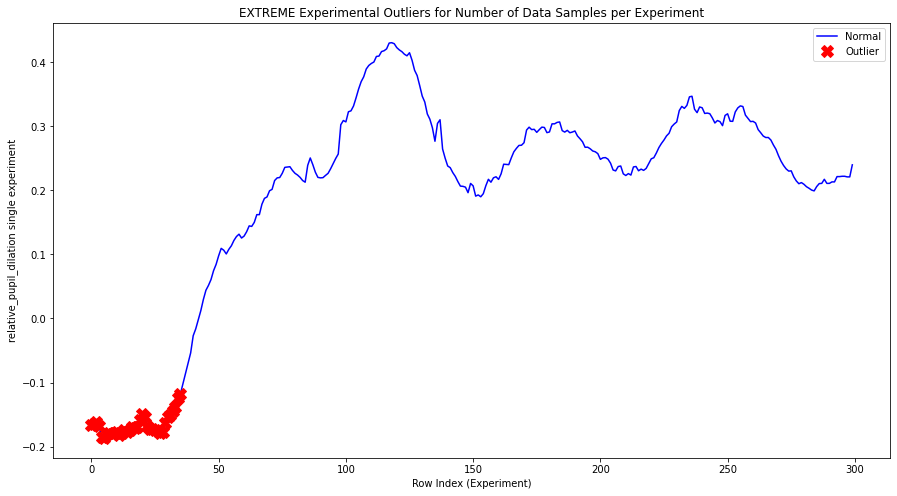

INFO:root:experiment index: 312


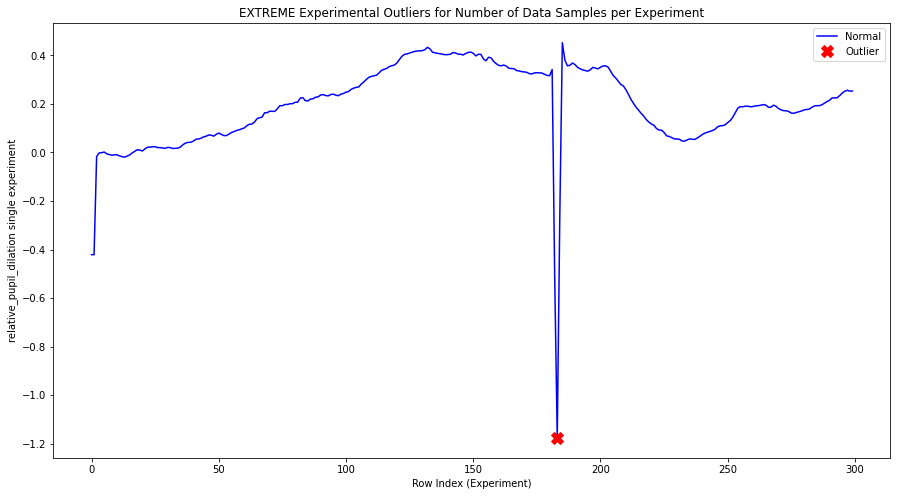

INFO:root:experiment index: 326


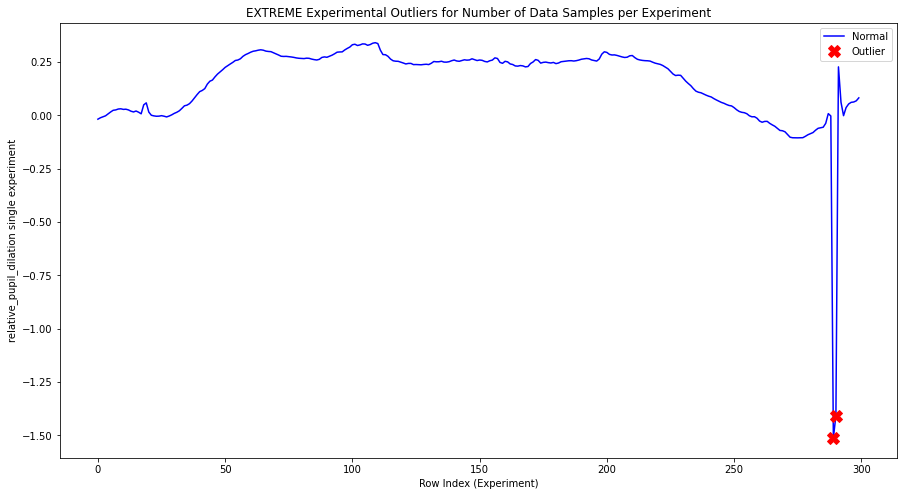

INFO:root:experiment index: 327


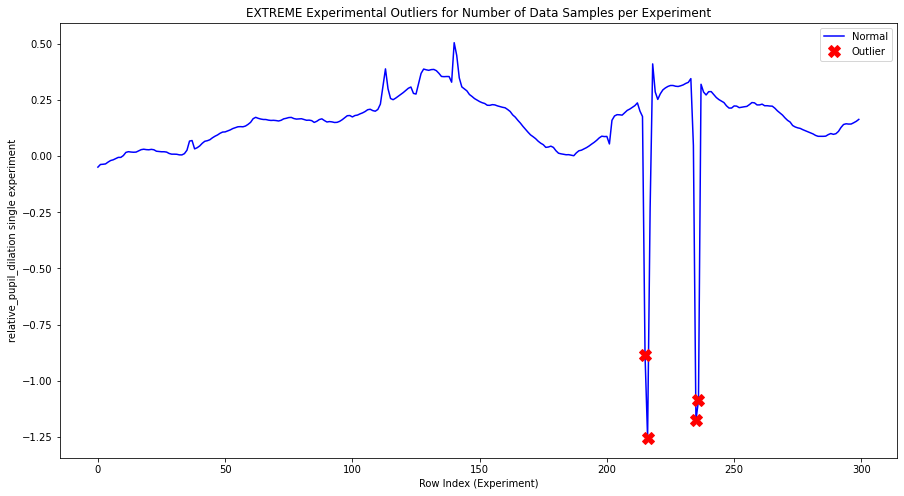

INFO:root:experiment index: 334


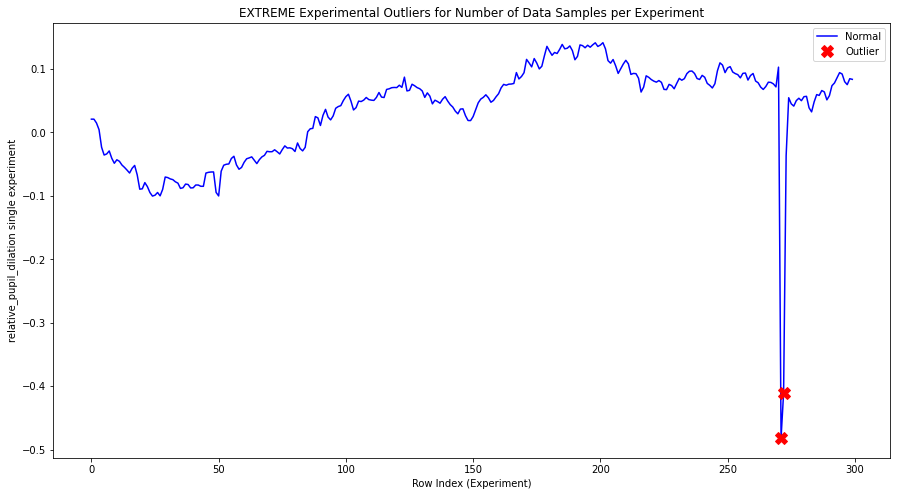

INFO:root:experiment index: 338


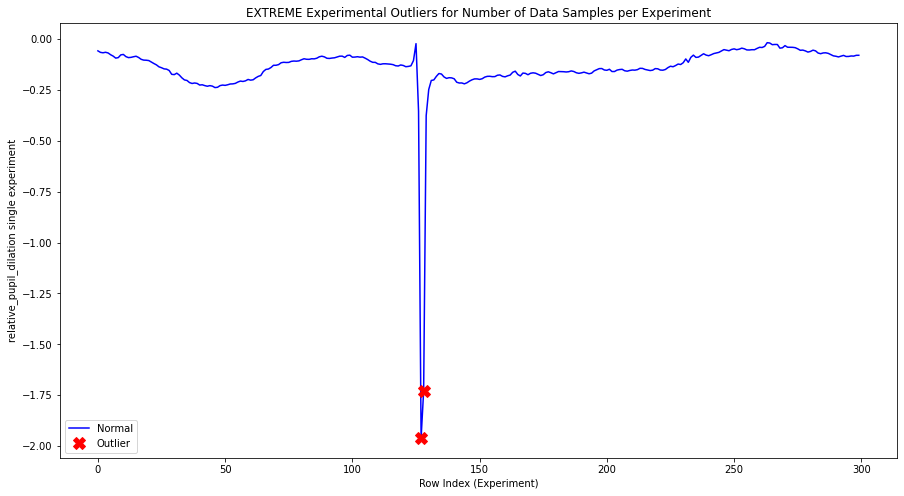

INFO:root:experiment index: 339


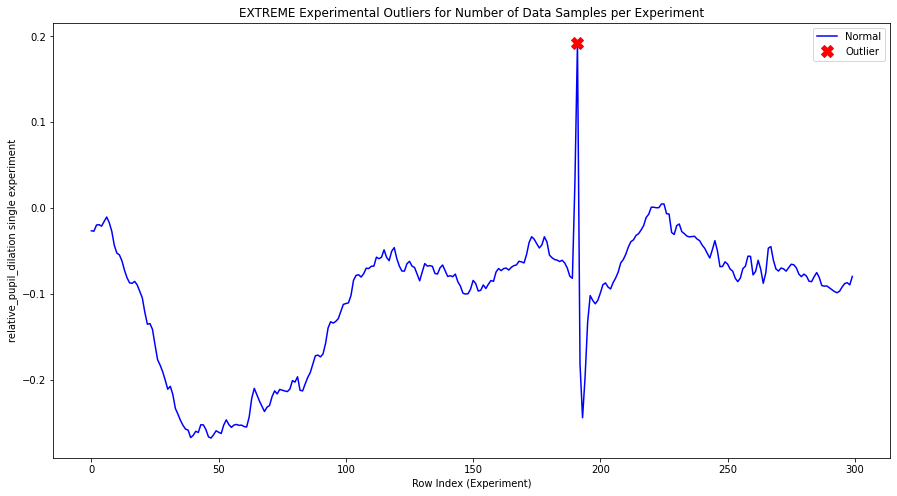

INFO:root:experiment index: 340


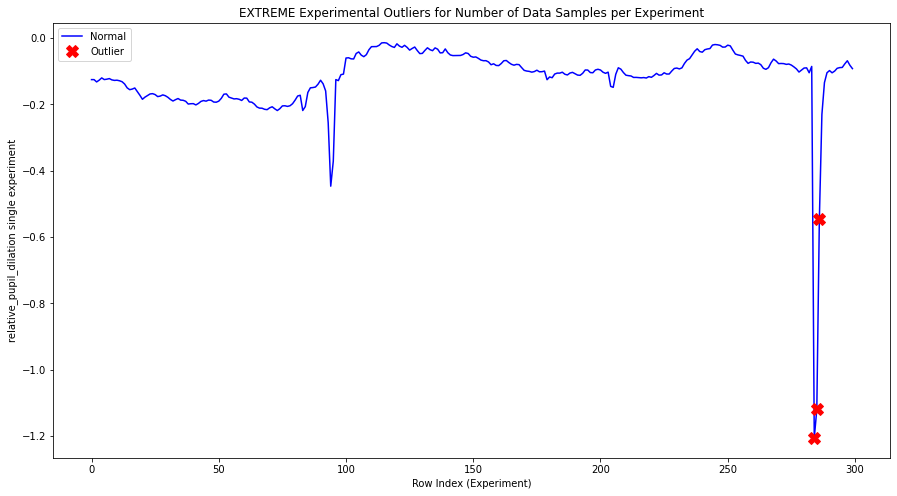

INFO:root:experiment index: 341


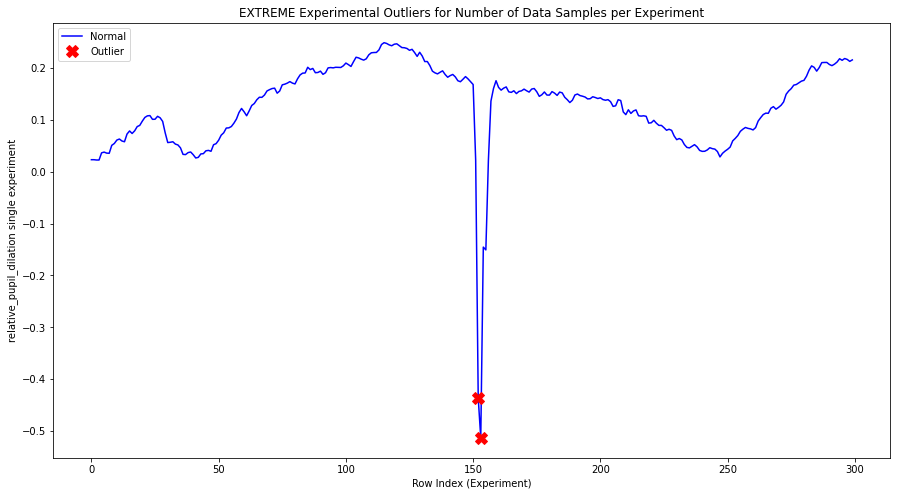

INFO:root:experiment index: 342


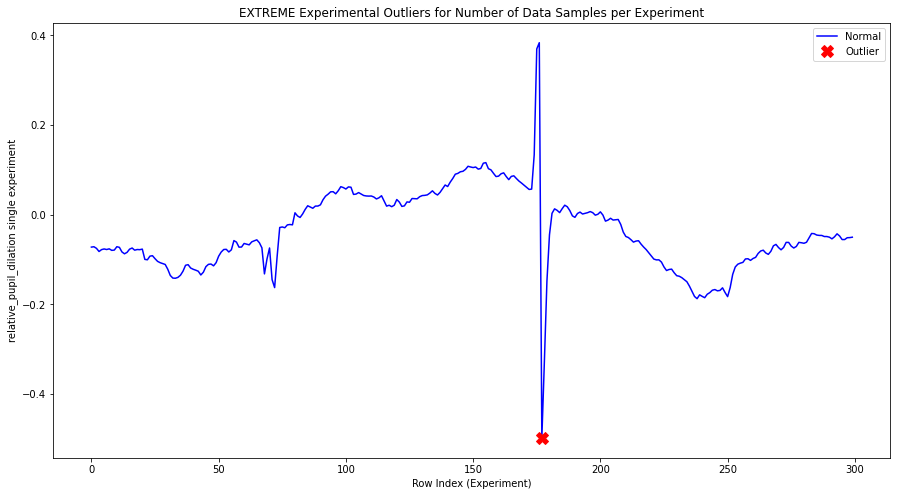

INFO:root:experiment index: 343


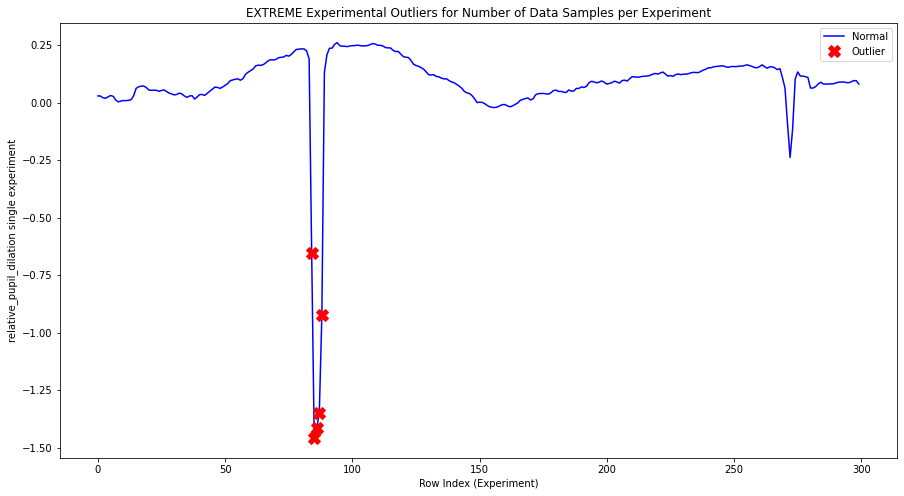

INFO:root:experiment index: 344


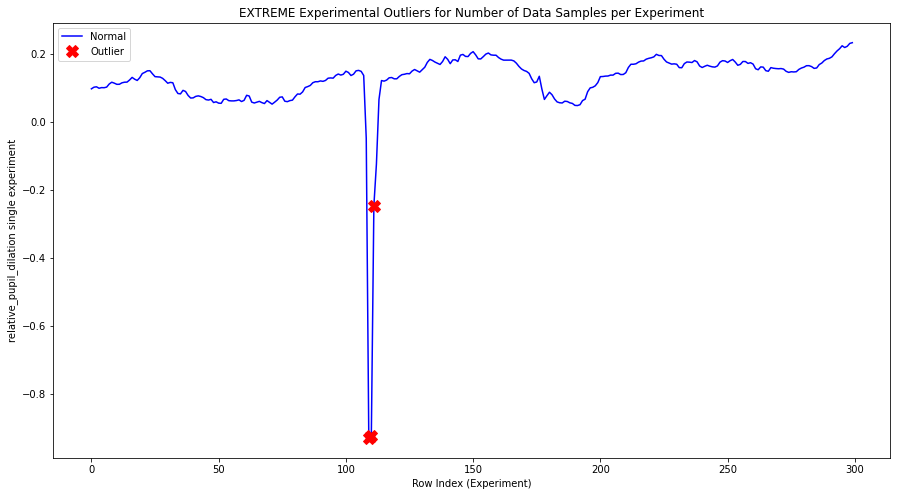

INFO:root:experiment index: 345


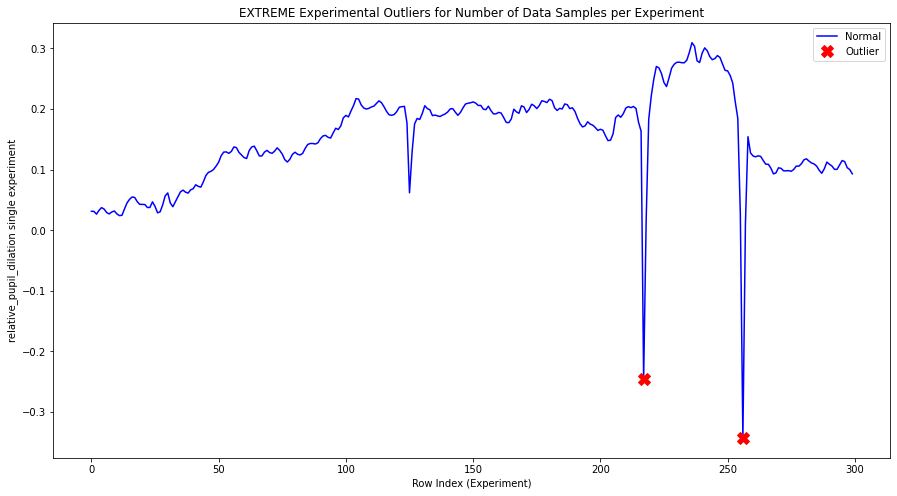

INFO:root:experiment index: 346


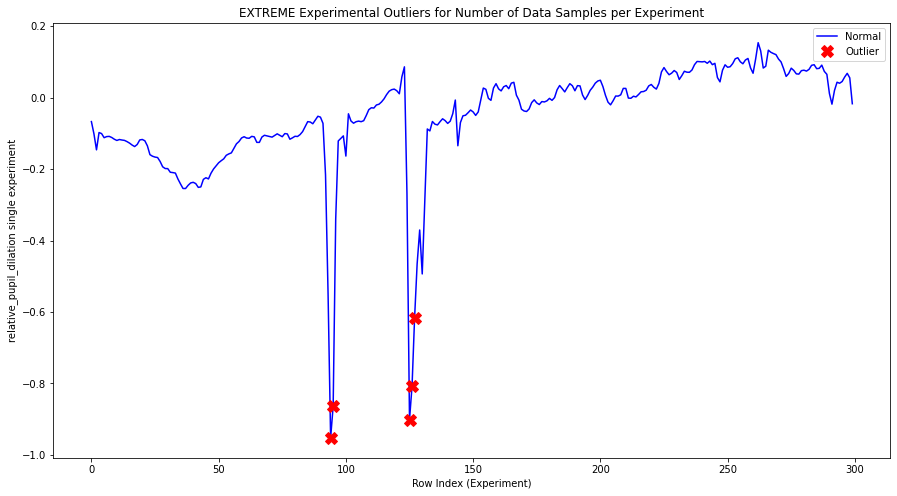

INFO:root:experiment index: 348


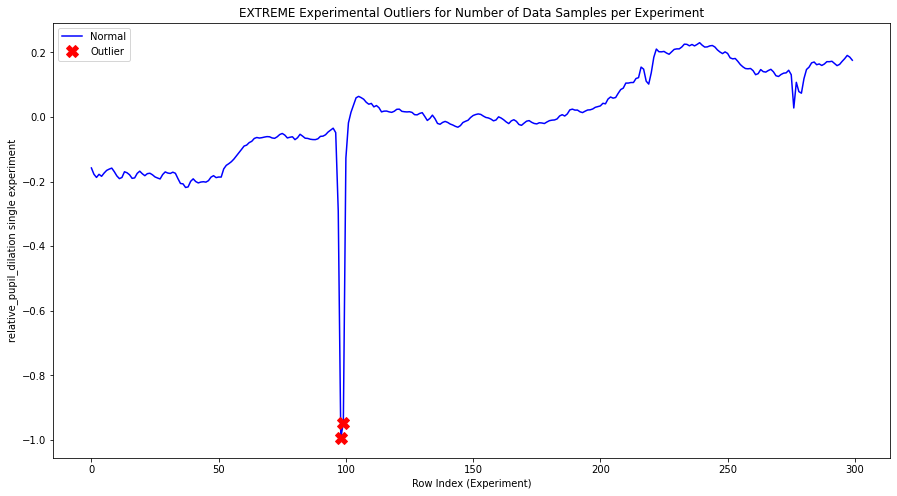

INFO:root:experiment index: 349


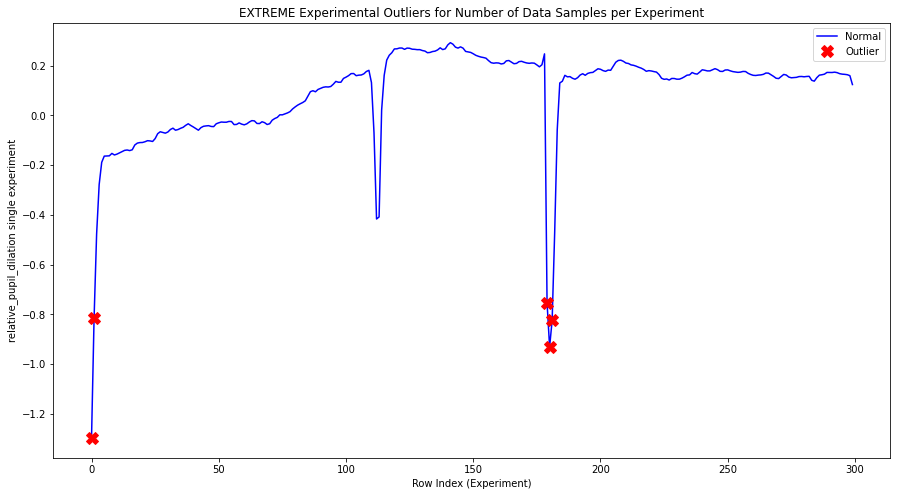

INFO:root:experiment index: 351


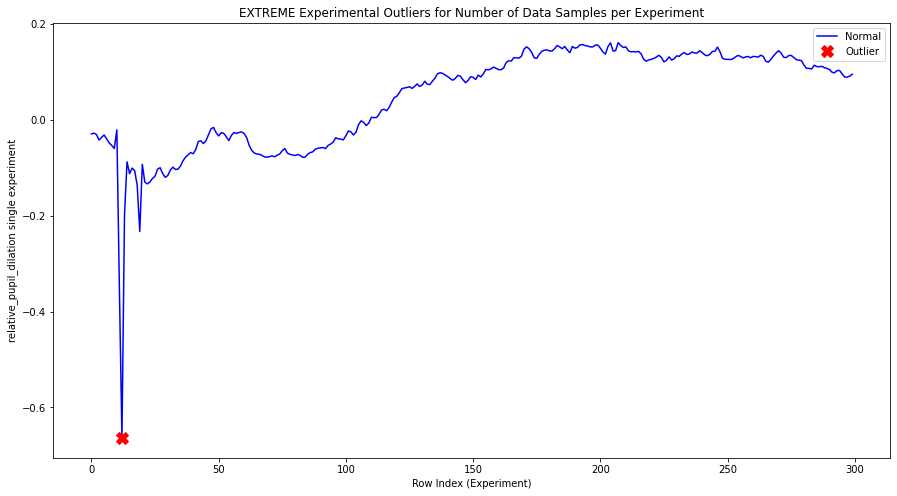

INFO:root:experiment index: 354


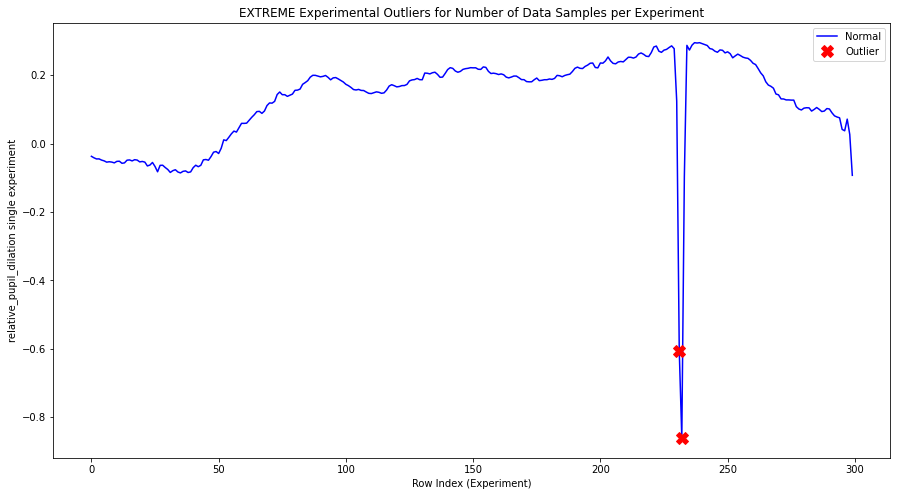

INFO:root:experiment index: 355


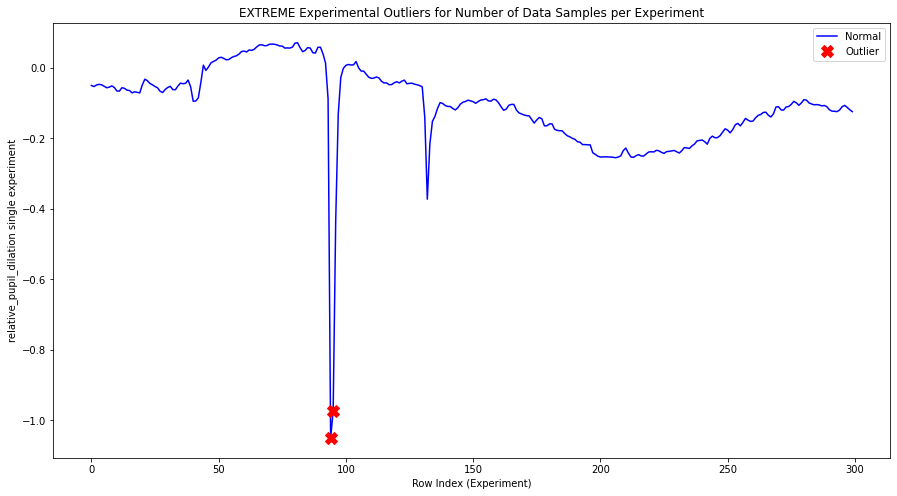

INFO:root:experiment index: 357


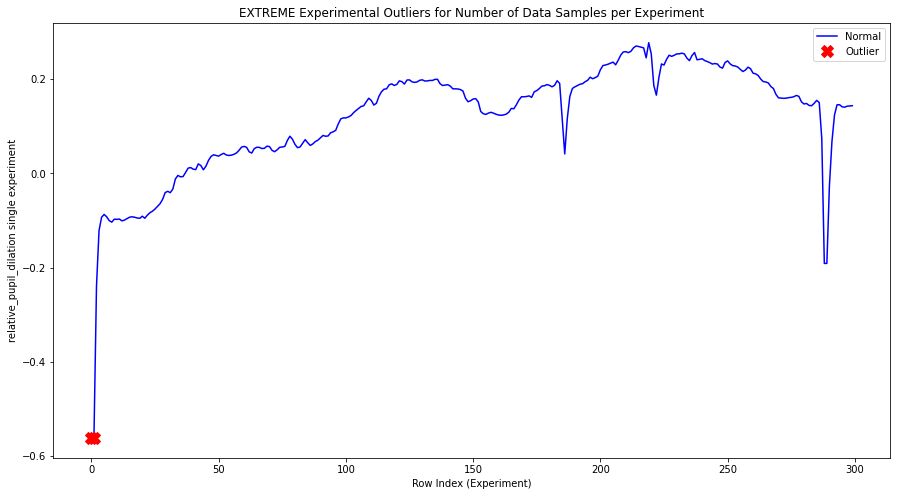

INFO:root:experiment index: 359


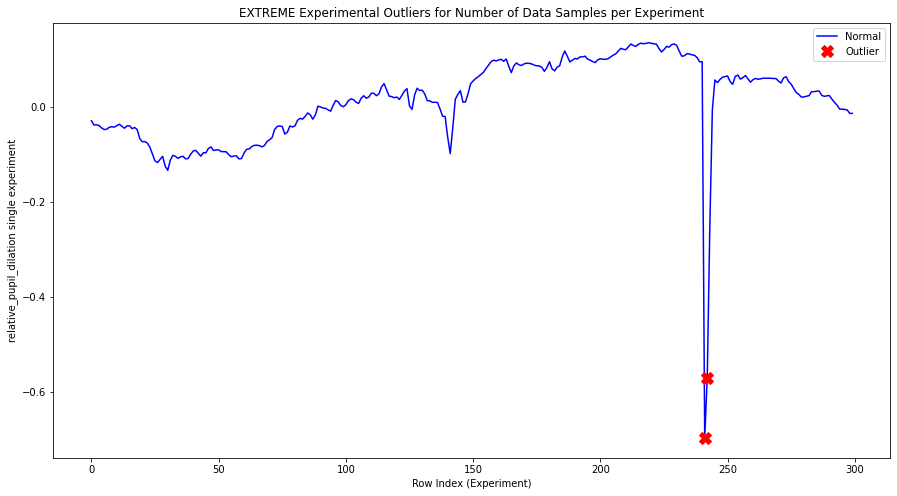

INFO:root:experiment index: 365


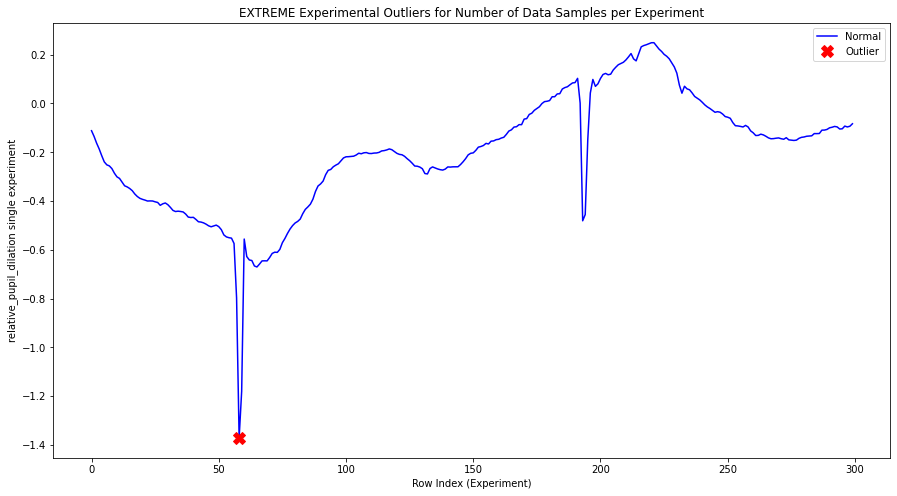

INFO:root:experiment index: 367


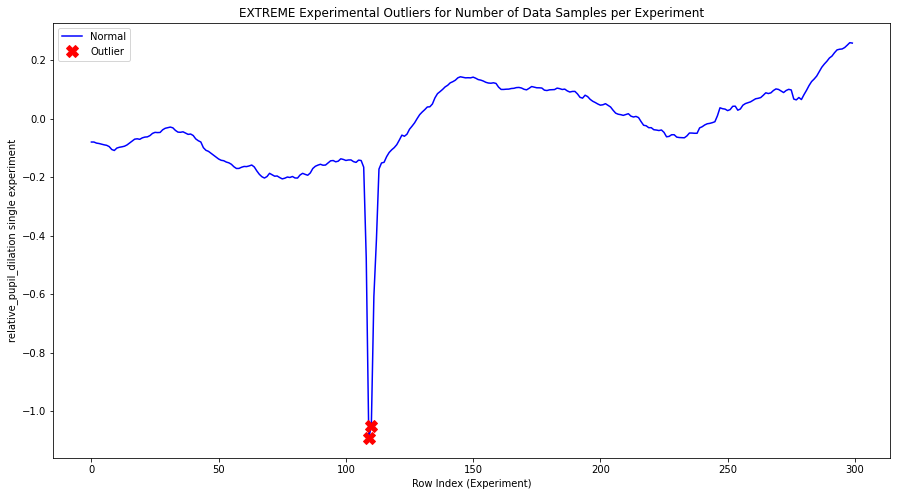

INFO:root:experiment index: 368


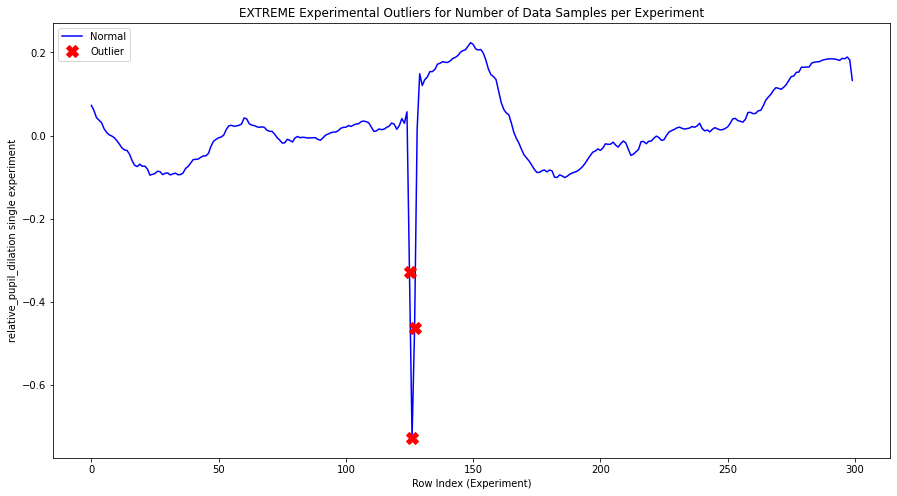

INFO:root:experiment index: 369


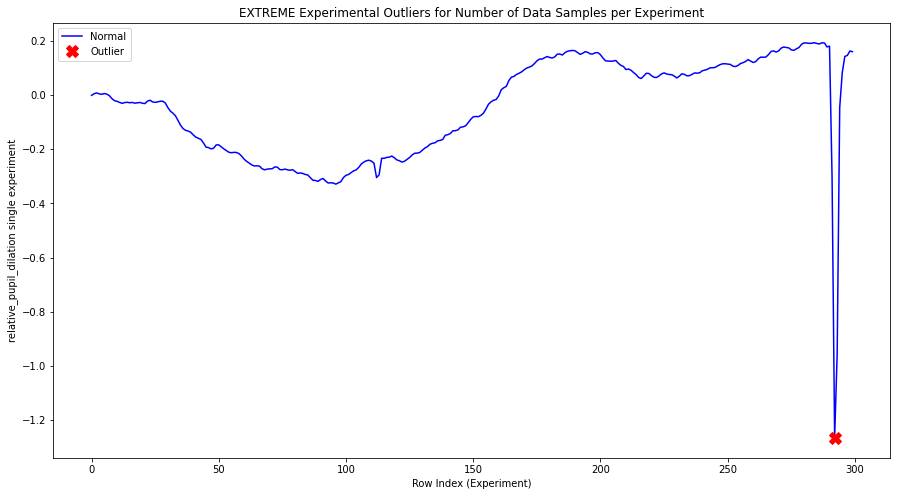

INFO:root:experiment index: 370


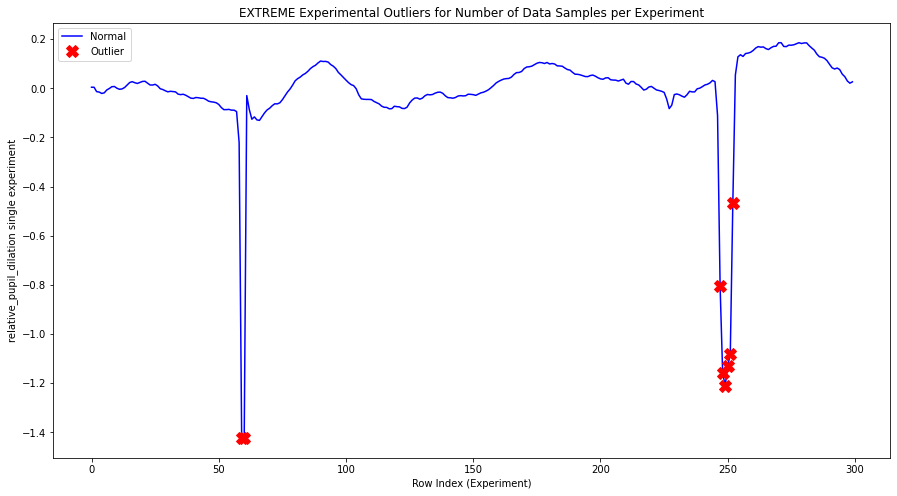

INFO:root:experiment index: 371


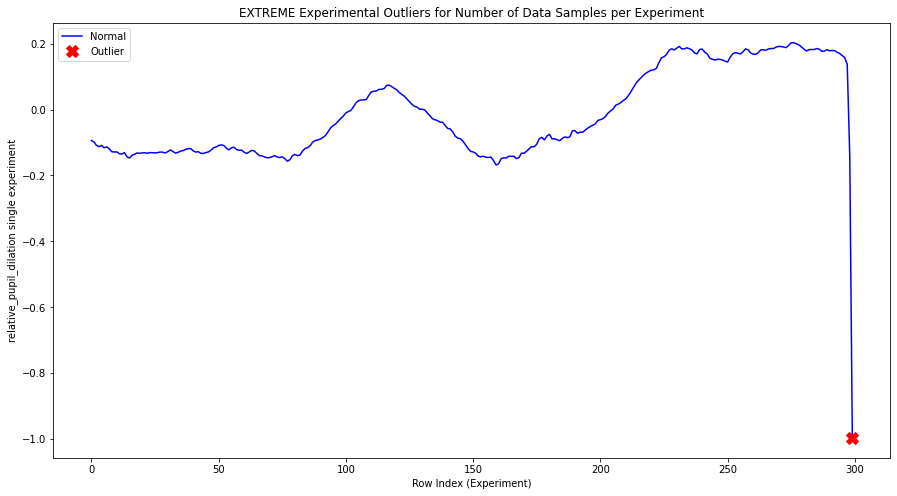

INFO:root:experiment index: 372


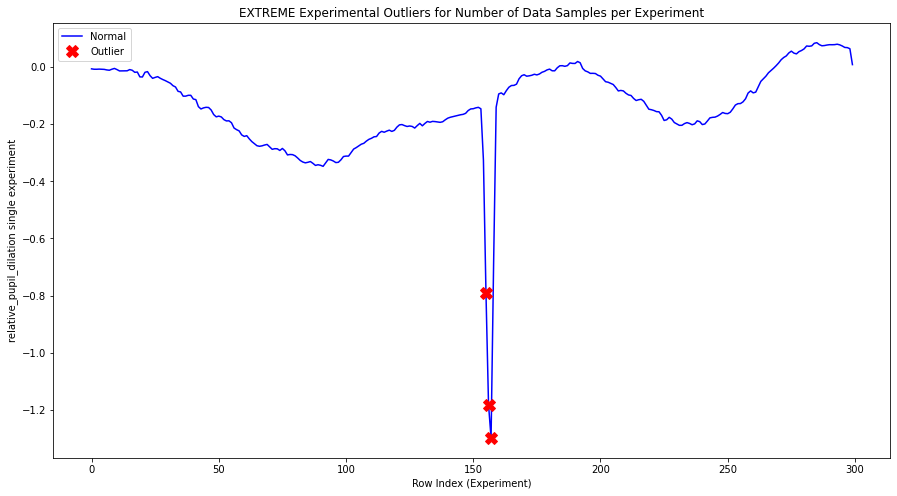

INFO:root:experiment index: 374


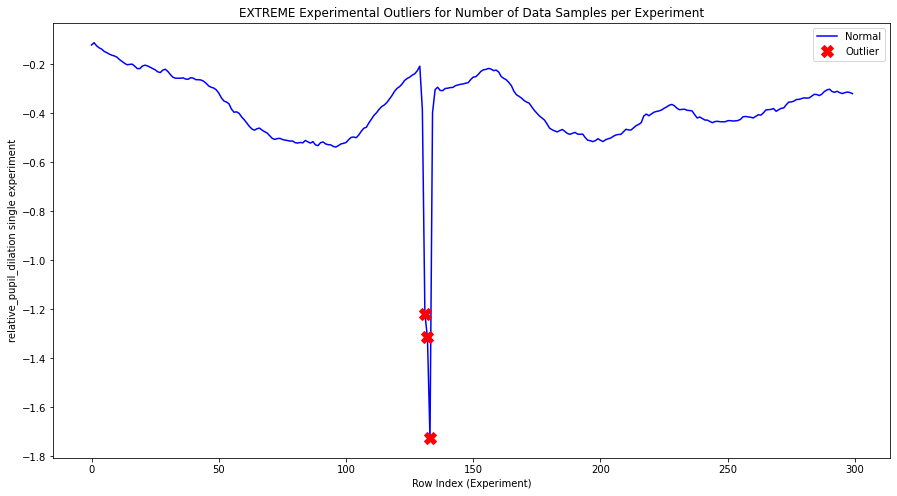

INFO:root:experiment index: 375


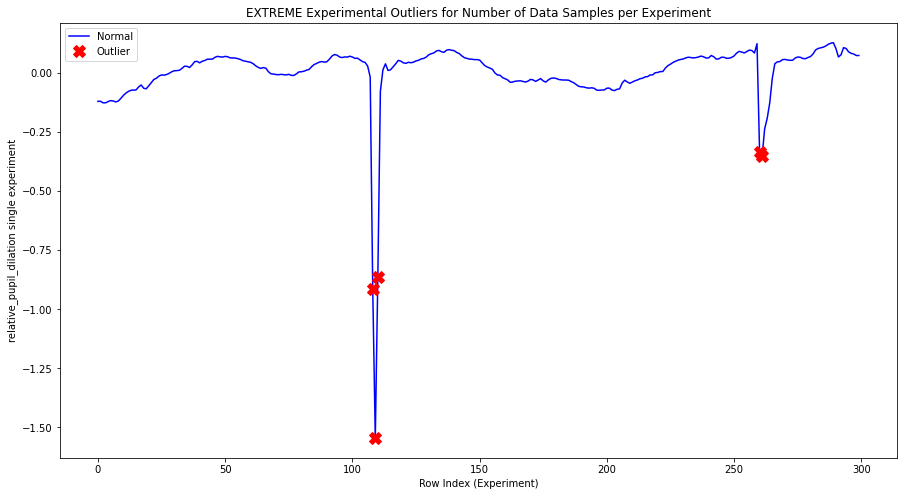

INFO:root:experiment index: 379


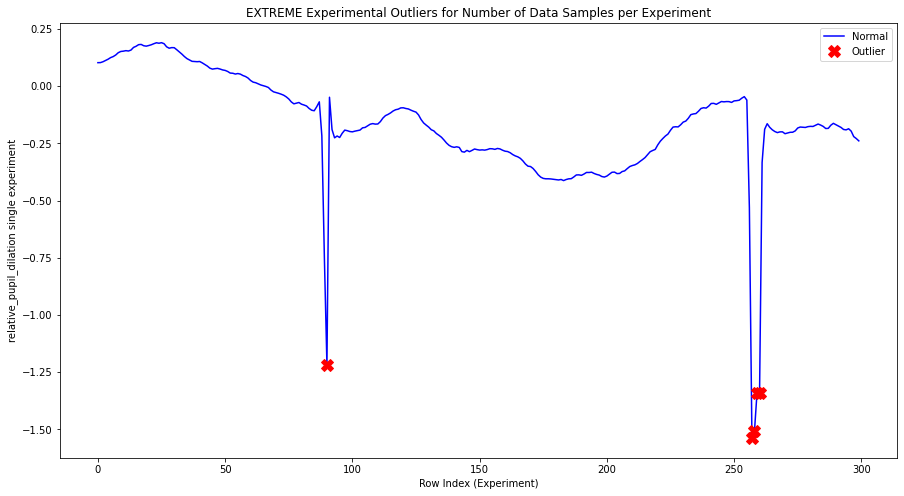

INFO:root:experiment index: 380


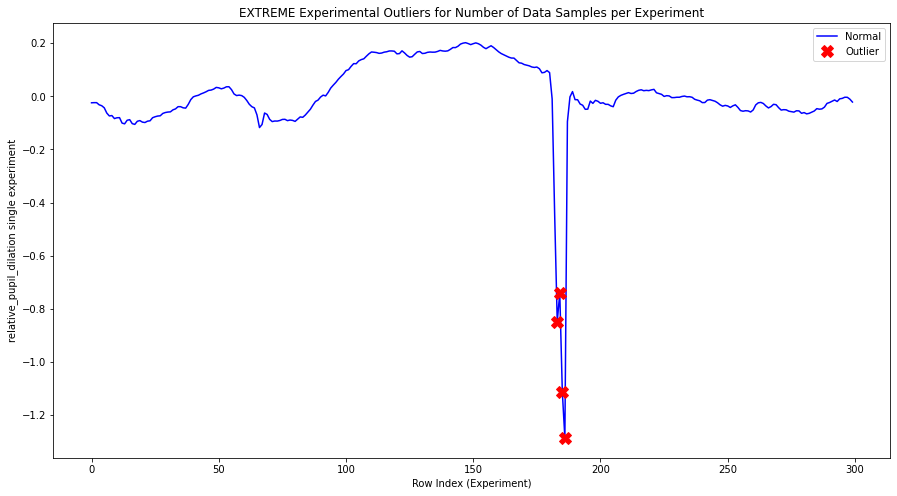

INFO:root:experiment index: 381


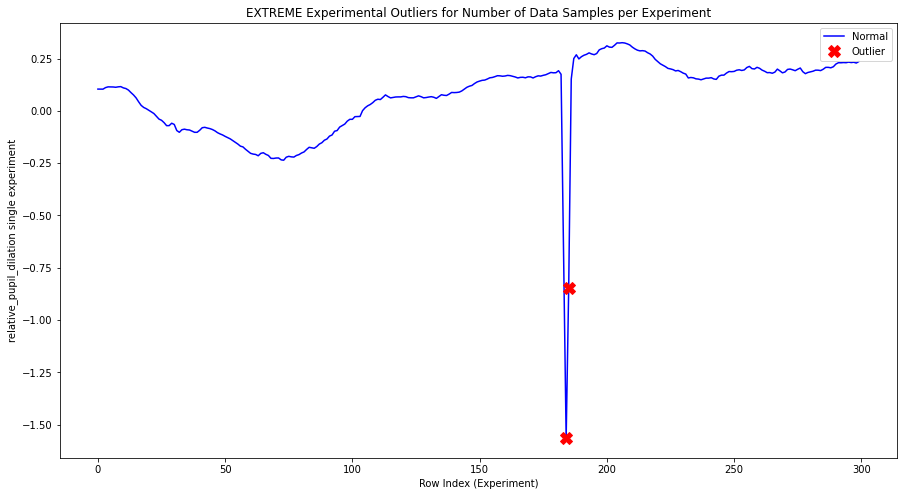

INFO:root:experiment index: 386


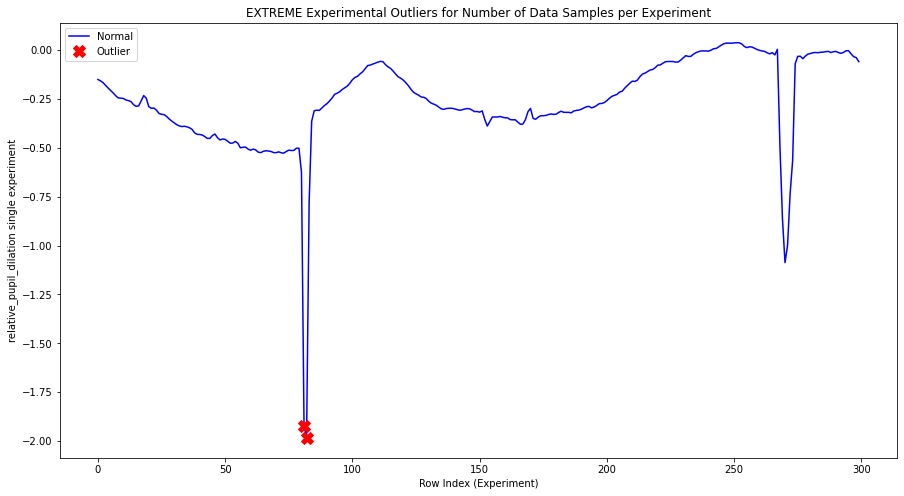

INFO:root:experiment index: 388


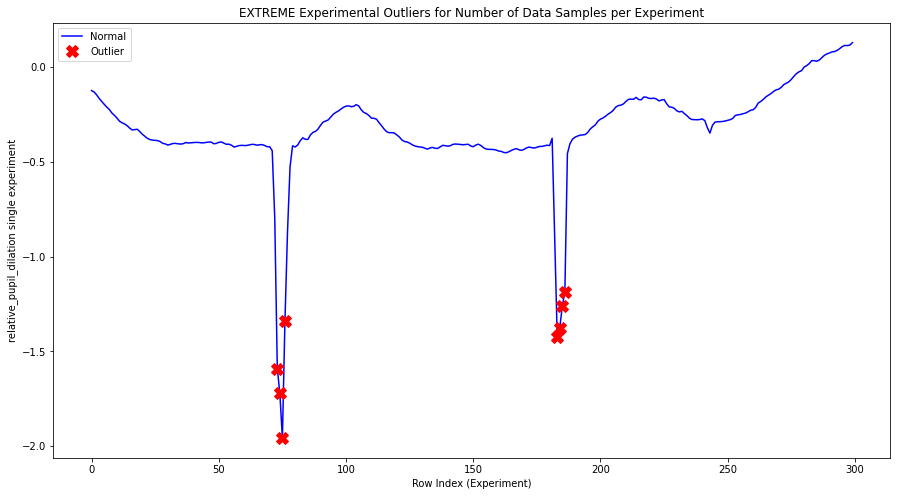

INFO:root:experiment index: 399


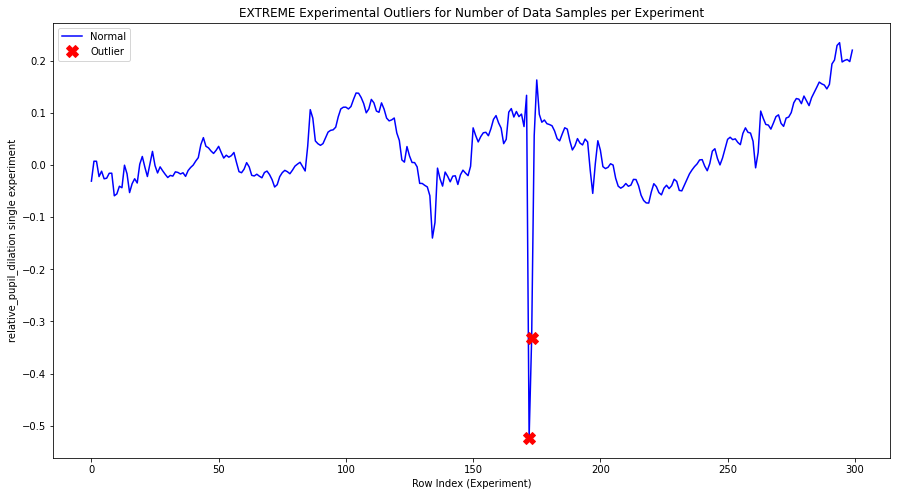

INFO:root:experiment index: 401


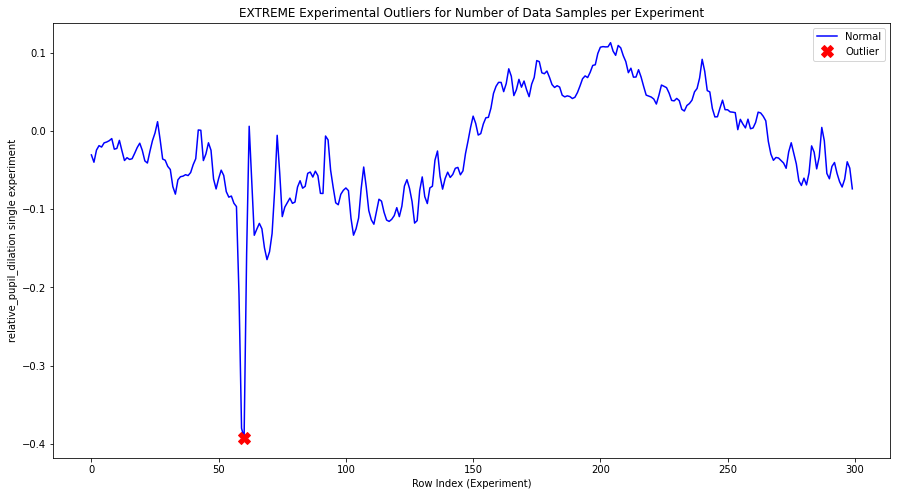

INFO:root:experiment index: 403


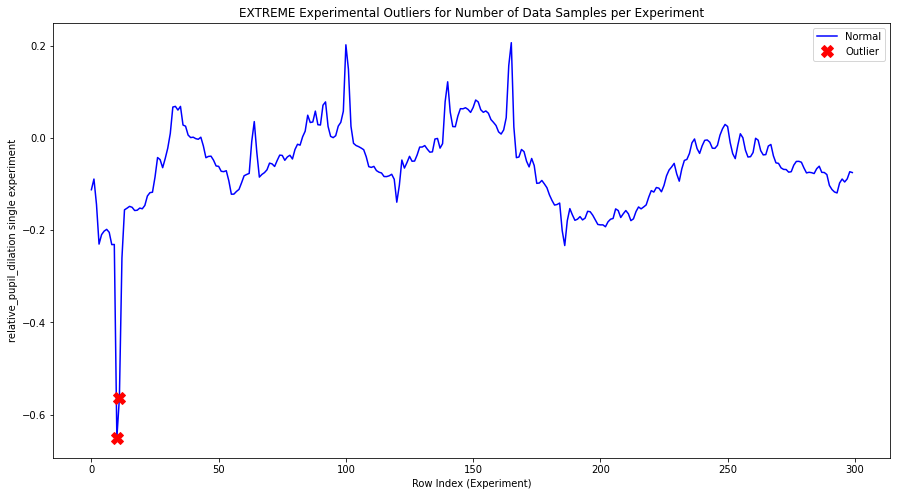

INFO:root:experiment index: 404


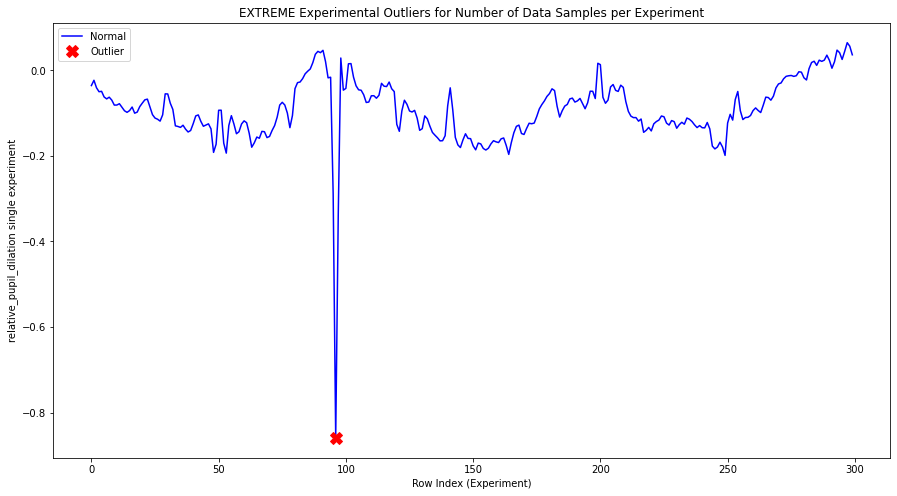

INFO:root:experiment index: 406


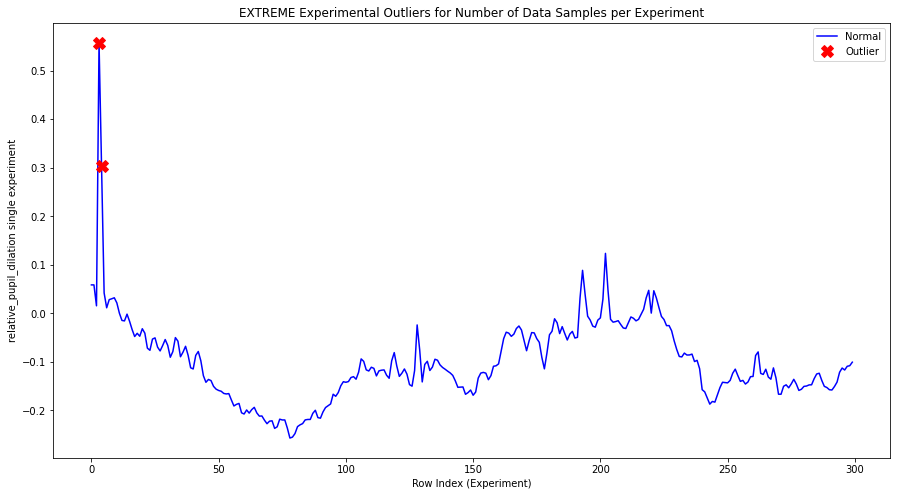

INFO:root:experiment index: 407


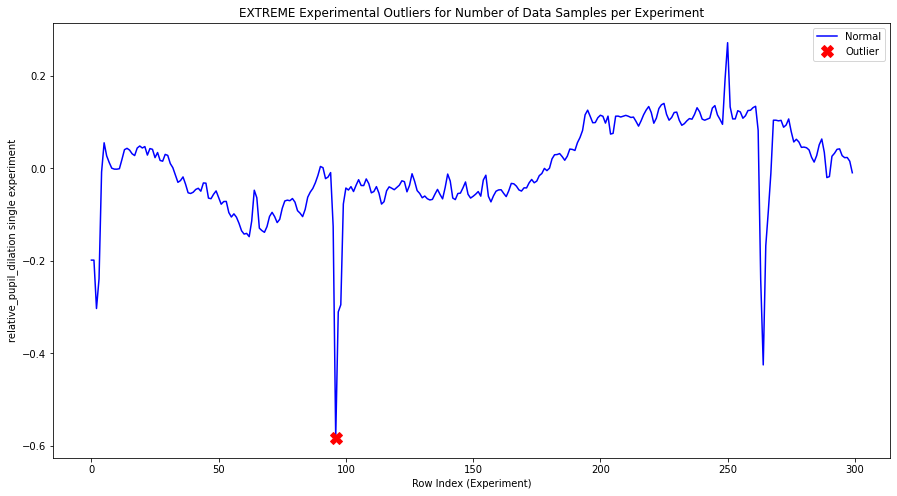

INFO:root:experiment index: 408


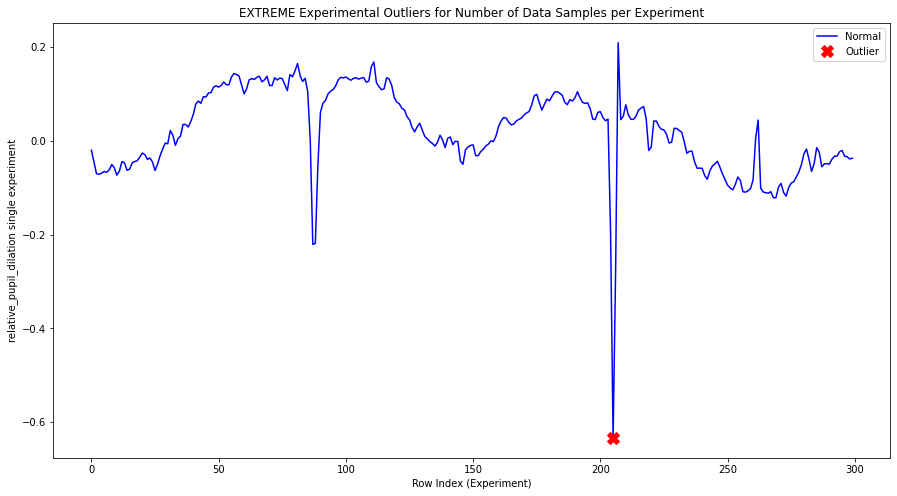

INFO:root:experiment index: 414


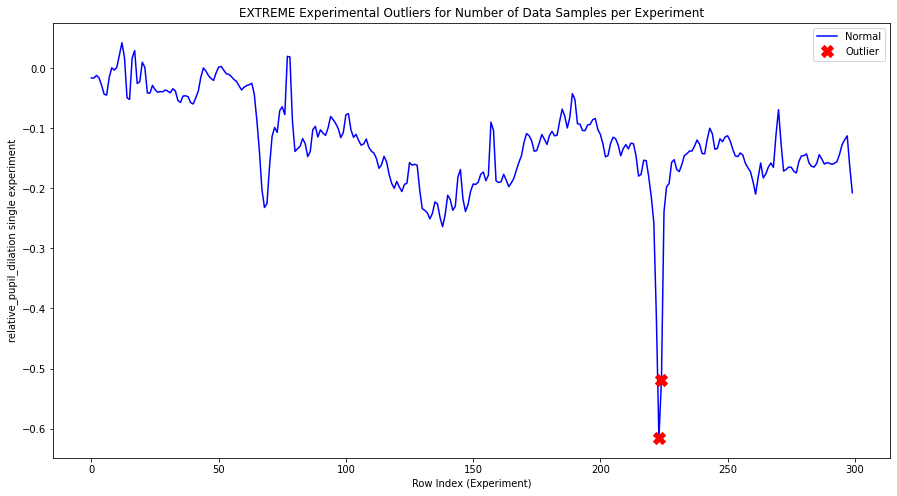

INFO:root:experiment index: 415


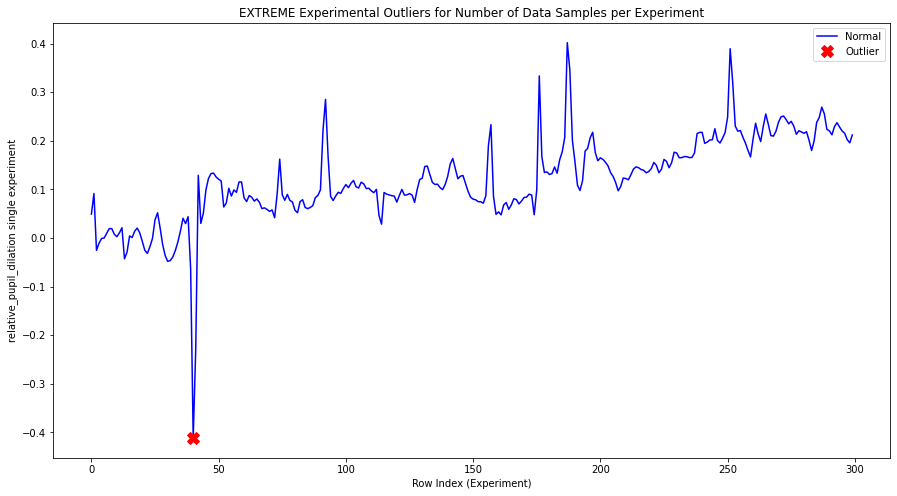

INFO:root:experiment index: 419


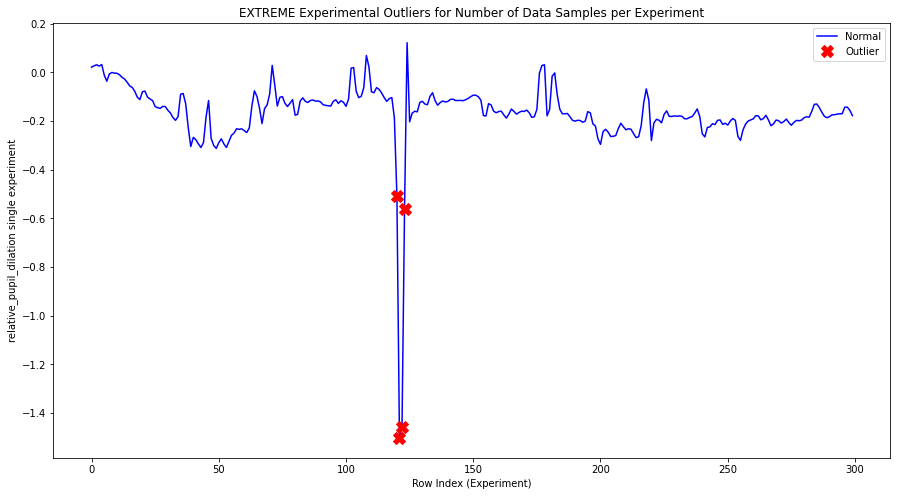

INFO:root:experiment index: 425


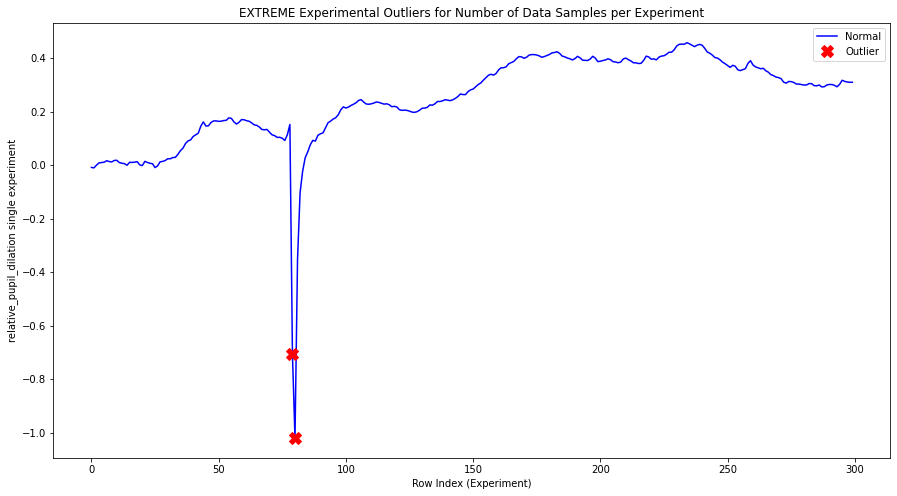

INFO:root:experiment index: 432


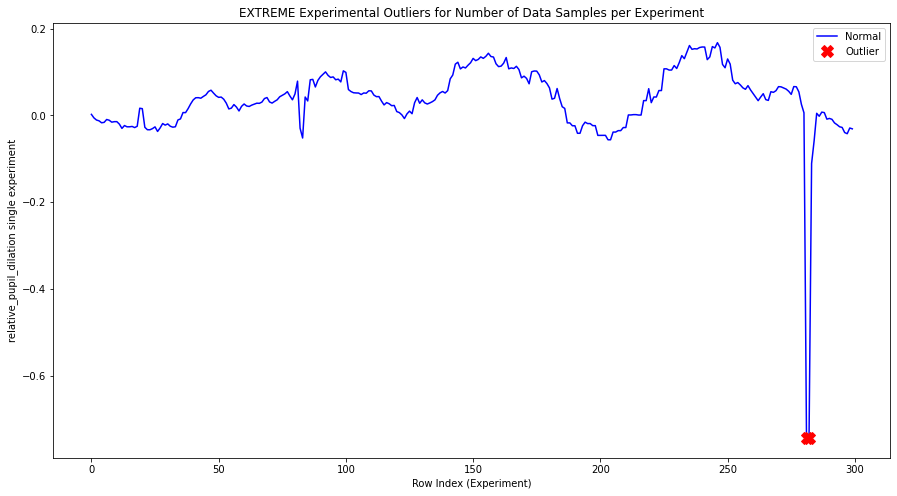

INFO:root:experiment index: 433


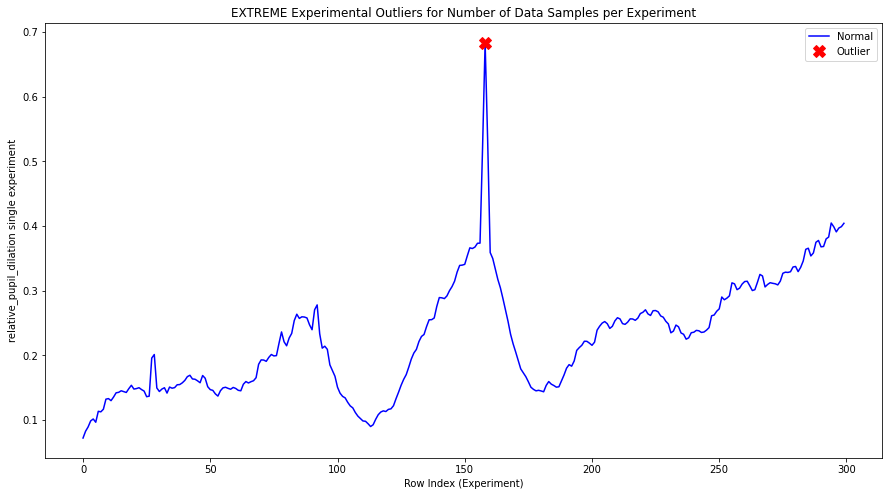

INFO:root:experiment index: 445


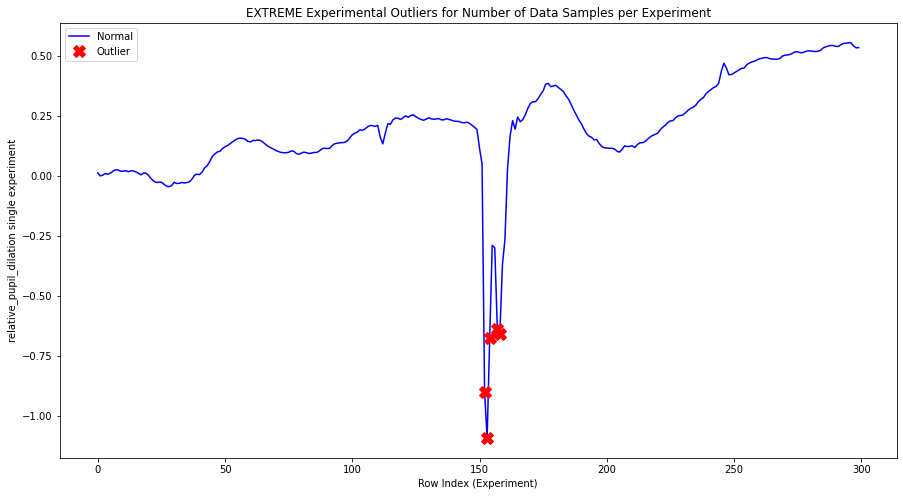

INFO:root:experiment index: 456


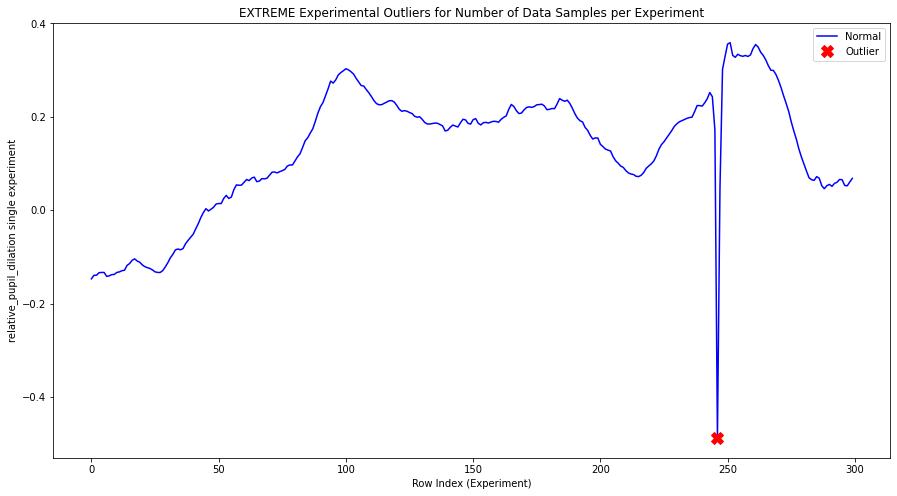

INFO:root:experiment index: 458


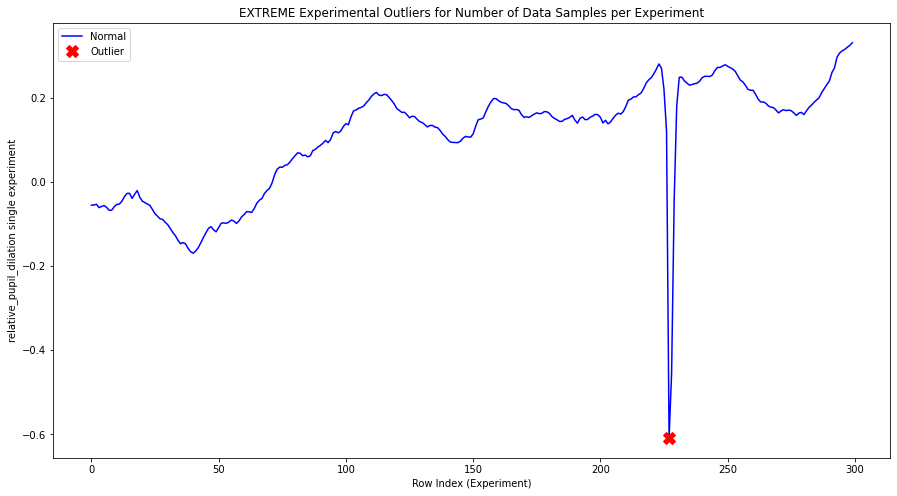

INFO:root:experiment index: 462


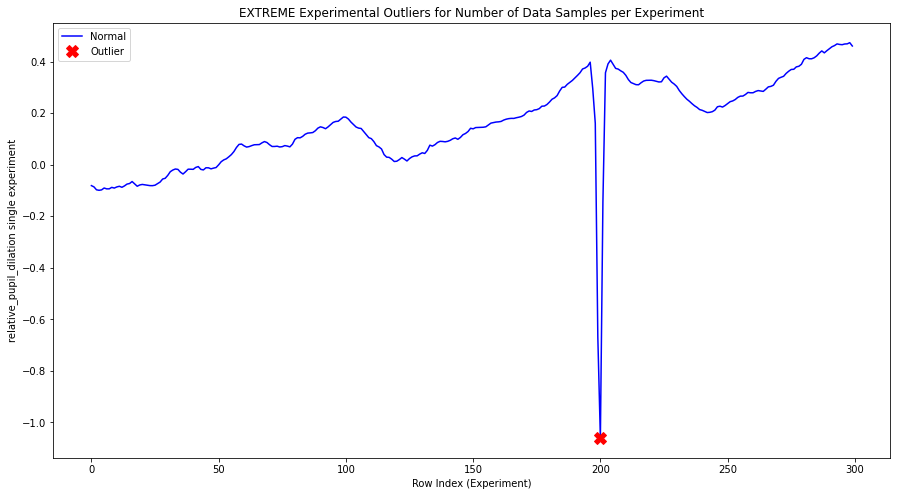

INFO:root:experiment index: 466


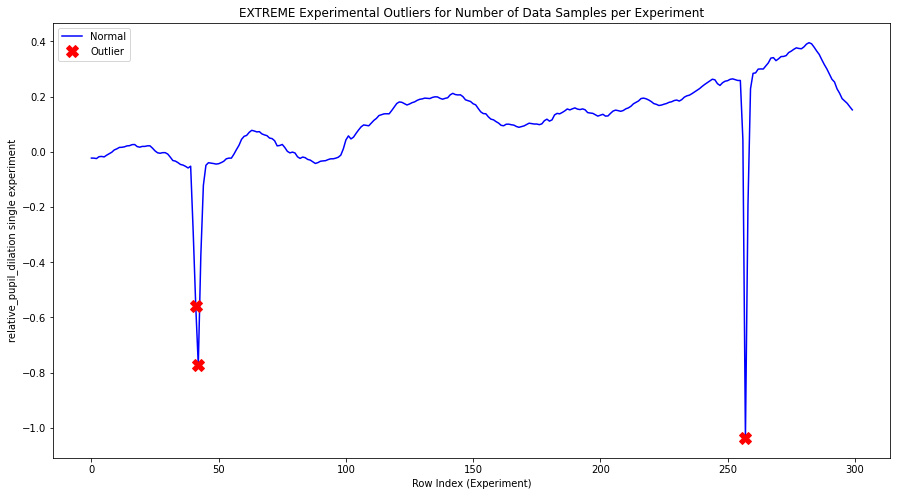

INFO:root:experiment index: 469


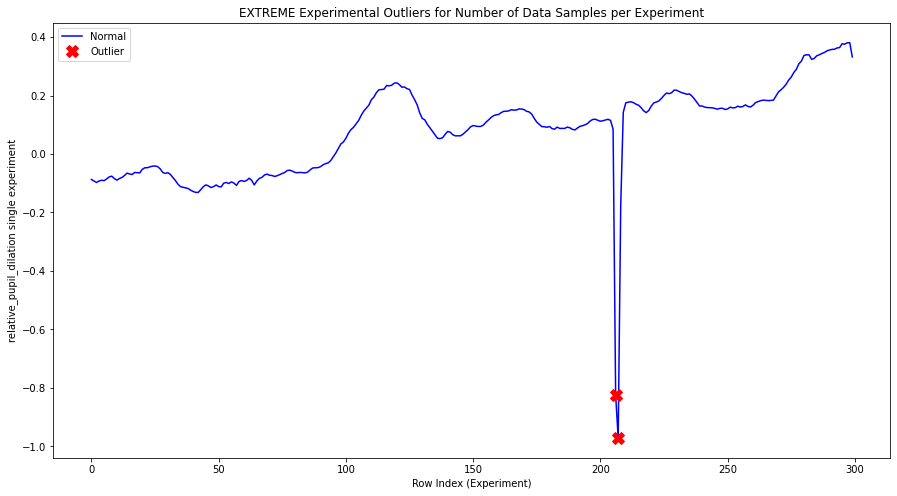

INFO:root:experiment index: 476


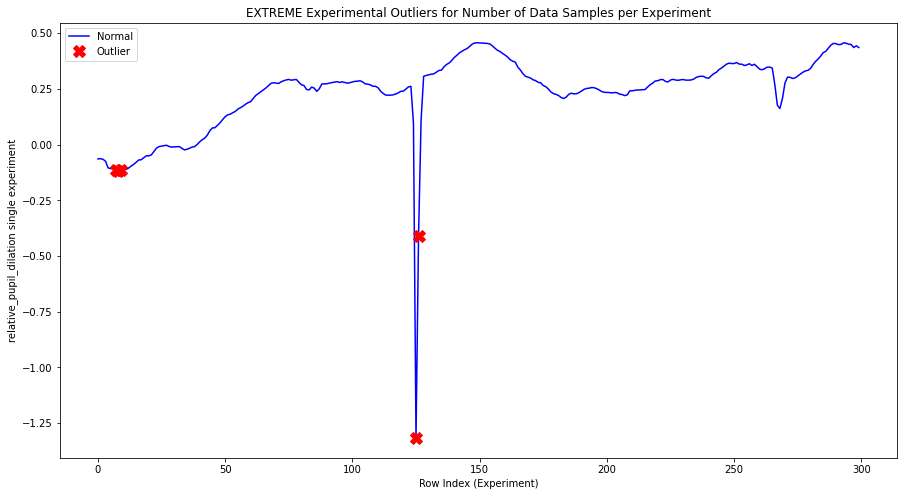

INFO:root:experiment index: 478


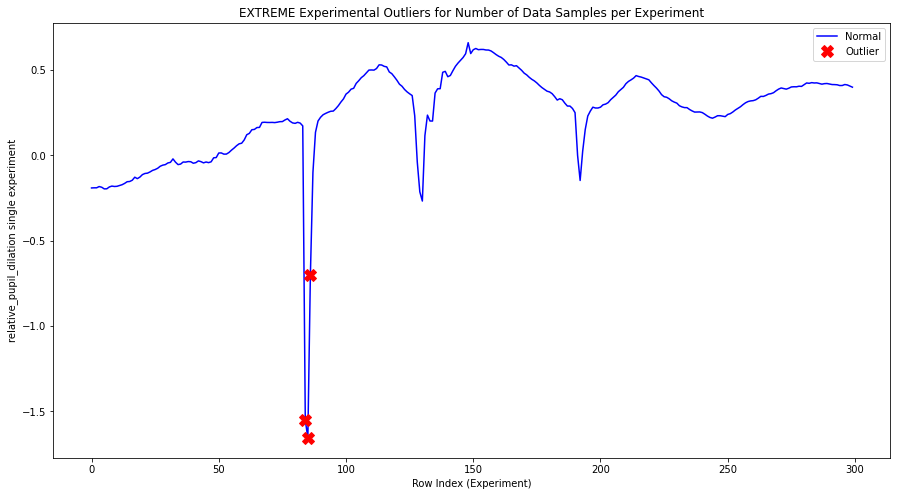

INFO:root:outliers count: {'0': 143356, '1': 644}
INFO:root:max_outlier: [56, 172]


In [14]:
from purging import iqr_analysis

# With this method we can display outlier by the statistical IQR method and 
# extract the total number of outlier and the id with max number of outliers
outliers_count, max_outliers, _ = iqr_analysis(df, 'relative_pupil_dilation', k=3, plot=True, purge=False)

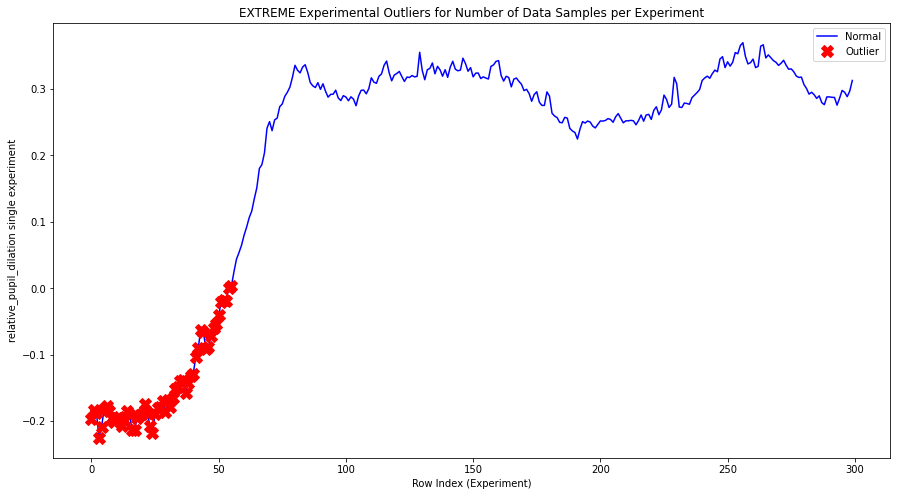

In [15]:
from purging import iqr_method
from visualizing import plot_outliers_in


plot_experiment_id = max_outliers[1]

df_max_outlier = pd.DataFrame(df['relative_pupil_dilation'][172])
df_max_outlier.columns = ['reading']
df_max_outlier = iqr_method(df_max_outlier, 3, 'reading', 'outlier')

plt.show(plot_outliers_in(df_max_outlier, 'relative_pupil_dilation'))

In [16]:
# let's remove all of this outliers and then normalize by value and lenght
outliers_count, _, df_new = iqr_analysis(df, 'relative_pupil_dilation', k=3, plot=False, purge=True)

/content/purging.py:157: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:root:outliers count: {'0': 143356, '1': 644}
INFO:root:max_outlier: [56, 172]
INFO:root:total_number_of_data_points_pre: 144000
INFO:root:total_number_of_data_points_post: 143356


In [17]:
from purging import purge_iter_iqr_method

# Let's remove all of this outliers UNTIL THERE ARE NONE, and then normalize by value and lenght
df_new_iter = purge_iter_iqr_method(df, 'relative_pupil_dilation', n_iter=4)  # purges 644 in 1st round + 100 in 5+rounds
df_new_iter

/content/purging.py:212: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:root:_________new round 0__________
INFO:root:current: {'0': 143273, '1': 83}
INFO:root:_________new round 1__________
INFO:root:current: {'0': 143255, '1': 18}
INFO:root:_________new round 2__________
INFO:root:current: {'0': 143254, '1': 1}
INFO:root:_________new round 3__________
INFO:root:current: {'0': 143254, '1': 0}
INFO:root:outliers count: {'0': 573138, '1': 746}
INFO:root:max_outlier: [56, 172]


,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating
0,9,"[3.520431518554688, 3.523624381891461, 3.52990...","[3.186676025390625, 3.186676025390625, 3.18537...","[0.1497679623690522, 0.1529608257058254, 0.159...",3.370664,298,88,0.0
1,29,"[3.508941650390625, 3.5161528316229878, 3.4989...","[3.236419677734375, 3.236419677734375, 3.23720...","[0.13551225333378225, 0.1427234345661449, 0.12...",3.373429,299,87,2.0
2,7,"[3.148483276367188, 3.14939247565126, 3.161864...","[3.209625244140625, 3.216188237908181, 3.21998...",0 -0.086011 1 -0.085102 2 -0.07263...,3.234494,299,88,3.0
3,23,"[3.440841674804688, 3.440841674804688, 3.44296...","[3.3892822265625, 3.401465255222963, 3.4095145...","[-0.07551773734714651, -0.07551773734714651, -...",3.516359,300,88,3.0
4,16,"[3.4981689453125, 3.4981689453125, 3.477034399...","[2.198760986328125, 2.5523181015186096, 2.9058...","[0.16579437255859375, 0.16579437255859375, 0.1...",3.332375,300,87,3.0
...,...,...,...,...,...,...,...,...
475,25,"[3.075332641601562, 3.0836816998229777, 3.0927...","[3.362350463867188, 3.362350463867188, 3.38753...","[-0.11277938470607873, -0.10443032648466316, -...",3.188112,299,89,1.0
476,26,"[3.139556884765625, 3.14046587991874, 3.137767...","[3.130172729492188, 3.130172729492188, 3.13621...",0 -0.064414 1 -0.063505 2 -0.06620...,3.203970,300,89,4.0
477,27,"[2.869537353515625, 2.869537353515625, 2.86495...","[3.408767700195312, 3.408767700195312, 3.41122...","[-0.2212052456168241, -0.2212052456168241, -0....",3.090743,300,89,1.0
478,2,"[3.044952392578125, 3.0457697839641256, 3.0458...","[3.248153686523438, 3.248153686523438, 3.26181...",0 -0.190953 1 -0.190136 2 -0.19008...,3.235906,300,89,2.0


In [18]:
df_new_iter.describe()

,baseline_mean,len_pupil_dilation,len_baseline,rating
count,480.000000,480.000000,480.000000,480.000000
mean,3.185397,299.652083,88.229167,2.556250
std,0.338062,0.494010,1.143915,0.921197
min,2.359526,298.000000,80.000000,0.000000
25%,2.977168,299.000000,88.000000,2.000000
50%,3.213510,300.000000,89.000000,3.000000
75%,3.385951,300.000000,89.000000,3.000000
max,4.152695,300.000000,90.000000,4.000000


##### Lenghts

In [19]:
# Detect outliers in len of series with the IQR, add new columns to DataFrame

df = iqr_method(df, 3, 'len_pupil_dilation', 'outlier_len_pupil_dilation')
df = iqr_method(df, 3, 'len_baseline', 'outlier_len_baseline')
df

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating,outlier_len_pupil_dilation,outlier_len_baseline
0,9,"[3.520431518554688, 3.523624381891461, 3.52990...","[3.186676025390625, 3.186676025390625, 3.18537...","[0.1497679623690522, 0.1529608257058254, 0.159...",3.370664,298,88,0.0,0,0
1,29,"[3.508941650390625, 3.5161528316229878, 3.4989...","[3.236419677734375, 3.236419677734375, 3.23720...","[0.13551225333378225, 0.1427234345661449, 0.12...",3.373429,299,87,2.0,0,0
2,7,"[3.148483276367188, 3.14939247565126, 3.161864...","[3.209625244140625, 3.216188237908181, 3.21998...","[-0.08601094908633433, -0.08510174980226243, -...",3.234494,299,88,3.0,0,0
3,23,"[3.440841674804688, 3.440841674804688, 3.44296...","[3.3892822265625, 3.401465255222963, 3.4095145...","[-0.07551773734714651, -0.07551773734714651, -...",3.516359,300,88,3.0,0,0
4,16,"[3.4981689453125, 3.4981689453125, 3.477034399...","[2.198760986328125, 2.5523181015186096, 2.9058...","[0.16579437255859375, 0.16579437255859375, 0.1...",3.332375,300,87,3.0,0,0
...,...,...,...,...,...,...,...,...,...,...
475,25,"[3.075332641601562, 3.0836816998229777, 3.0927...","[3.362350463867188, 3.362350463867188, 3.38753...","[-0.11277938470607873, -0.10443032648466316, -...",3.188112,299,89,1.0,0,0
476,26,"[3.139556884765625, 3.14046587991874, 3.137767...","[3.130172729492188, 3.130172729492188, 3.13621...","[-0.06441355860510534, -0.06350456345199035, -...",3.203970,300,89,4.0,0,0
477,27,"[2.869537353515625, 2.869537353515625, 2.86495...","[3.408767700195312, 3.408767700195312, 3.41122...","[-0.2212052456168241, -0.2212052456168241, -0....",3.090743,300,89,1.0,0,0
478,2,"[3.044952392578125, 3.0457697839641256, 3.0458...","[3.248153686523438, 3.248153686523438, 3.26181...","[-0.1909532092866444, -0.19013581790064377, -0...",3.235906,300,89,2.0,0,0


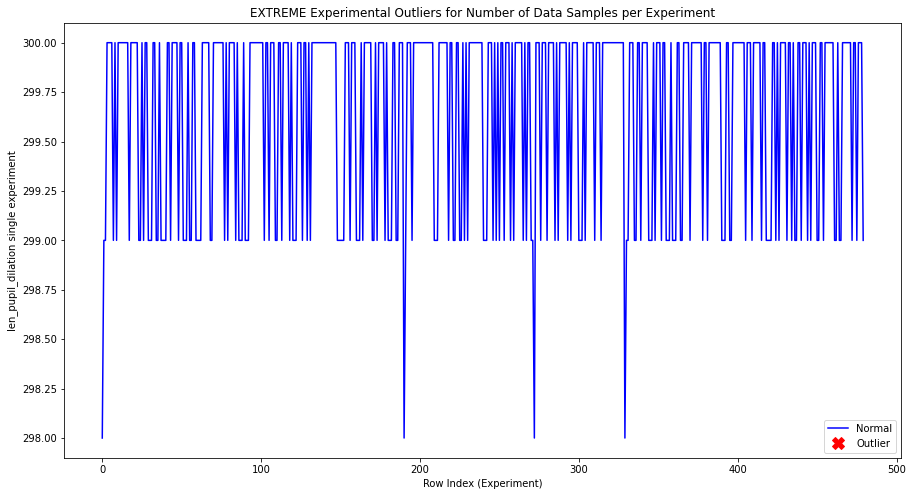

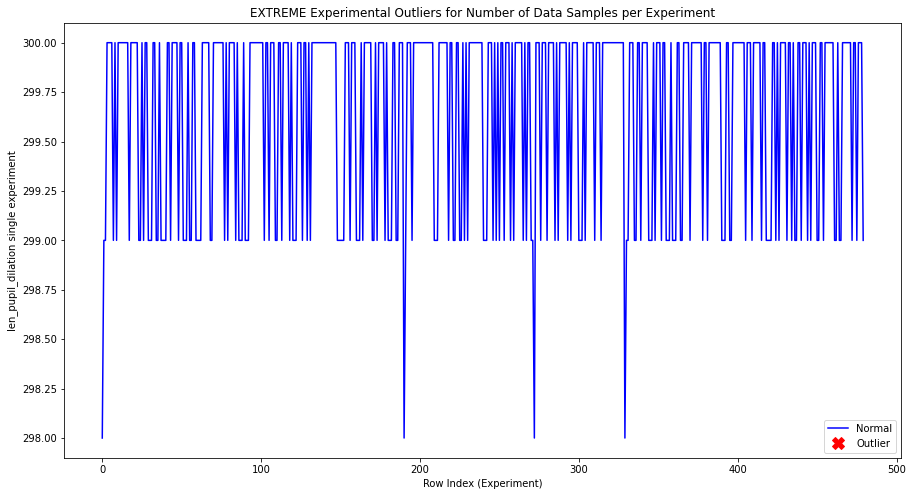

In [20]:
# Let's plot the outliers from pc1(len(ts_distance)) on top of the data and see where they occured in the time series

plot_outliers_in(df, 'len_pupil_dilation', 'outlier_len_pupil_dilation', 'len_pupil_dilation')

# no outliers for pupil dilation

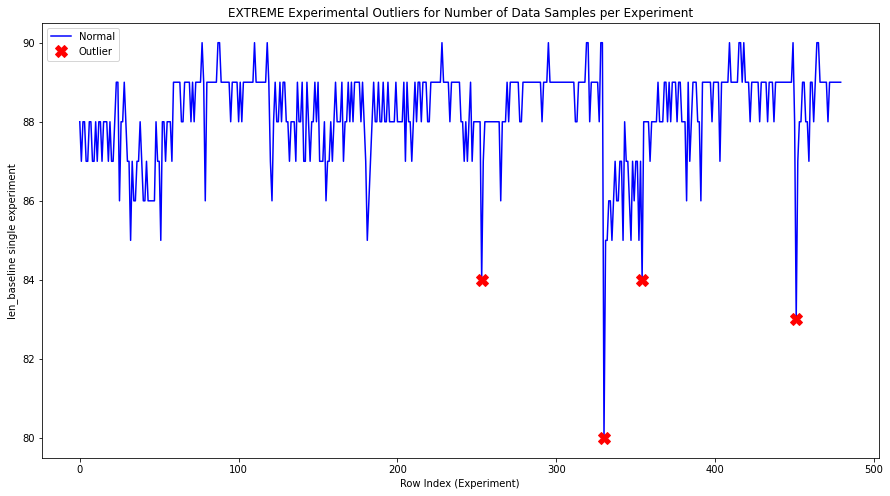

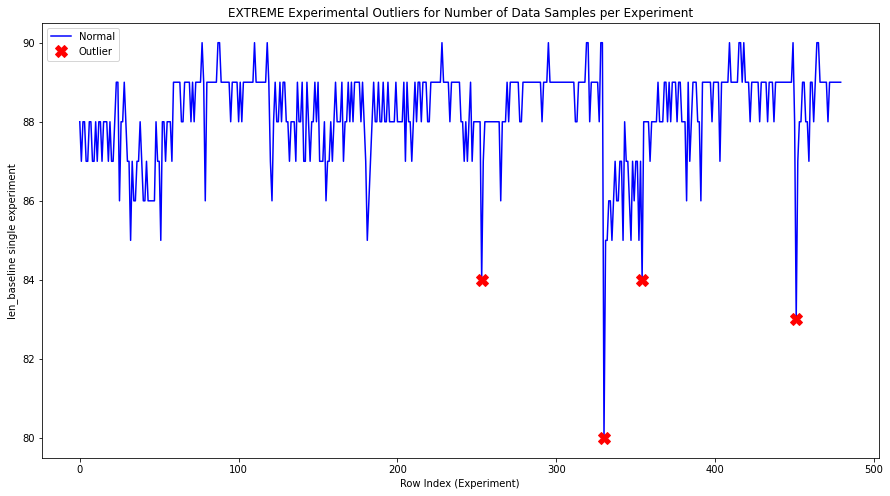

In [21]:
# Now let's plot the outliers from len(baseline) on top of the data and see where they occured in the time series

plot_outliers_in(df, 'len_baseline', 'outlier_len_baseline', 'len_baseline')

#### OUTLIER DETECTION USING MAD

In [15]:
from purging import remove_outliers_mad_single_feature

# you might want to make a copy of df before this point
df = remove_outliers_mad_single_feature(df, column='relative_pupil_dilation')

/content/purging.py:88: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:root:total number of data points in df: 144000
INFO:root:total number of outliers: 2977
INFO:root:total number of data points in df after outlier removal: 141023
INFO:root:percentaje of data points removed : 2977, 2.067361111111111%


In [16]:
# We need to normalize again
df.pupil_dilation = normalize_lengths(df.pupil_dilation.tolist())
df['baseline'] = normalize_lengths(df.baseline.tolist())
df['relative_pupil_dilation'] = normalize_lengths(df.relative_pupil_dilation.tolist())
df.head()

INFO:root:max_length: 300
INFO:root:max_length: 90
INFO:root:max_length: 300


,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating
0,16,"[2.472808837890625, 2.472808837890625, 2.48981...","[2.66839599609375, 2.669290949789326, 2.669909...","[-0.08280025828968407, -0.08280025828968407, -...",2.555609,299,88,3.0
1,13,"[2.525070190429688, 2.525070190429688, 2.53422...","[2.609207153320312, 2.6130554542112887, 2.5986...","[-0.036662836184446324, -0.036662836184446324,...",2.561733,299,88,3.0
2,14,"[2.49566650390625, 2.5090037062016615, 2.50904...","[2.620895385742188, 2.62015816334928, 2.539518...","[-0.055209806595725386, -0.04187260430031404, ...",2.550876,299,87,2.0
3,15,"[2.575531005859375, 2.575531005859375, 2.58203...","[2.608688354492188, 2.600544275862447, 2.60026...","[-0.01534184542569239, -0.01534184542569239, -...",2.590873,300,88,2.0
4,23,"[2.506988525390625, 2.621241030485734, 2.66459...","[2.589813232421875, 2.5832738983497188, 2.5768...","[-0.08129303364814078, 0.022642355602259093, 0...",2.588282,300,87,3.0


In [17]:
from preprocessing import normalize_float_resolution, normalize_float_resolution_ts

df = normalize_float_resolution_ts(df, columns=['pupil_dilation', 'relative_pupil_dilation', 'baseline'])
df = normalize_float_resolution(df, columns=['baseline_mean'])
df

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating
0,16,"[2.4728, 2.4728, 2.4898, 2.5006, 2.4999, 2.500...","[2.6684, 2.6693, 2.6699, 2.6718, 2.6713, 2.669...","[-0.0828, -0.0828, -0.0658, -0.055, -0.0557, -...",2.5556,299,88,3.0
1,13,"[2.5251, 2.5251, 2.5342, 2.5417, 2.538, 2.5316...","[2.6092, 2.6131, 2.5986, 2.6056, 2.604, 2.6033...","[-0.0367, -0.0367, -0.0275, -0.0201, -0.0238, ...",2.5617,299,88,3.0
2,14,"[2.4957, 2.509, 2.509, 2.5206, 2.5171, 2.5125,...","[2.6209, 2.6202, 2.5395, 2.5042, 2.5948, 2.611...","[-0.0552, -0.0419, -0.0418, -0.0303, -0.0338, ...",2.5509,299,87,2.0
3,15,"[2.5755, 2.5755, 2.582, 2.5833, 2.5725, 2.568,...","[2.6087, 2.6005, 2.6003, 2.6097, 2.6074, 2.595...","[-0.0153, -0.0153, -0.0088, -0.0076, -0.0183, ...",2.5909,300,88,2.0
4,23,"[2.507, 2.6212, 2.6646, 2.683, 2.677, 2.6874, ...","[2.5898, 2.5833, 2.5768, 2.5807, 2.5831, 2.586...","[-0.0813, 0.0226, 0.0685, 0.0897, 0.0909, 0.09...",2.5883,300,87,3.0
...,...,...,...,...,...,...,...,...
475,2,"[3.2679, 3.2708, 3.2697, 3.2746, 3.278, 3.2766...","[2.5795, 2.9013, 3.2602, 3.2945, 3.2955, 3.287...","[0.1085, 0.1114, 0.1104, 0.1151, 0.1186, 0.117...",3.1594,300,89,1.0
476,30,"[3.318, 3.3247, 3.3295, 3.3338, 3.3431, 3.3518...","[3.4078, 3.4078, 3.3961, 3.3817, 3.3812, 3.377...","[-0.0182, -0.0115, -0.0068, -0.0025, 0.0068, 0...",3.3363,300,89,2.0
477,14,"[3.055, 3.0669, 3.0678, 3.0693, 3.0775, 3.0844...","[3.2494, 3.2494, 3.247, 3.2353, 3.2375, 3.2424...","[-0.0486, -0.0371, -0.0359, -0.0345, -0.0271, ...",3.1036,300,88,2.0
478,8,"[3.3546, 3.3562, 3.3568, 3.359, 3.3697, 3.3771...","[3.3091, 3.2968, 3.2937, 3.2937, 3.2908, 3.290...","[0.0812, 0.0827, 0.0833, 0.0851, 0.0931, 0.100...",3.2734,300,90,1.0


#### STANDARIZE AND PREPARE LABEL FOR BINARY CLASSIFICATION

In [18]:
# Map label to binary
df['binary_rating'] = df['rating'].map(lambda i: 1 if i >2 else 0)  # type I
df['binary_rating'] = df['rating'].map(lambda i: i if i > 3 or i < 2 else "ambiguous")  # type II

# save without standarization by value and with binary rating
# df.to_csv("arup_relative_binary_nonormvalue_outliersout.csv")

In [19]:
from preprocessing import standarize

df.pupil_dilation = df.pupil_dilation.apply(standarize)
df.relative_pupil_dilation = df.relative_pupil_dilation.apply(standarize)
df.baseline = df.baseline.apply(standarize)
df

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating,binary_rating
0,16,"[-2.0267585533182086, -2.0267585533182086, -1....","[1.1972756401910056, 1.2068298771526462, 1.213...","[-2.0266466450200165, -2.0266466450200165, -1....",2.5556,299,88,3.0,ambiguous
1,13,"[-1.893634423351455, -1.893634423351455, -1.77...","[1.117729980102203, 1.2095917444123792, 0.8680...","[-1.8944747694947364, -1.8944747694947364, -1....",2.5617,299,88,3.0,ambiguous
2,14,"[-2.0565550908378403, -1.919247923616862, -1.9...","[1.3991063107976174, 1.3851159138990234, -0.22...","[-2.0566692676196414, -1.9193682622571377, -1....",2.5509,299,87,2.0,ambiguous
3,15,"[-1.863354692858858, -1.863354692858858, -1.77...","[1.0598670655720803, 0.5723744545454593, 0.560...","[-1.862432383673213, -1.862432383673213, -1.77...",2.5909,300,88,2.0,ambiguous
4,23,"[-5.990293982666911, -3.8536406889844144, -3.0...","[0.04748729932268478, -0.15454957415930878, -0...","[-6.40199848130649, -4.271437140743637, -3.330...",2.5883,300,87,3.0,ambiguous
...,...,...,...,...,...,...,...,...,...
475,2,"[-0.4226969406568401, -0.3990080500119395, -0....","[-5.008505521792287, -2.2288550675026833, 0.87...","[-0.415818485047075, -0.39181845307081514, -0....",3.1594,300,89,1.0,1.0
476,30,"[-0.9682068360618356, -0.9317347511928032, -0....","[1.6408694051749892, 1.6408694051749892, 1.372...","[-0.967889502161198, -0.9314178196592857, -0.9...",3.3363,300,89,2.0,ambiguous
477,14,"[-1.065586574965042, -1.0002681671246378, -0.9...","[1.710483691159624, 1.710483691159624, 1.68232...","[-1.0864860199095001, -1.0192693707801483, -1....",3.1036,300,88,2.0,ambiguous
478,8,"[-0.303970533019919, -0.2808731994993323, -0.2...","[1.3915781636011861, 0.9116339236078788, 0.790...","[-0.17006525321872382, -0.1448587830930937, -0...",3.2734,300,90,1.0,1.0


In [20]:
# filter the data to keep only extreme values
df = df[df['binary_rating'] != "ambiguous"]
df

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating,binary_rating
9,4,"[-0.021549126919652897, -0.06496900951895558, ...","[2.1652205443009844, 2.1652205443009844, 2.000...","[-0.020988336084529814, -0.06441247970769497, ...",2.6580,300,88,4.0,4.0
10,28,"[-2.557939897501055, -2.5803069752506635, -2.5...","[1.6955955832808436, 1.6955955832808436, 1.516...","[-2.55830717886571, -2.579952854208088, -2.535...",2.4852,299,88,4.0,4.0
12,6,"[-1.9387602530424928, -1.875335712158112, -1.9...","[2.6059756323491063, 2.431110538659322, 2.2356...","[-2.1369488394814673, -2.0662887271134927, -2....",2.5096,300,88,4.0,4.0
14,5,"[-2.6443395612026173, -2.599027084698582, -2.4...","[-0.47619413187879817, -0.6182820154471944, -0...","[-2.6441628831560737, -2.598849742729917, -2.4...",2.5123,300,87,1.0,1.0
15,8,"[-1.7952850697660394, -1.7812207109359754, -1....","[1.6798388559479172, 1.5226405226645159, 1.471...","[-1.7957292844773456, -1.7808380888186897, -1....",2.6030,300,88,1.0,1.0
...,...,...,...,...,...,...,...,...,...
471,19,"[-2.934044714333262, -2.934044714333262, -2.84...","[0.2935734333940898, 0.2907243737847089, 0.300...","[-2.935066701928575, -2.935066701928575, -2.84...",3.2423,300,88,1.0,1.0
473,13,"[-1.6947807031696962, -1.7592031337350733, -1....","[1.0425522828066187, 1.118204158270123, 1.0672...","[-1.6943231459048516, -1.7595712720968208, -1....",3.1023,300,89,4.0,4.0
475,2,"[-0.4226969406568401, -0.3990080500119395, -0....","[-5.008505521792287, -2.2288550675026833, 0.87...","[-0.415818485047075, -0.39181845307081514, -0....",3.1594,300,89,1.0,1.0
478,8,"[-0.303970533019919, -0.2808731994993323, -0.2...","[1.3915781636011861, 0.9116339236078788, 0.790...","[-0.17006525321872382, -0.1448587830930937, -0...",3.2734,300,90,1.0,1.0


In [21]:
number_of_data_points_final = len([d for ser in df.relative_pupil_dilation for d in ser])
number_of_data_points_final

39600

In [22]:
# round float values once more
df = normalize_float_resolution_ts(df, columns=['pupil_dilation', 'relative_pupil_dilation', 'baseline'])
df = normalize_float_resolution(df, columns=['baseline_mean'])
df

/content/preprocessing.py:101: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/content/preprocessing.py:112: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating,binary_rating
9,4,"[-0.0215, -0.065, -0.1783, 0.0219, -0.1108, -0...","[2.1652, 2.1652, 2.0004, 2.1181, 1.8638, 1.835...","[-0.021, -0.0644, -0.1778, 0.02, -0.1102, -0.2...",2.6580,300,88,4.0,4.0
10,28,"[-2.5579, -2.5803, -2.5349, -2.5017, -2.4093, ...","[1.6956, 1.6956, 1.5167, 1.3256, 1.1575, 1.052...","[-2.5583, -2.58, -2.5352, -2.502, -2.409, -2.3...",2.4852,299,88,4.0,4.0
12,6,"[-1.9388, -1.8753, -1.9955, -2.0957, -2.0539, ...","[2.606, 2.4311, 2.2357, 1.9605, 1.9245, 2.1302...","[-2.1369, -2.0663, -2.1744, -2.2928, -2.3032, ...",2.5096,300,88,4.0,4.0
14,5,"[-2.6443, -2.599, -2.4876, -2.4913, -2.4579, -...","[-0.4762, -0.6183, -0.483, -0.4728, -0.3838, -...","[-2.6442, -2.5988, -2.4874, -2.4911, -2.4577, ...",2.5123,300,87,1.0,1.0
15,8,"[-1.7953, -1.7812, -1.768, -1.744, -1.8979, -2...","[1.6798, 1.5226, 1.4714, 1.5179, 1.4822, 1.546...","[-1.7957, -1.7808, -1.7684, -1.7436, -1.8983, ...",2.6030,300,88,1.0,1.0
...,...,...,...,...,...,...,...,...,...
471,19,"[-2.934, -2.934, -2.8493, -2.8296, -2.8168, -2...","[0.2936, 0.2907, 0.3004, 0.3027, 0.3295, 0.364...","[-2.9351, -2.9351, -2.8492, -2.8295, -2.8167, ...",3.2423,300,88,1.0,1.0
473,13,"[-1.6948, -1.7592, -1.7856, -1.8426, -1.9203, ...","[1.0426, 1.1182, 1.0672, 0.9949, 1.0195, 1.073...","[-1.6943, -1.7596, -1.786, -1.8422, -1.9206, -...",3.1023,300,89,4.0,4.0
475,2,"[-0.4227, -0.399, -0.408, -0.368, -0.3402, -0....","[-5.0085, -2.2289, 0.8713, 1.1675, 1.1762, 1.1...","[-0.4158, -0.3918, -0.4001, -0.3612, -0.3322, ...",3.1594,300,89,1.0,1.0
478,8,"[-0.304, -0.2809, -0.2722, -0.2405, -0.086, 0....","[1.3916, 0.9116, 0.7907, 0.7907, 0.6775, 0.677...","[-0.1701, -0.1449, -0.1348, -0.1045, 0.0299, 0...",3.2734,300,90,1.0,1.0


In [23]:
df.describe()

,baseline_mean,len_pupil_dilation,len_baseline,rating
count,132.000000,132.000000,132.000000,132.00000
mean,3.210005,299.651515,88.401515,2.50000
std,0.308596,0.509226,0.995101,1.56537
min,2.366700,298.000000,85.000000,0.00000
25%,3.126950,299.000000,88.000000,1.00000
50%,3.252450,300.000000,89.000000,4.00000
75%,3.373700,300.000000,89.000000,4.00000
max,3.972400,300.000000,90.000000,4.00000


In [24]:
df.to_csv("tinder_normalized_mad_removal.csv")

#### PLOT NORMALIZED

In [25]:
pupil_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.pupil_dilation)]
relative_pupil_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.relative_pupil_dilation)]
baseline_collection = [(rating, series_i) for rating, series_i in zip(df.rating, df.baseline)]

In [26]:
HTML(plot_collection(4, pupil_collection).to_html())

INFO:root:total number of graphs: 132
/usr/local/lib/python3.8/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.


INFO:root:plots: 68


#### SAVE DATAFRAME TO ML-READY

In [27]:
df

,trial_id,pupil_dilation,baseline,relative_pupil_dilation,baseline_mean,len_pupil_dilation,len_baseline,rating,binary_rating
9,4,"[-0.0215, -0.065, -0.1783, 0.0219, -0.1108, -0...","[2.1652, 2.1652, 2.0004, 2.1181, 1.8638, 1.835...","[-0.021, -0.0644, -0.1778, 0.02, -0.1102, -0.2...",2.6580,300,88,4.0,4.0
10,28,"[-2.5579, -2.5803, -2.5349, -2.5017, -2.4093, ...","[1.6956, 1.6956, 1.5167, 1.3256, 1.1575, 1.052...","[-2.5583, -2.58, -2.5352, -2.502, -2.409, -2.3...",2.4852,299,88,4.0,4.0
12,6,"[-1.9388, -1.8753, -1.9955, -2.0957, -2.0539, ...","[2.606, 2.4311, 2.2357, 1.9605, 1.9245, 2.1302...","[-2.1369, -2.0663, -2.1744, -2.2928, -2.3032, ...",2.5096,300,88,4.0,4.0
14,5,"[-2.6443, -2.599, -2.4876, -2.4913, -2.4579, -...","[-0.4762, -0.6183, -0.483, -0.4728, -0.3838, -...","[-2.6442, -2.5988, -2.4874, -2.4911, -2.4577, ...",2.5123,300,87,1.0,1.0
15,8,"[-1.7953, -1.7812, -1.768, -1.744, -1.8979, -2...","[1.6798, 1.5226, 1.4714, 1.5179, 1.4822, 1.546...","[-1.7957, -1.7808, -1.7684, -1.7436, -1.8983, ...",2.6030,300,88,1.0,1.0
...,...,...,...,...,...,...,...,...,...
471,19,"[-2.934, -2.934, -2.8493, -2.8296, -2.8168, -2...","[0.2936, 0.2907, 0.3004, 0.3027, 0.3295, 0.364...","[-2.9351, -2.9351, -2.8492, -2.8295, -2.8167, ...",3.2423,300,88,1.0,1.0
473,13,"[-1.6948, -1.7592, -1.7856, -1.8426, -1.9203, ...","[1.0426, 1.1182, 1.0672, 0.9949, 1.0195, 1.073...","[-1.6943, -1.7596, -1.786, -1.8422, -1.9206, -...",3.1023,300,89,4.0,4.0
475,2,"[-0.4227, -0.399, -0.408, -0.368, -0.3402, -0....","[-5.0085, -2.2289, 0.8713, 1.1675, 1.1762, 1.1...","[-0.4158, -0.3918, -0.4001, -0.3612, -0.3322, ...",3.1594,300,89,1.0,1.0
478,8,"[-0.304, -0.2809, -0.2722, -0.2405, -0.086, 0....","[1.3916, 0.9116, 0.7907, 0.7907, 0.6775, 0.677...","[-0.1701, -0.1449, -0.1348, -0.1045, 0.0299, 0...",3.2734,300,90,1.0,1.0


In [28]:
# save df

df_version_1 = df.copy(deep=True).loc[:, ["pupil_dilation", "relative_pupil_dilation", "binary_rating"]]
df_version_1.columns = ["pupil_dilation", "relative_pupil_dilation", "rating"]

df_version_1.to_csv("tinder_ML-ready_extremes_mad_removal.csv")
df_version_1

,pupil_dilation,relative_pupil_dilation,rating
9,"[-0.0215, -0.065, -0.1783, 0.0219, -0.1108, -0...","[-0.021, -0.0644, -0.1778, 0.02, -0.1102, -0.2...",4.0
10,"[-2.5579, -2.5803, -2.5349, -2.5017, -2.4093, ...","[-2.5583, -2.58, -2.5352, -2.502, -2.409, -2.3...",4.0
12,"[-1.9388, -1.8753, -1.9955, -2.0957, -2.0539, ...","[-2.1369, -2.0663, -2.1744, -2.2928, -2.3032, ...",4.0
14,"[-2.6443, -2.599, -2.4876, -2.4913, -2.4579, -...","[-2.6442, -2.5988, -2.4874, -2.4911, -2.4577, ...",1.0
15,"[-1.7953, -1.7812, -1.768, -1.744, -1.8979, -2...","[-1.7957, -1.7808, -1.7684, -1.7436, -1.8983, ...",1.0
...,...,...,...
471,"[-2.934, -2.934, -2.8493, -2.8296, -2.8168, -2...","[-2.9351, -2.9351, -2.8492, -2.8295, -2.8167, ...",1.0
473,"[-1.6948, -1.7592, -1.7856, -1.8426, -1.9203, ...","[-1.6943, -1.7596, -1.786, -1.8422, -1.9206, -...",4.0
475,"[-0.4227, -0.399, -0.408, -0.368, -0.3402, -0....","[-0.4158, -0.3918, -0.4001, -0.3612, -0.3322, ...",1.0
478,"[-0.304, -0.2809, -0.2722, -0.2405, -0.086, 0....","[-0.1701, -0.1449, -0.1348, -0.1045, 0.0299, 0...",1.0


In [ ]:
df_version_1.to_csv("arup_normal_binary.csv")